In [2]:
# Import and GPU Support
import matplotlib.pyplot as plt
import numpy as np
import torch
#from torch import linspace
import os
#os.environ['CUDA_VISIBLE_DEVICES'] = '2'
import time
import pickle

from E_data import create_residual_data, create_IC_data,create_BC_data, initial_u,Move_Time_1D,create_RH_data,Euler_WENO
from E_Plotting import E_plot,  loss_plot 
from E_solver import exact_solver

# Full PINN
#from E_PINN_WE import NN
#from E_PINN_train_plot import pinn_train

# TGPT-PINN
from E_TGPT_PINN_test import GPT
#from E_TGPT_train_test import gpt_train
from E_TGPT_PINNs import GPTs
from E_TGPT_train_minibatch import gpt_train
from E_TGPT_activation import P

#torch.set_default_dtype(torch.float)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Current Device: {device}")
if torch.cuda.is_available():
    print(f"Current Device Name: {torch.cuda.get_device_name()}")

Current Device: cuda
Current Device Name: NVIDIA A100-SXM4-40GB


In [3]:
# Initial and Boundary Conditions
crhoL = 0.445
cuL = 0.698
cpL = 3.528
crhoR = 0.5
cuR = 0.0
cpR = 0.571

ini = [crhoL,cpL,cuL,crhoR,cpR,cuR]

# Domain and Data
Xi, Xf         =  0.0, 1.0
Ti, Tf         =  0.0, 0.1
Nc, N_test     =  1000, 100
Tc, T_test     =  5000, 100
N_simple       =  3000
IC_pts         =  100
N_RH           =  100
dx = 0.01
dt = 0.002

gamma =1.4
number_of_parameters = 5
number_of_neurons = 6
nu_training = np.linspace(0.48,0.68, number_of_parameters)

residual_data = create_residual_data(Xi, Xf, Ti, Tf, Nc, N_test,Tc,T_test,N_simple)
xt_resid      = residual_data[0].to(device)
f_hat         = residual_data[1].to(device)
xt_test       = residual_data[2].to(device) 

xt_RH_data = create_RH_data(Xi, Xf, Ti, Tf, IC_pts, N_RH,dx)
xt_RH = xt_RH_data[0].to(device)
xt_RHL = xt_RH_data[1].to(device)

In [4]:
number_of_neurons = 6
P_list = np.ones(number_of_neurons, dtype=object)
with open('PINNWE0410_Lax045_t01.pkl', 'rb') as f:
    PINN = pickle.load(f)
    P_list[0] = PINN
with open('PINNWE0410_Lax070_t01.pkl', 'rb') as f:
    PINN = pickle.load(f)
    P_list[1] = PINN
with open('PINNWE0410_Lax050_t01.pkl', 'rb') as f:
    PINN = pickle.load(f)
    P_list[2] = PINN
with open('PINNWE0410_Lax060_t01.pkl', 'rb') as f:
    PINN = pickle.load(f)
    P_list[3] = PINN
with open('PINNWE0410_Lax065_t01.pkl', 'rb') as f:
    PINN = pickle.load(f)
    P_list[4] = PINN
with open('PINNWE0410_Lax055_t01.pkl', 'rb') as f:
    PINN = pickle.load(f)
    P_list[5] = PINN

In [5]:
lr_pinn     = 0.001
epochs_pinn = [25000,20000,25000,25000]
layers_pinn = np.array([2, 60, 60,60,60,60, 3])
#layers_pinn = np.array([2, 30, 30,30,30, 3])
tol         = [1e-3,1e-4]

lr_tgpt          = 0.00005
epochs_tgpt      = [2000,20000]
tol_tgpt         = 1e-2

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: tensor([[1., 0.],
        [0., 1.]], device='cuda:0', dtype=torch.float64) and tensor([[1.]], device='cuda:0', dtype=torch.float64),tensor([[1.]], device='cuda:0', dtype=torch.float64),tensor([[1.]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: Loss: 102271.050763
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: Epoch: 0 | Loss: 102271.05076330606
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 500 | Loss: 2.544549
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 1000 | Loss: 2.386623
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 1500 | Loss: 2.190247
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 2000 | Loss: 1.966305
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 9.9958e-01, -3.4089e-04],
        [ 4.1285e-04,  1.0003e+00]], device='cuda:0', dtype=torch.float64) and tensor([[1.]], device='cuda:0', dtype=torch.float64),tensor([[1.]], device='cuda:0', dtype=torch.float64),tensor([[1.]], device='cuda:0', dtype=torch.flo

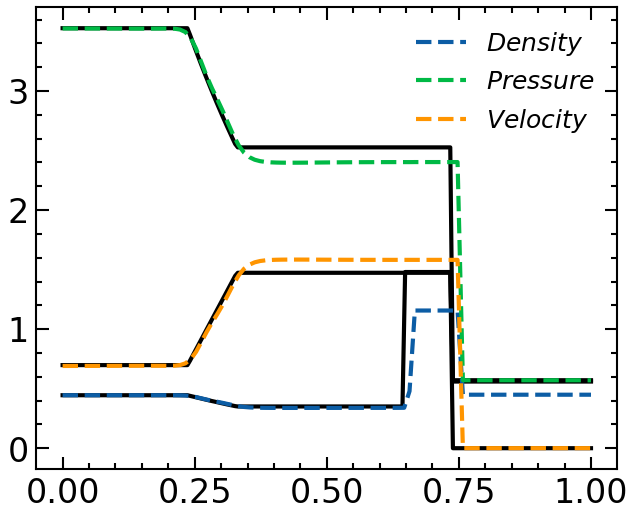

Step 2 Training Begin...
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.1431, -2.0751],
        [ 0.6421, -0.0589]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9964e-01, -2.6757e-04],
        [ 2.9878e-04,  1.0003e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0125]], device='cuda:0', dtype=torch.float64),tensor([[1.0062]], device='cuda:0', dtype=torch.float64),tensor([[0.9988]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 3000 | Loss: 0.015317


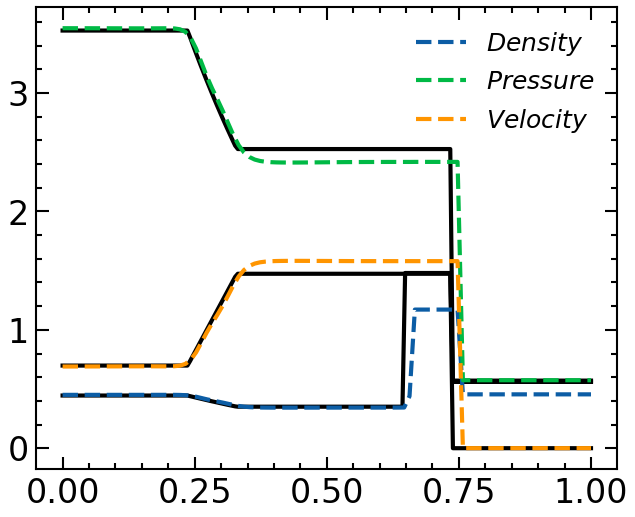

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-3.6454, -5.6427],
        [ 2.2614,  3.7424]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9958e-01, -2.4989e-04],
        [ 1.1519e-04,  1.0003e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0119]], device='cuda:0', dtype=torch.float64),tensor([[1.0064]], device='cuda:0', dtype=torch.float64),tensor([[0.9988]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 4000 | Loss: 0.015682


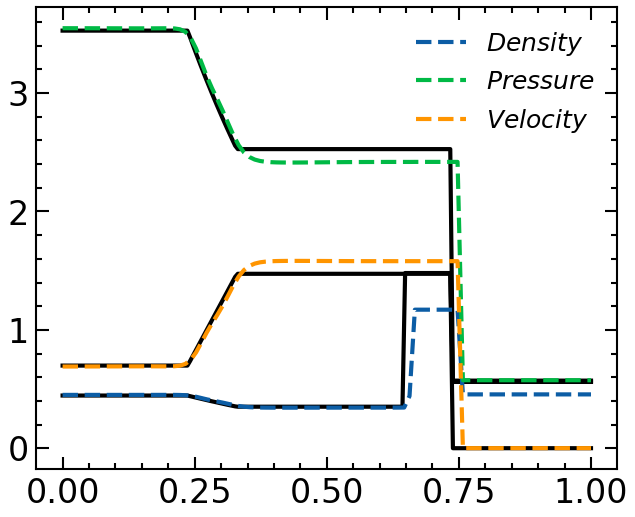

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-1.3809, -6.0401],
        [ 1.1172, -0.4609]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9938e-01, -1.9200e-04],
        [-3.0186e-04,  1.0004e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0107]], device='cuda:0', dtype=torch.float64),tensor([[1.0065]], device='cuda:0', dtype=torch.float64),tensor([[0.9989]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 5000 | Loss: 0.019386


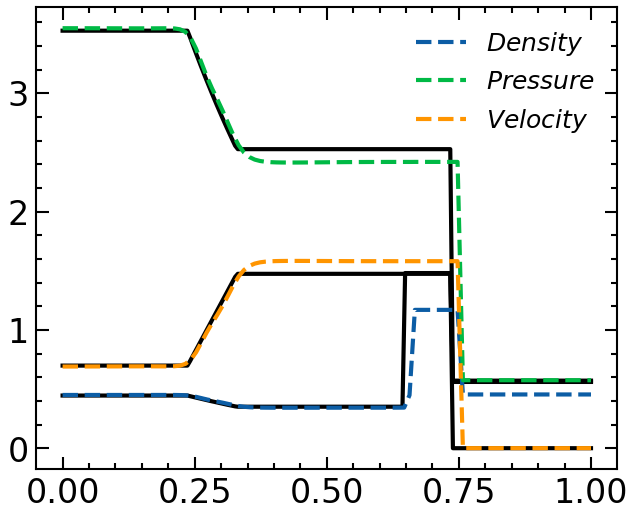

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 2.3636,  0.0155],
        [-1.0858, -3.3852]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9894e-01, -6.4841e-05],
        [-8.6322e-05,  1.0006e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0116]], device='cuda:0', dtype=torch.float64),tensor([[1.0066]], device='cuda:0', dtype=torch.float64),tensor([[0.9982]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 6000 | Loss: 0.017817


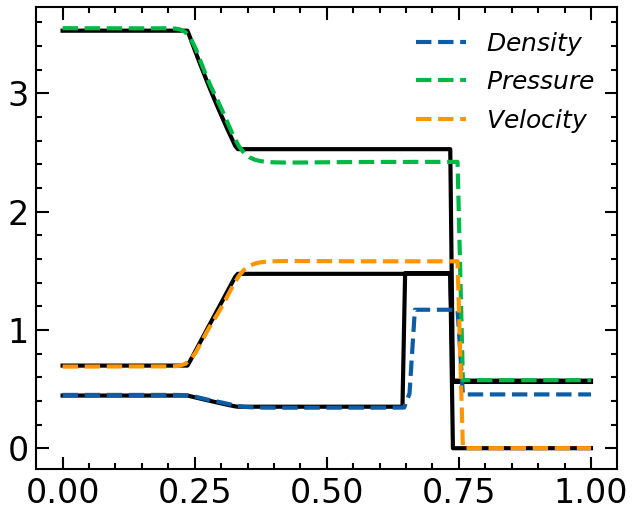

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.9597, -1.6881],
        [ 0.7834,  0.9126]], device='cuda:0', dtype=torch.float64) and tensor([[9.9783e-01, 1.3240e-04],
        [8.2036e-04, 1.0010e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0152]], device='cuda:0', dtype=torch.float64),tensor([[1.0066]], device='cuda:0', dtype=torch.float64),tensor([[0.9965]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 7000 | Loss: 0.014346


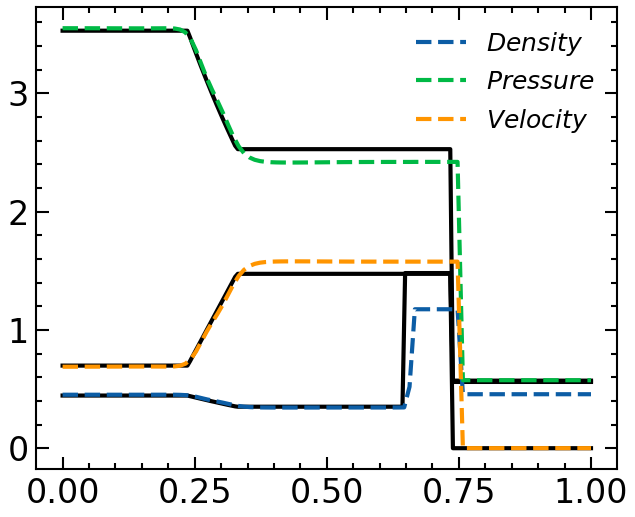

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.7772,  0.1176],
        [ 0.3281,  0.4441]], device='cuda:0', dtype=torch.float64) and tensor([[9.9529e-01, 7.4380e-04],
        [2.7796e-03, 1.0023e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0233]], device='cuda:0', dtype=torch.float64),tensor([[1.0064]], device='cuda:0', dtype=torch.float64),tensor([[0.9924]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 8000 | Loss: 0.013823


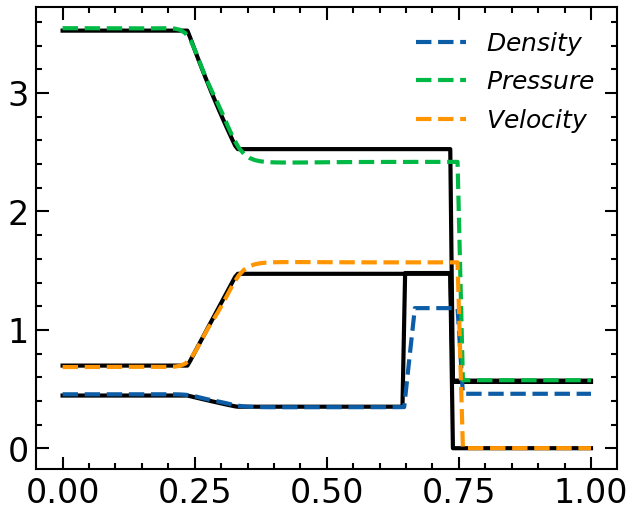

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 3.0763,  7.8876],
        [-0.8169, -1.8746]], device='cuda:0', dtype=torch.float64) and tensor([[9.9390e-01, 4.5182e-04],
        [2.3378e-03, 1.0029e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0277]], device='cuda:0', dtype=torch.float64),tensor([[1.0054]], device='cuda:0', dtype=torch.float64),tensor([[0.9903]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 9000 | Loss: 0.018299


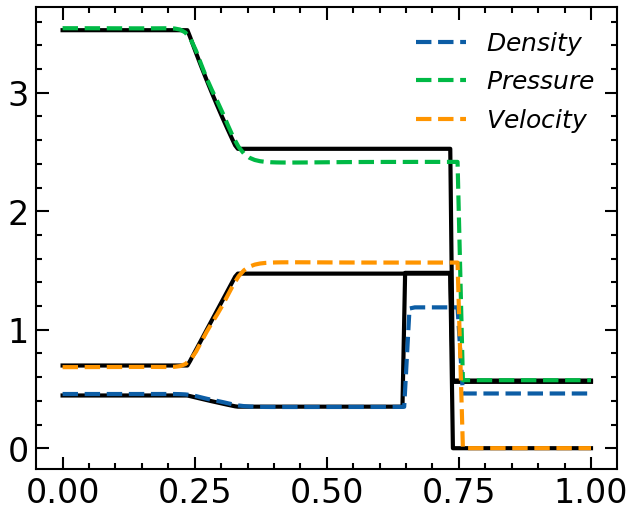

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 1.3054,  0.6455],
        [-0.4067, -1.1571]], device='cuda:0', dtype=torch.float64) and tensor([[9.9162e-01, 3.8583e-04],
        [1.7555e-03, 1.0029e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0312]], device='cuda:0', dtype=torch.float64),tensor([[1.0051]], device='cuda:0', dtype=torch.float64),tensor([[0.9883]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 10000 | Loss: 0.012189


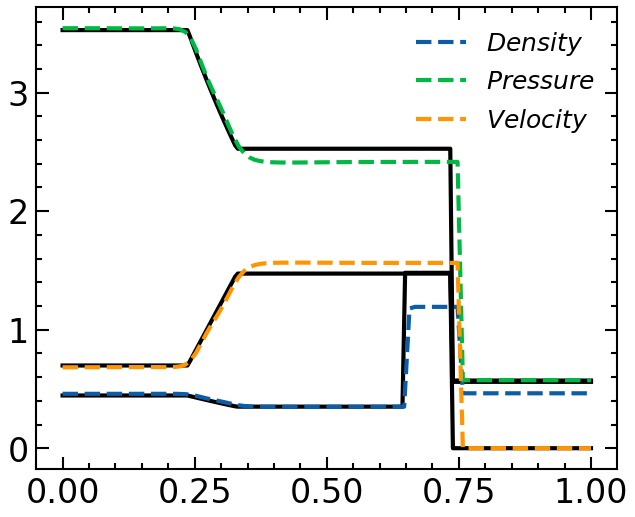

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-1.2383, -2.3184],
        [ 0.8580,  1.4521]], device='cuda:0', dtype=torch.float64) and tensor([[9.8890e-01, 3.9262e-04],
        [1.6701e-03, 1.0031e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0364]], device='cuda:0', dtype=torch.float64),tensor([[1.0051]], device='cuda:0', dtype=torch.float64),tensor([[0.9854]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 11000 | Loss: 0.011952


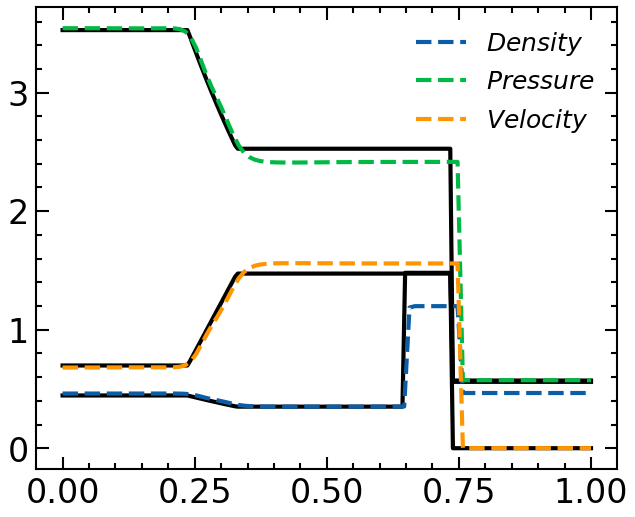

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0901, -3.4106],
        [ 0.1005,  1.0313]], device='cuda:0', dtype=torch.float64) and tensor([[9.8599e-01, 4.4453e-04],
        [1.7424e-03, 1.0040e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0437]], device='cuda:0', dtype=torch.float64),tensor([[1.0044]], device='cuda:0', dtype=torch.float64),tensor([[0.9816]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 12000 | Loss: 0.010935


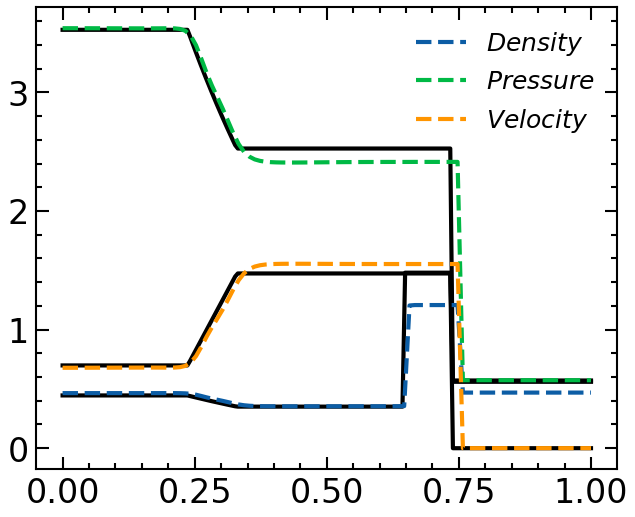

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-4.1331, 11.9124],
        [-2.0925,  2.3525]], device='cuda:0', dtype=torch.float64) and tensor([[0.9855, 0.0015],
        [0.0018, 1.0044]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0324]], device='cuda:0', dtype=torch.float64),tensor([[1.0015]], device='cuda:0', dtype=torch.float64),tensor([[0.9822]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 13000 | Loss: 0.022170


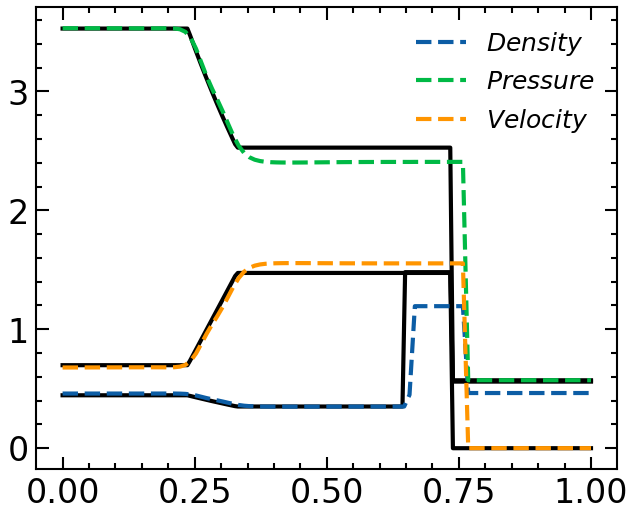

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 5.9379, 13.7059],
        [-5.1178, -5.5366]], device='cuda:0', dtype=torch.float64) and tensor([[0.9855, 0.0015],
        [0.0030, 1.0044]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0367]], device='cuda:0', dtype=torch.float64),tensor([[1.0015]], device='cuda:0', dtype=torch.float64),tensor([[0.9813]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 14000 | Loss: 0.013750


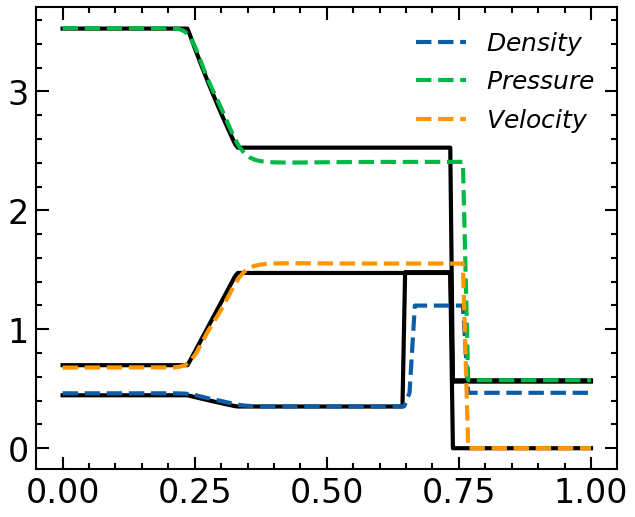

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.2189,  0.2091],
        [ 0.0862,  0.4886]], device='cuda:0', dtype=torch.float64) and tensor([[0.9860, 0.0014],
        [0.0044, 1.0043]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0407]], device='cuda:0', dtype=torch.float64),tensor([[1.0015]], device='cuda:0', dtype=torch.float64),tensor([[0.9812]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 15000 | Loss: 0.010734


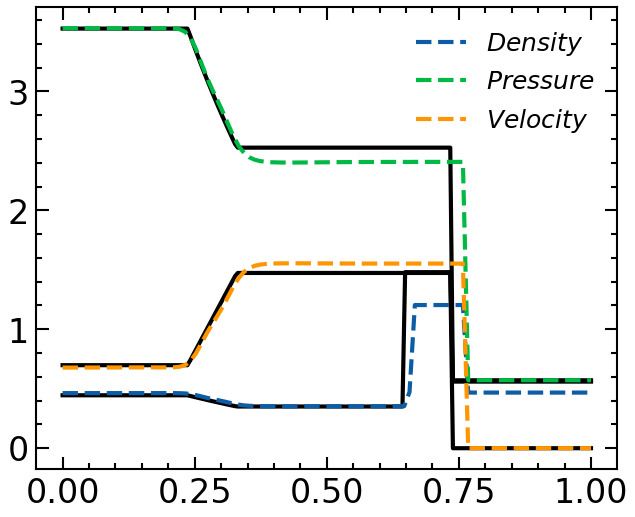

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.0259,  4.2208],
        [-0.1739, -1.3586]], device='cuda:0', dtype=torch.float64) and tensor([[0.9865, 0.0014],
        [0.0047, 1.0042]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0406]], device='cuda:0', dtype=torch.float64),tensor([[1.0016]], device='cuda:0', dtype=torch.float64),tensor([[0.9816]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 16000 | Loss: 0.015286


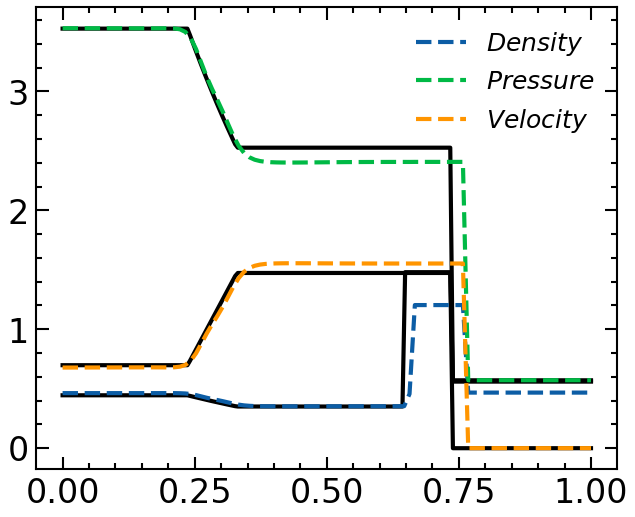

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 1.0051, 20.4464],
        [-1.6185, -6.4486]], device='cuda:0', dtype=torch.float64) and tensor([[0.9869, 0.0017],
        [0.0043, 1.0038]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0351]], device='cuda:0', dtype=torch.float64),tensor([[1.0019]], device='cuda:0', dtype=torch.float64),tensor([[0.9829]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 17000 | Loss: 0.071892


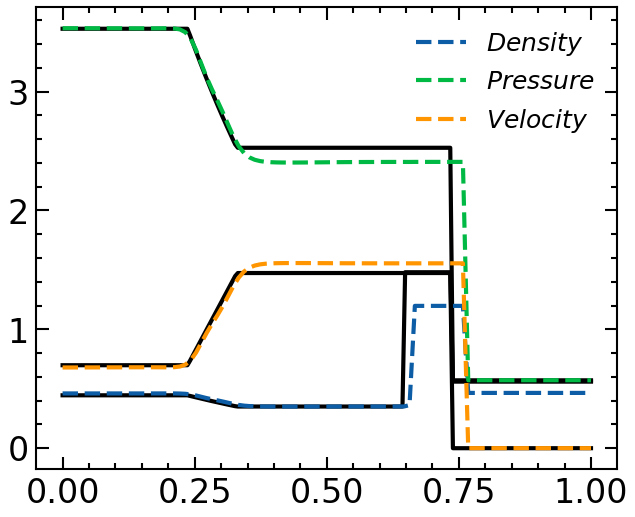

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ -28.1480, -276.8560],
        [   9.8926,  115.0930]], device='cuda:0', dtype=torch.float64) and tensor([[0.9870, 0.0017],
        [0.0043, 1.0037]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0351]], device='cuda:0', dtype=torch.float64),tensor([[1.0018]], device='cuda:0', dtype=torch.float64),tensor([[0.9830]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 18000 | Loss: 0.088201


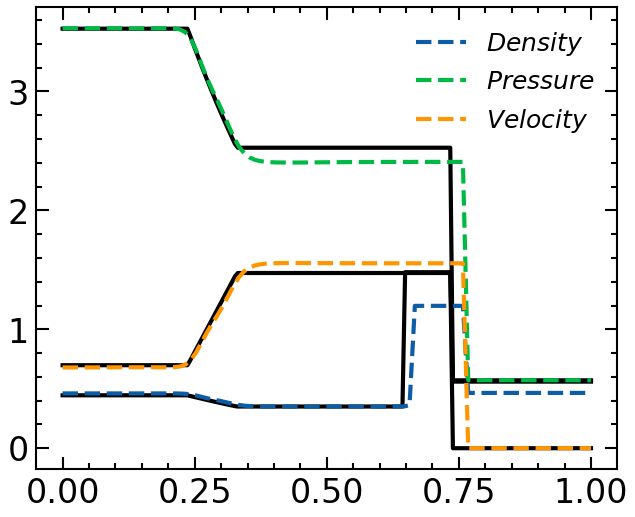

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[  27.1740,  353.7584],
        [ -12.2863, -137.3020]], device='cuda:0', dtype=torch.float64) and tensor([[0.9872, 0.0017],
        [0.0044, 1.0037]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0348]], device='cuda:0', dtype=torch.float64),tensor([[1.0018]], device='cuda:0', dtype=torch.float64),tensor([[0.9832]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 19000 | Loss: 0.075497


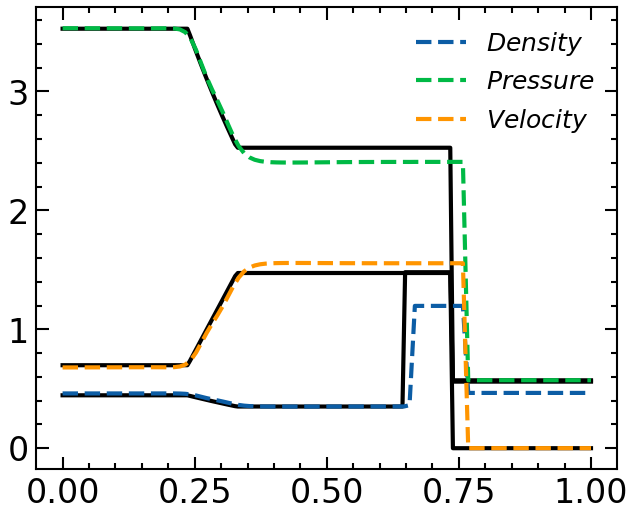

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[0.9877, 0.0016],
        [0.0049, 1.0037]], device='cuda:0', dtype=torch.float64) and tensor([[1.0363]], device='cuda:0', dtype=torch.float64),tensor([[1.0022]], device='cuda:0', dtype=torch.float64),tensor([[0.9833]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 20000 | Loss: 0.012059 (TGPT_PINN2 Step Criteria Met)



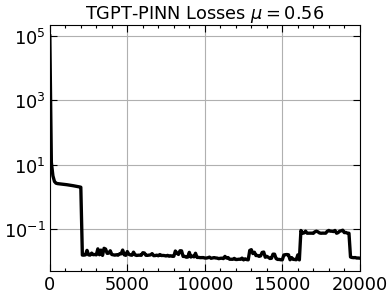

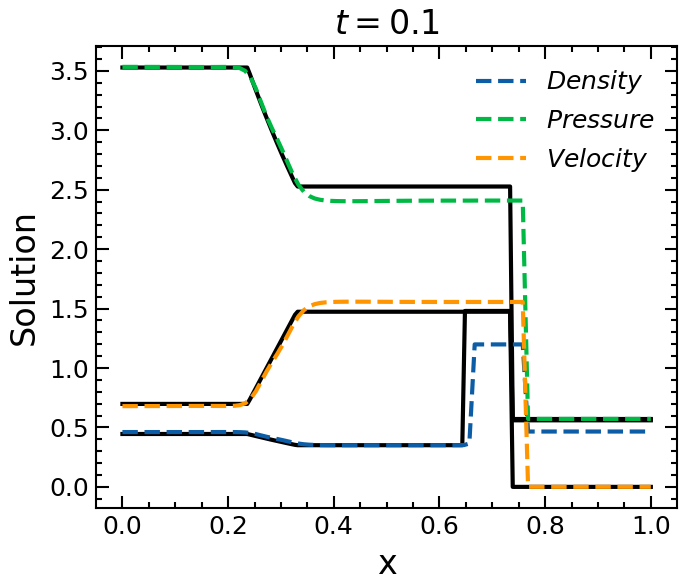

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: tensor([[1., 0.],
        [0., 1.]], device='cuda:0', dtype=torch.float64) and tensor([[0.5000, 0.5000]], device='cuda:0', dtype=torch.float64),tensor([[0.5000, 0.5000]], device='cuda:0', dtype=torch.float64),tensor([[0.5000, 0.5000]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: Loss: 56099.777559
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: Epoch: 0 | Loss: 56099.77755869572
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 500 | Loss: 21.017279
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 1000 | Loss: 19.237687
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 1500 | Loss: 17.838583
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 2000 | Loss: 16.837056
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 9.9984e-01, -1.9001e-04],
        [ 1.6368e-04,  1.0002e+00]], device='cuda:0', dtype=torch.float64) and tensor([[0.5000, 0.5000]], device='cuda:0', dtype=torch.float64),tensor([[0.5000, 0.5000]], device='cuda:0', dtype=

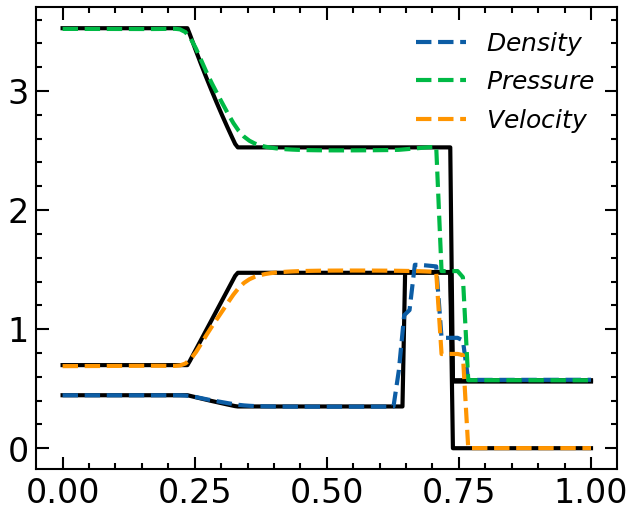

Step 2 Training Begin...
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ -6.8886, -19.1612],
        [ -4.1595,  17.9838]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0010e+00, -7.1515e-04],
        [ 7.0676e-03,  9.9915e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[0.9251, 0.0241]], device='cuda:0', dtype=torch.float64),tensor([[0.7083, 0.2610]], device='cuda:0', dtype=torch.float64),tensor([[0.7088, 0.3251]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 3000 | Loss: 0.270802


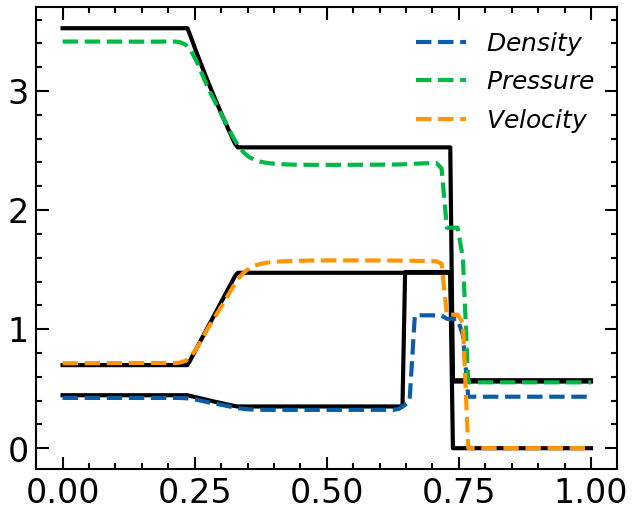

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 3.4138, -5.2491],
        [ 0.1519,  2.1988]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0033e+00, -6.4027e-04],
        [ 1.0386e-02,  9.9851e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[0.9955, 0.0072]], device='cuda:0', dtype=torch.float64),tensor([[0.9134, 0.0866]], device='cuda:0', dtype=torch.float64),tensor([[0.9129, 0.0961]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 4000 | Loss: 0.038012


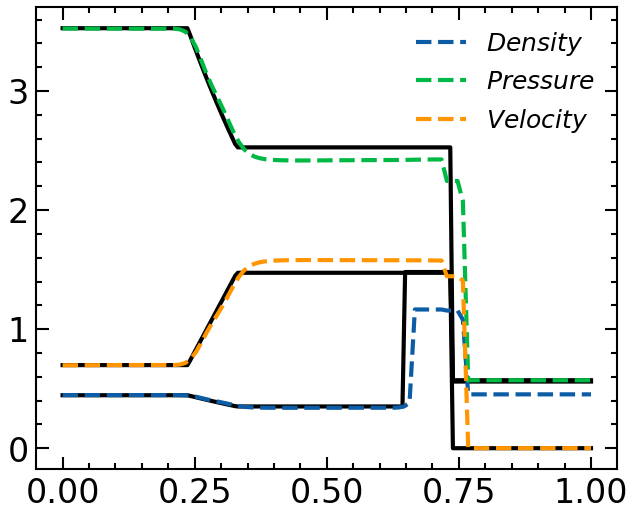

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 1.6453, 10.7444],
        [-0.0330, -2.4720]], device='cuda:0', dtype=torch.float64) and tensor([[9.9877e-01, 1.6254e-04],
        [4.6577e-03, 9.9876e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0040, 0.0025]], device='cuda:0', dtype=torch.float64),tensor([[0.9810, 0.0214]], device='cuda:0', dtype=torch.float64),tensor([[0.9788, 0.0212]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 5000 | Loss: 0.017907


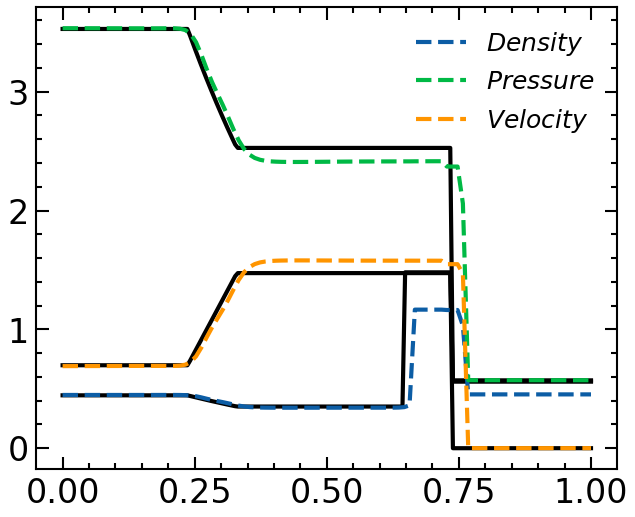

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.8692,  2.9678],
        [ 0.0177, -1.6669]], device='cuda:0', dtype=torch.float64) and tensor([[9.9867e-01, 1.9614e-04],
        [4.4606e-03, 9.9875e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0047, 0.0018]], device='cuda:0', dtype=torch.float64),tensor([[0.9862, 0.0163]], device='cuda:0', dtype=torch.float64),tensor([[0.9839, 0.0156]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 6000 | Loss: 0.015767


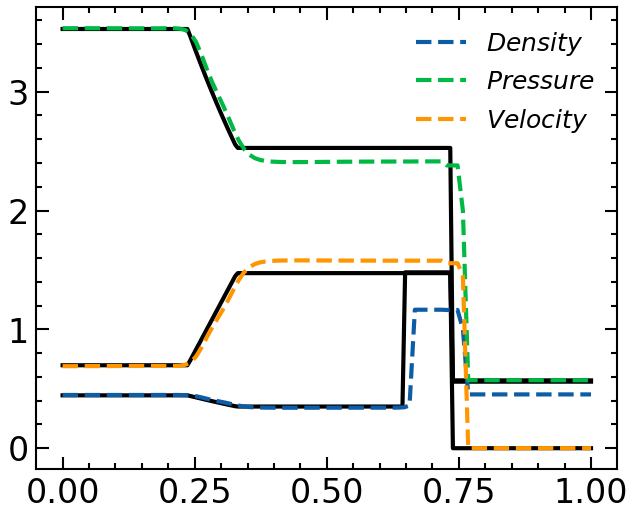

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 1.3097, -8.4575],
        [ 1.5997,  3.9740]], device='cuda:0', dtype=torch.float64) and tensor([[9.9866e-01, 1.9644e-04],
        [4.4442e-03, 9.9875e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0050, 0.0019]], device='cuda:0', dtype=torch.float64),tensor([[0.9890, 0.0133]], device='cuda:0', dtype=torch.float64),tensor([[0.9869, 0.0121]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 7000 | Loss: 0.019190


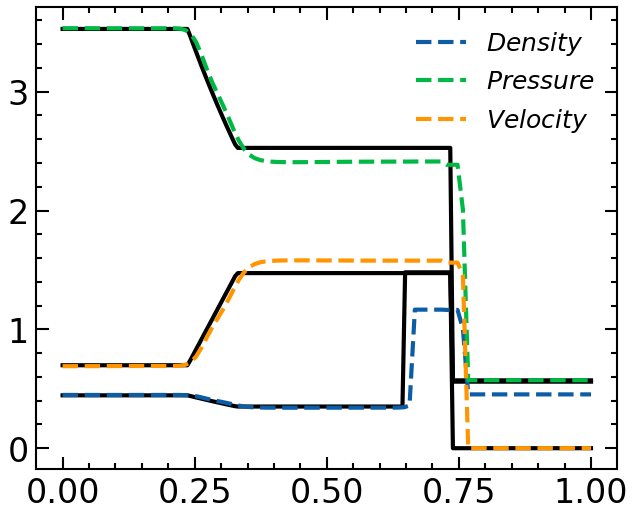

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 1.2966, -5.4633],
        [ 1.1863,  2.1538]], device='cuda:0', dtype=torch.float64) and tensor([[9.9860e-01, 1.9711e-04],
        [4.3738e-03, 9.9875e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0048, 0.0019]], device='cuda:0', dtype=torch.float64),tensor([[0.9862, 0.0159]], device='cuda:0', dtype=torch.float64),tensor([[0.9840, 0.0160]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 8000 | Loss: 0.017513


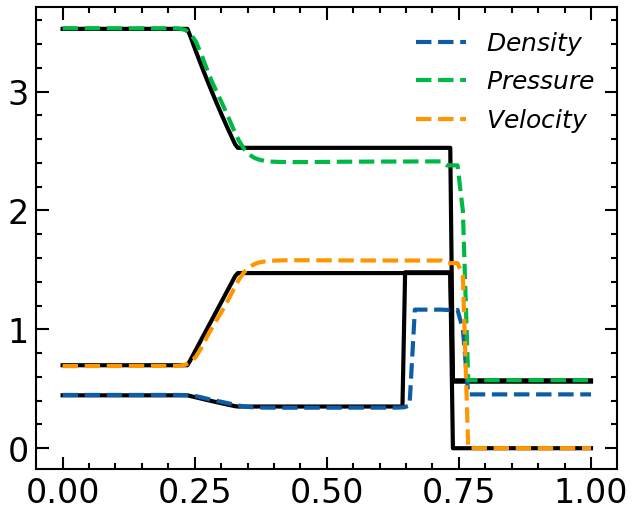

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0698,  1.1226],
        [-0.0484,  0.3306]], device='cuda:0', dtype=torch.float64) and tensor([[9.9842e-01, 2.0309e-04],
        [4.0567e-03, 9.9874e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0050, 0.0020]], device='cuda:0', dtype=torch.float64),tensor([[0.9872, 0.0152]], device='cuda:0', dtype=torch.float64),tensor([[0.9846, 0.0149]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 9000 | Loss: 0.015043


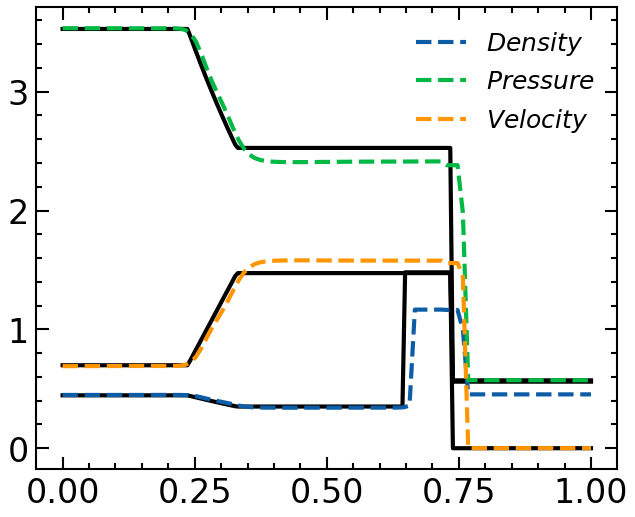

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[  4.3192,  31.6609],
        [ -1.0055, -10.8792]], device='cuda:0', dtype=torch.float64) and tensor([[9.9808e-01, 2.1952e-04],
        [3.0352e-03, 9.9864e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0048, 0.0014]], device='cuda:0', dtype=torch.float64),tensor([[0.9909, 0.0117]], device='cuda:0', dtype=torch.float64),tensor([[0.9876, 0.0119]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 10000 | Loss: 0.015991


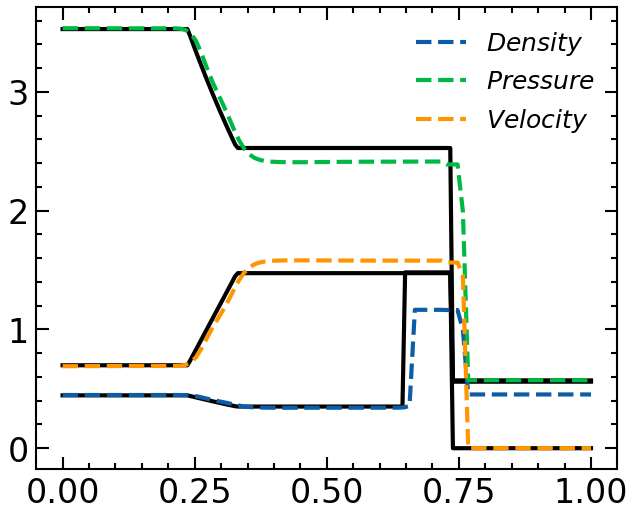

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ -0.6184, -13.7176],
        [  0.6011,   4.5564]], device='cuda:0', dtype=torch.float64) and tensor([[9.9772e-01, 2.7172e-04],
        [1.9681e-03, 9.9844e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0054, 0.0012]], device='cuda:0', dtype=torch.float64),tensor([[0.9949, 0.0075]], device='cuda:0', dtype=torch.float64),tensor([[0.9909, 0.0086]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 11000 | Loss: 0.015423


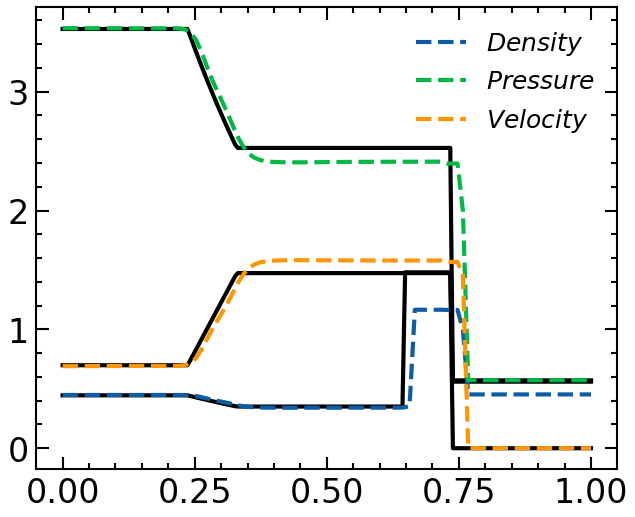

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.4867,  1.0115],
        [-0.2269,  0.4875]], device='cuda:0', dtype=torch.float64) and tensor([[9.9793e-01, 3.7272e-04],
        [1.7540e-03, 9.9836e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0031e+00, 9.8981e-04]], device='cuda:0', dtype=torch.float64),tensor([[0.9967, 0.0046]], device='cuda:0', dtype=torch.float64),tensor([[0.9945, 0.0051]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 12000 | Loss: 0.013730


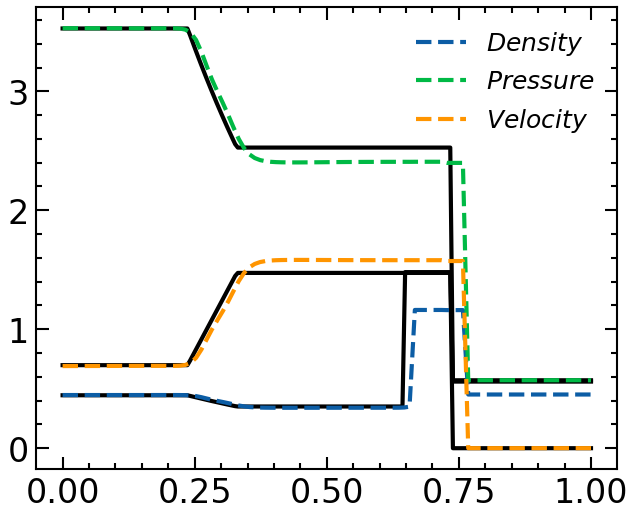

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ -3.7192, -59.2112],
        [  1.6721,  23.3249]], device='cuda:0', dtype=torch.float64) and tensor([[9.9805e-01, 3.8114e-04],
        [1.6444e-03, 9.9835e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0028, 0.0011]], device='cuda:0', dtype=torch.float64),tensor([[0.9969, 0.0043]], device='cuda:0', dtype=torch.float64),tensor([[0.9949, 0.0049]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 13000 | Loss: 0.018996


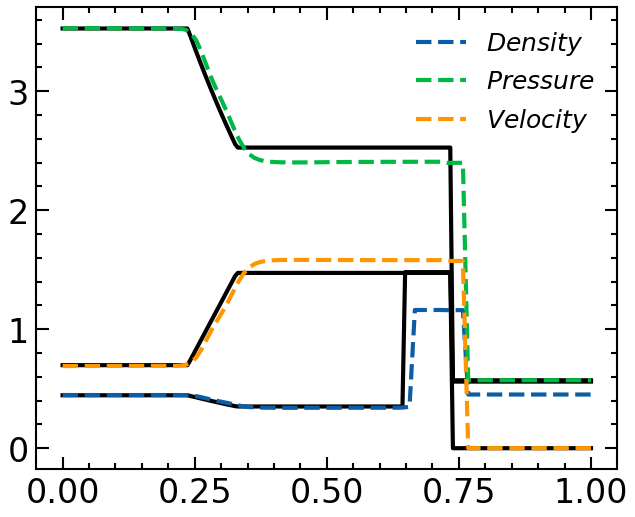

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[  6.2108, 204.9558],
        [ -2.6510, -81.1551]], device='cuda:0', dtype=torch.float64) and tensor([[9.9808e-01, 3.8287e-04],
        [1.6479e-03, 9.9835e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0029, 0.0011]], device='cuda:0', dtype=torch.float64),tensor([[0.9970, 0.0042]], device='cuda:0', dtype=torch.float64),tensor([[0.9950, 0.0048]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 14000 | Loss: 0.015321


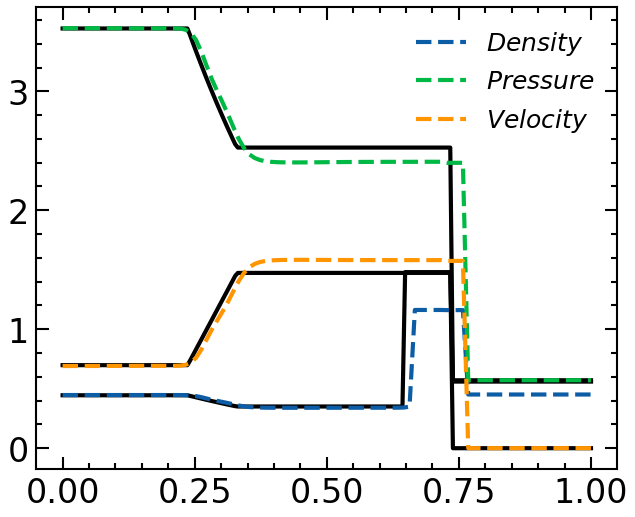

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.5889,  2.8138],
        [-0.9121, -0.7505]], device='cuda:0', dtype=torch.float64) and tensor([[9.9857e-01, 6.0374e-04],
        [1.2913e-03, 9.9812e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0008e+00, 2.9395e-04]], device='cuda:0', dtype=torch.float64),tensor([[ 1.0022e+00, -4.0496e-04]], device='cuda:0', dtype=torch.float64),tensor([[1.0003e+00, 2.8983e-04]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 15000 | Loss: 0.014093


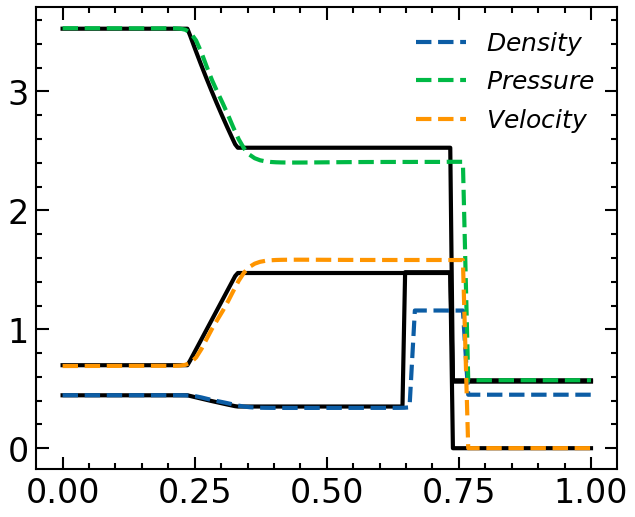

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 1.7461,  3.0171],
        [-1.0858, -1.5146]], device='cuda:0', dtype=torch.float64) and tensor([[9.9851e-01, 5.6939e-04],
        [1.5535e-03, 9.9813e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0016e+00, 3.4407e-04]], device='cuda:0', dtype=torch.float64),tensor([[1.0017e+00, 1.9505e-05]], device='cuda:0', dtype=torch.float64),tensor([[9.9990e-01, 3.6243e-04]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 16000 | Loss: 0.013944


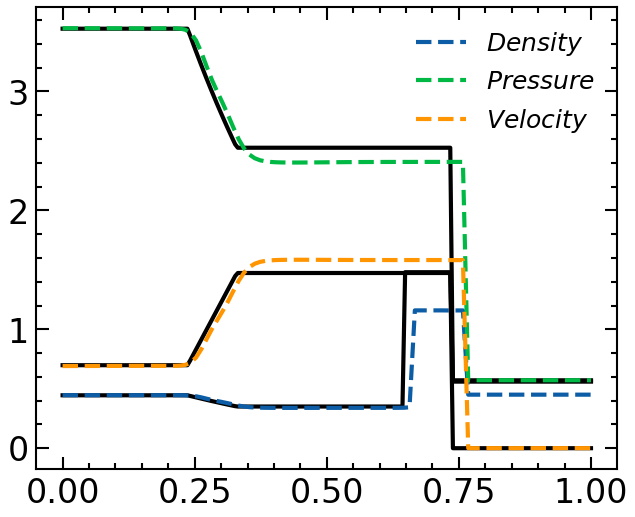

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.6073, -0.2527],
        [-0.0110, -0.0885]], device='cuda:0', dtype=torch.float64) and tensor([[9.9830e-01, 5.3008e-04],
        [1.9642e-03, 9.9815e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0029e+00, 3.4565e-04]], device='cuda:0', dtype=torch.float64),tensor([[1.0012e+00, 3.3690e-04]], device='cuda:0', dtype=torch.float64),tensor([[9.9930e-01, 4.3572e-04]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 17000 | Loss: 0.014230


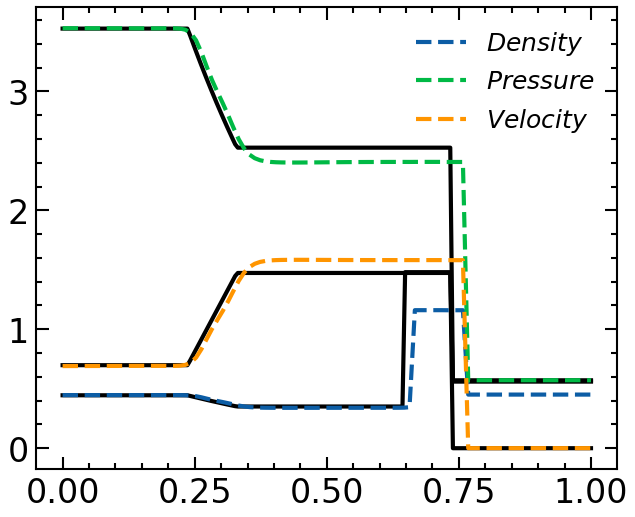

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.1943, -0.2082],
        [ 0.1180,  0.6999]], device='cuda:0', dtype=torch.float64) and tensor([[9.9752e-01, 5.4845e-04],
        [2.1790e-03, 9.9823e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0047e+00, 2.7660e-04]], device='cuda:0', dtype=torch.float64),tensor([[1.0011e+00, 3.9543e-04]], device='cuda:0', dtype=torch.float64),tensor([[9.9854e-01, 2.0745e-04]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 18000 | Loss: 0.014350


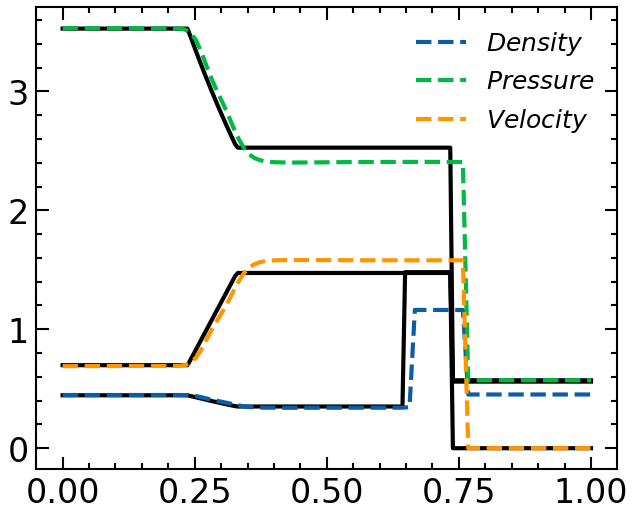

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 5.0833,  0.0958],
        [-2.9558, -4.1063]], device='cuda:0', dtype=torch.float64) and tensor([[9.9620e-01, 3.0484e-04],
        [2.5883e-03, 9.9887e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.0044, 0.0021]], device='cuda:0', dtype=torch.float64),tensor([[ 0.9996, -0.0011]], device='cuda:0', dtype=torch.float64),tensor([[ 0.9993, -0.0048]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 19000 | Loss: 0.022772


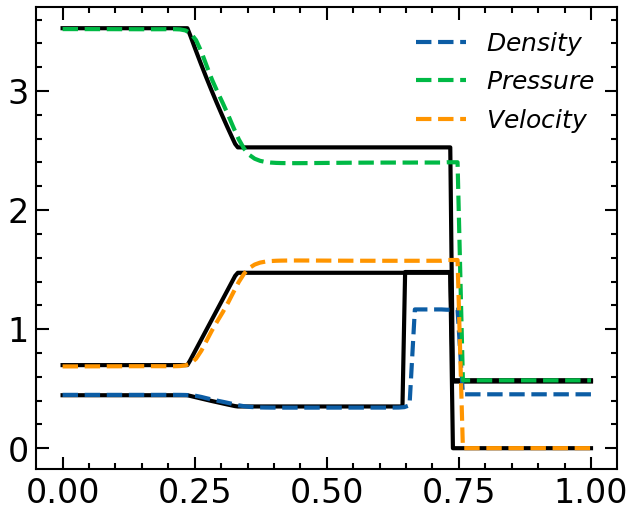

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[9.9597e-01, 2.9993e-04],
        [2.6292e-03, 9.9888e-01]], device='cuda:0', dtype=torch.float64) and tensor([[1.0129, 0.0018]], device='cuda:0', dtype=torch.float64),tensor([[0.9961, 0.0091]], device='cuda:0', dtype=torch.float64),tensor([[0.9872, 0.0098]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 20000 | Loss: 0.014268 (TGPT_PINN2 Step Criteria Met)



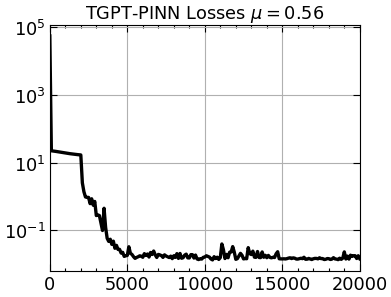

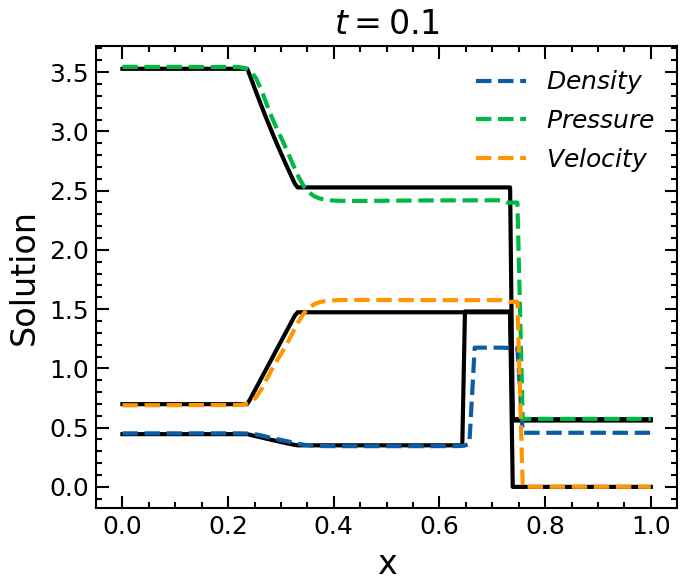

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: tensor([[1., 0.],
        [0., 1.]], device='cuda:0', dtype=torch.float64) and tensor([[0.3333, 0.3333, 0.3333]], device='cuda:0', dtype=torch.float64),tensor([[0.3333, 0.3333, 0.3333]], device='cuda:0', dtype=torch.float64),tensor([[0.3333, 0.3333, 0.3333]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: Loss: 26744.708378
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: Epoch: 0 | Loss: 26744.708377713298
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 500 | Loss: 15.375538
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 1000 | Loss: 13.588903
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 1500 | Loss: 12.361604
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 2000 | Loss: 11.517663
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 9.9988e-01, -1.4731e-04],
        [ 1.2447e-04,  1.0002e+00]], device='cuda:0', dtype=torch.float64) and tensor([[0.3333, 0.3333, 0.3333]], device='cuda:0', dtype=torch.float64),tensor([[0.3333, 

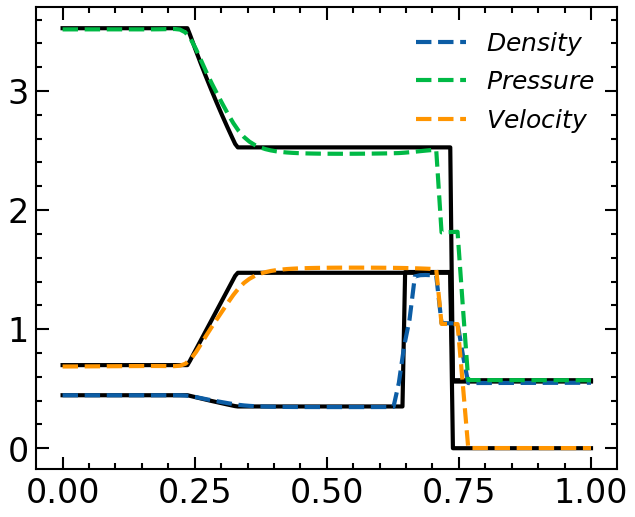

Step 2 Training Begin...
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-2.9364,  0.1862],
        [-1.3994,  8.5302]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9961e-01, -1.6795e-04],
        [ 6.6235e-04,  1.0002e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[0.4482, 0.0016, 0.5379]], device='cuda:0', dtype=torch.float64),tensor([[0.3995, 0.0785, 0.5135]], device='cuda:0', dtype=torch.float64),tensor([[0.3852, 0.1168, 0.5155]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 3000 | Loss: 0.246264


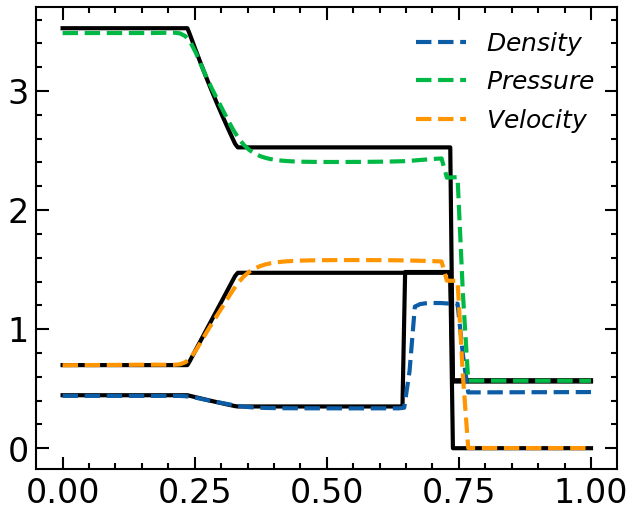

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 2.3901, -8.0165],
        [-1.7326,  6.1513]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9917e-01, -3.2426e-04],
        [ 1.5383e-03,  9.9996e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.4254, -0.0039,  0.5659]], device='cuda:0', dtype=torch.float64),tensor([[0.3773, 0.0309, 0.5872]], device='cuda:0', dtype=torch.float64),tensor([[0.3656, 0.0291, 0.6119]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 4000 | Loss: 0.059427


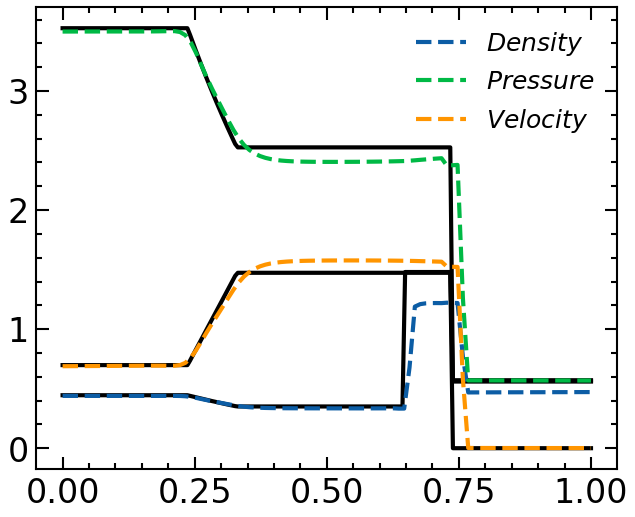

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ -13.5135, -101.7048],
        [   4.5742,   38.7762]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9918e-01, -6.2898e-04],
        [ 2.6060e-03,  9.9922e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.4002, -0.0031,  0.6016]], device='cuda:0', dtype=torch.float64),tensor([[0.3181, 0.0193, 0.6613]], device='cuda:0', dtype=torch.float64),tensor([[0.3054, 0.0257, 0.6765]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 5000 | Loss: 0.043850


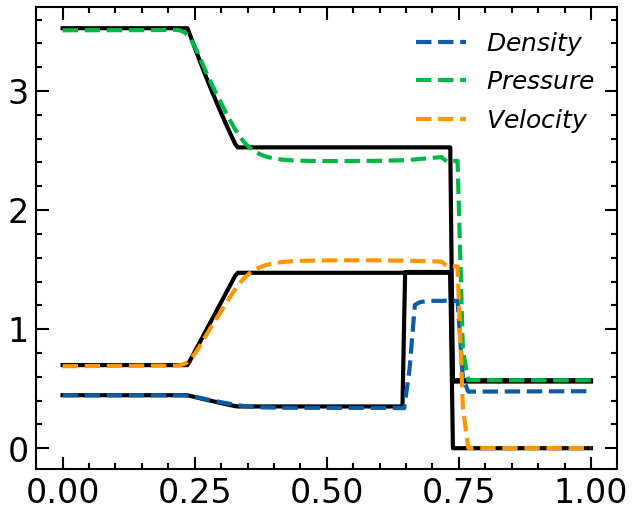

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.5853,  5.9993],
        [-0.6544, -8.7602]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9964e-01, -6.9336e-04],
        [ 3.7262e-03,  9.9898e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.3072, -0.0040,  0.6944]], device='cuda:0', dtype=torch.float64),tensor([[0.2413, 0.0190, 0.7402]], device='cuda:0', dtype=torch.float64),tensor([[0.2289, 0.0275, 0.7510]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 6000 | Loss: 0.050233


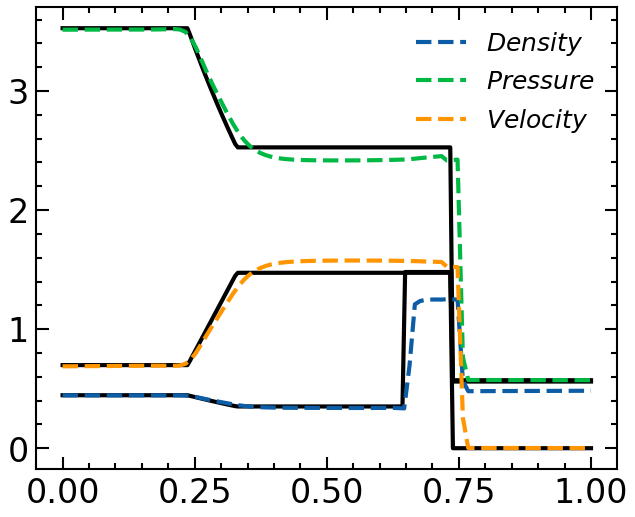

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[  4.4983,  36.3184],
        [ -2.0339, -11.4496]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9990e-01, -7.1689e-04],
        [ 4.8056e-03,  9.9888e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.2059, -0.0029,  0.7934]], device='cuda:0', dtype=torch.float64),tensor([[0.1601, 0.0145, 0.8271]], device='cuda:0', dtype=torch.float64),tensor([[0.1508, 0.0211, 0.8353]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 7000 | Loss: 0.044214


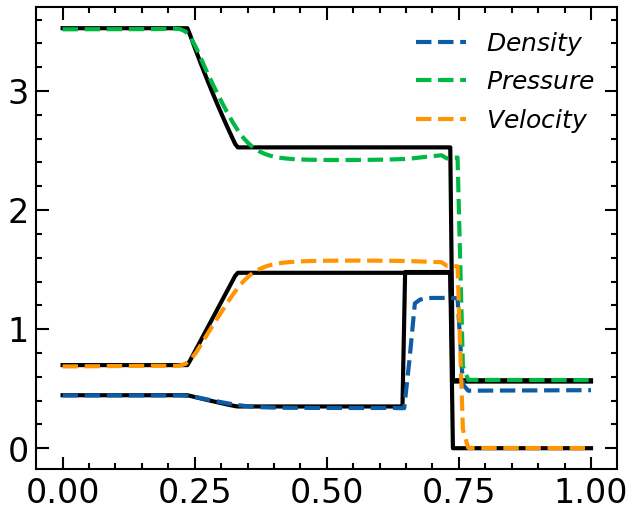

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 9.9967e-01, -8.1097e-04],
        [ 5.8092e-03,  9.9892e-01]], device='cuda:0', dtype=torch.float64) and tensor([[ 0.1294, -0.0016,  0.8680]], device='cuda:0', dtype=torch.float64),tensor([[0.1092, 0.0118, 0.8811]], device='cuda:0', dtype=torch.float64),tensor([[0.1019, 0.0147, 0.8899]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 7664 | Loss: 0.009610 (TGPT_PINN2 Step Criteria Met)



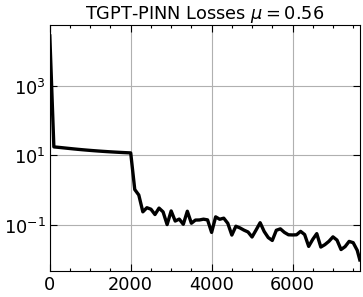

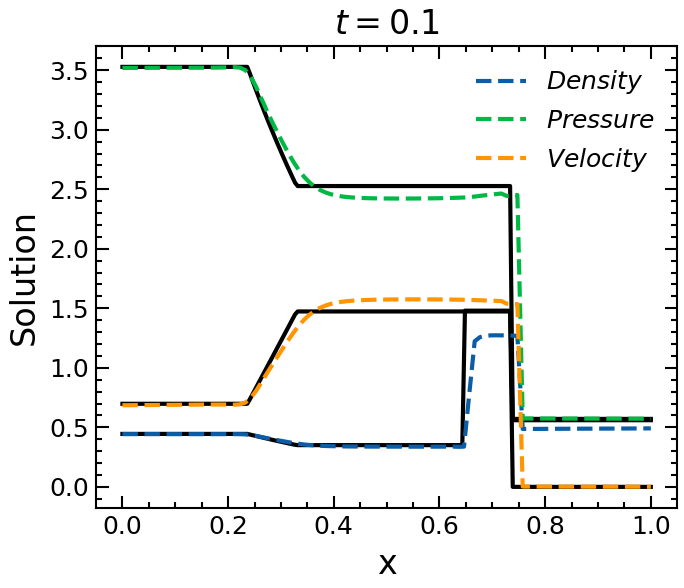

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: tensor([[1., 0.],
        [0., 1.]], device='cuda:0', dtype=torch.float64) and tensor([[0.2500, 0.2500, 0.2500, 0.2500]], device='cuda:0',
       dtype=torch.float64),tensor([[0.2500, 0.2500, 0.2500, 0.2500]], device='cuda:0',
       dtype=torch.float64),tensor([[0.2500, 0.2500, 0.2500, 0.2500]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: Loss: 20395.391395
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: Epoch: 0 | Loss: 20395.391394764632
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 500 | Loss: 1443.672421
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 1000 | Loss: 1441.528497
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 1500 | Loss: 1439.497241
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 2000 | Loss: 1437.695497
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 9.9989e-01, -1.4149e-04],
        [ 1.1085e-04,  1.0001e+00]], device='cuda:0', dtype=torch.float64) and tensor([[0.2500, 0.2500, 0.2500, 0.25

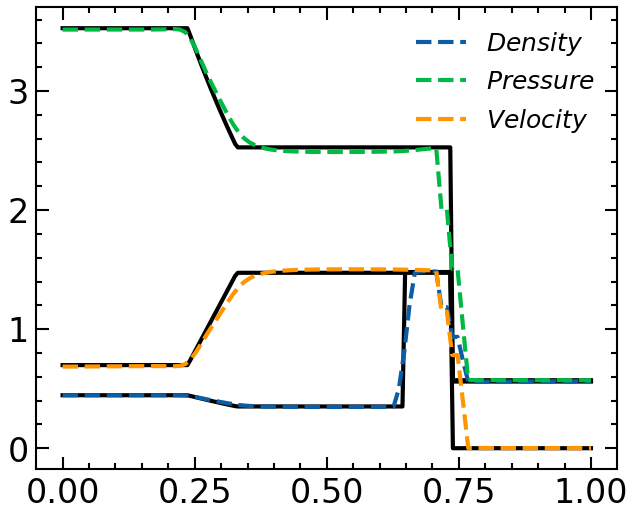

Step 2 Training Begin...
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ -0.7141, -30.6409],
        [  0.3099,  -3.2708]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9988e-01, -6.7042e-04],
        [ 4.6059e-03,  1.0010e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[0.0320, 0.0230, 0.7010, 0.1889]], device='cuda:0',
       dtype=torch.float64),tensor([[0.2349, 0.1649, 0.3233, 0.2535]], device='cuda:0',
       dtype=torch.float64),tensor([[0.2186, 0.1863, 0.3443, 0.2610]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 3000 | Loss: 0.595495


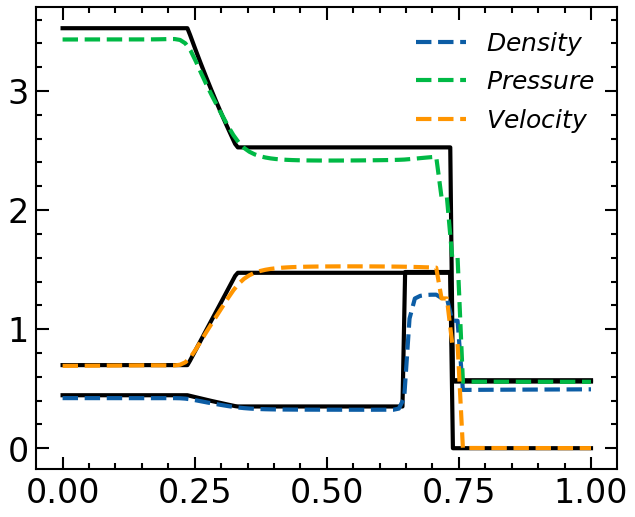

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ -65.8935, -856.3268],
        [  25.5457,  326.8533]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0058e+00, -6.9354e-04],
        [ 1.1849e-02,  1.0006e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[0.0764, 0.0297, 0.6997, 0.1550]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1841, 0.1662, 0.4584, 0.1683]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1711, 0.1854, 0.4734, 0.1784]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 4000 | Loss: 0.242385


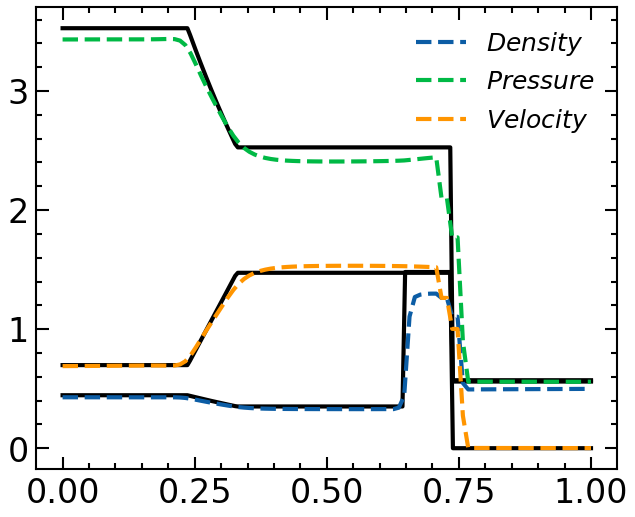

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[  1.5544,   6.8129],
        [ -1.3880, -16.3700]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0059e+00, -6.8668e-04],
        [ 1.1781e-02,  1.0006e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[0.0976, 0.0232, 0.7486, 0.1095]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1401, 0.1288, 0.6082, 0.1056]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1308, 0.1378, 0.6177, 0.1180]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 5000 | Loss: 0.560425


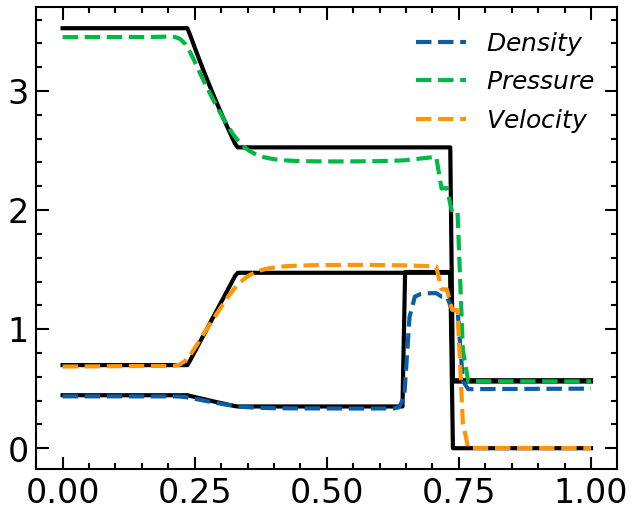

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ -5.5346, -57.5643],
        [  2.2933,  24.0181]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0060e+00, -6.7905e-04],
        [ 1.1791e-02,  1.0006e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[0.0925, 0.0135, 0.8714, 0.0121]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0841, 0.1099, 0.7871, 0.0099]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0780, 0.1179, 0.7951, 0.0147]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 6000 | Loss: 0.069914


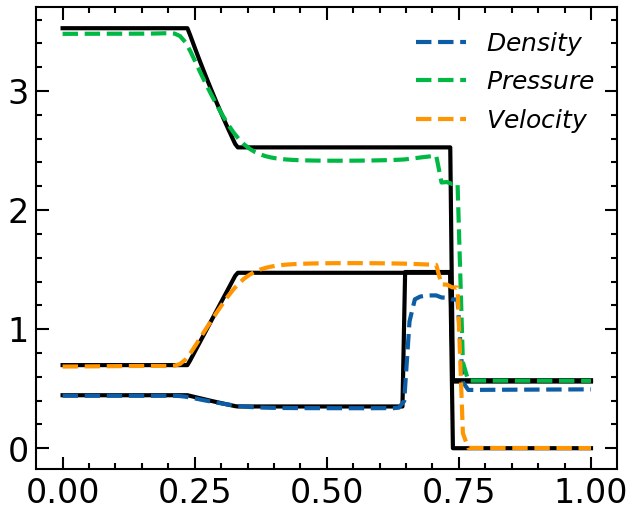

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 1.0060e+00, -6.7846e-04],
        [ 1.1766e-02,  1.0006e+00]], device='cuda:0', dtype=torch.float64) and tensor([[ 4.0715e-02, -9.8180e-04,  9.6636e-01,  2.2656e-04]], device='cuda:0',
       dtype=torch.float64),tensor([[ 3.8694e-02, -6.8956e-04,  9.6465e-01,  2.1307e-04]], device='cuda:0',
       dtype=torch.float64),tensor([[3.9028e-02, 5.0001e-05, 9.5966e-01, 1.8057e-04]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 6889 | Loss: 0.009648 (TGPT_PINN2 Step Criteria Met)



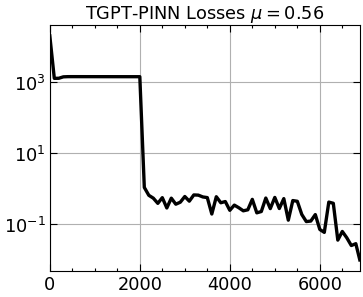

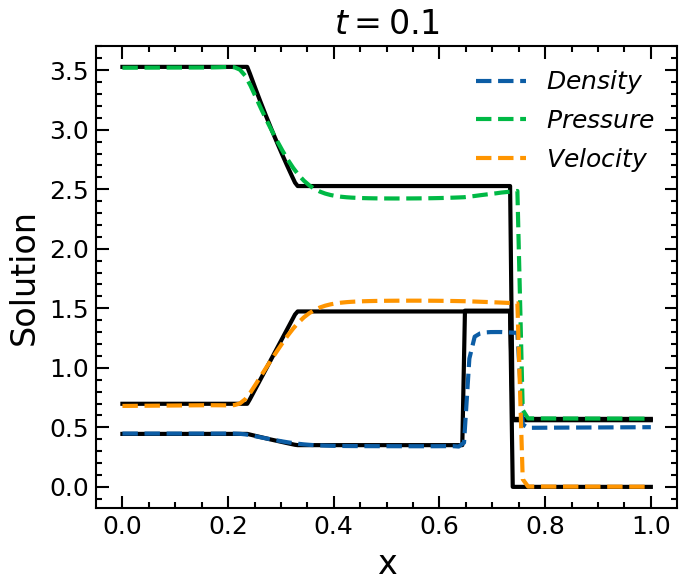

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: tensor([[1., 0.],
        [0., 1.]], device='cuda:0', dtype=torch.float64) and tensor([[0.2000, 0.2000, 0.2000, 0.2000, 0.2000]], device='cuda:0',
       dtype=torch.float64),tensor([[0.2000, 0.2000, 0.2000, 0.2000, 0.2000]], device='cuda:0',
       dtype=torch.float64),tensor([[0.2000, 0.2000, 0.2000, 0.2000, 0.2000]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: Loss: 34569.214243
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: Epoch: 0 | Loss: 34569.214242989336
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 500 | Loss: 52.986655
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 1000 | Loss: 74.415730
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 1500 | Loss: 73.835690
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 2000 | Loss: 73.374610
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 9.9987e-01, -1.6528e-04],
        [ 1.3656e-04,  1.0002e+00]], device='cuda:0', dtype=torch.float64) and tensor([[0.2000, 0.20

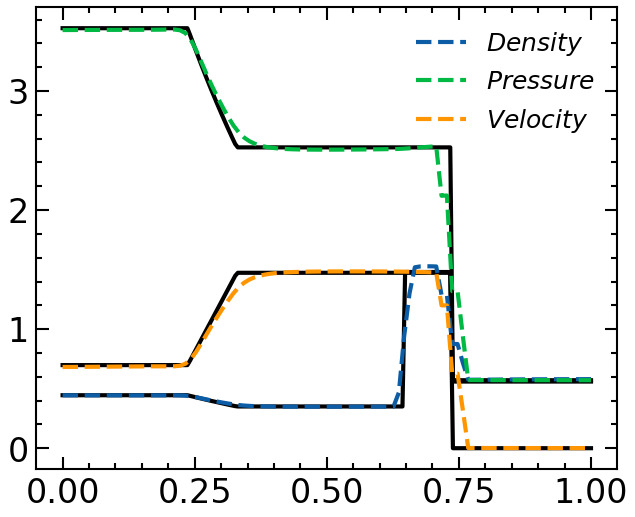

Step 2 Training Begin...
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.9255,  9.0355],
        [-0.3653, -3.9208]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9945e-01, -5.7268e-04],
        [ 1.2810e-03,  9.9993e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0201,  0.0186,  0.4035,  0.5351,  0.0322]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1486, 0.0418, 0.2143, 0.3260, 0.2587]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1527, 0.0355, 0.2367, 0.3121, 0.2619]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 3000 | Loss: 0.170955


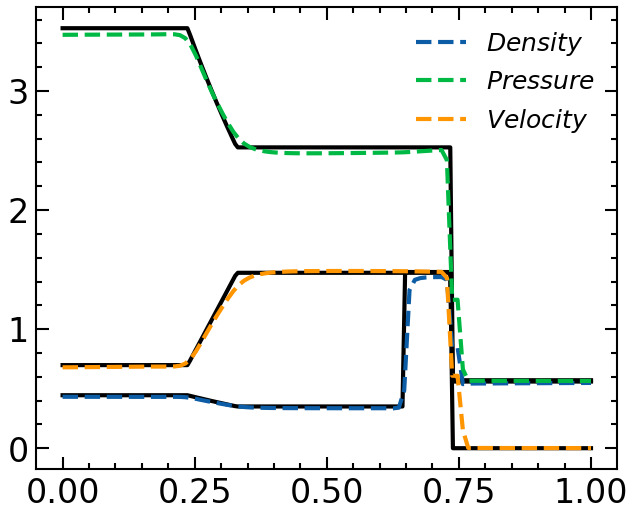

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.5647,  6.5951],
        [-0.4339, -2.3182]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0010e+00, -8.4970e-04],
        [ 2.7293e-03,  9.9951e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0150,  0.0140,  0.3241,  0.6129,  0.0355]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0878, 0.0130, 0.2067, 0.4087, 0.2755]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0958, 0.0042, 0.2248, 0.3967, 0.2771]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 4000 | Loss: 0.125951


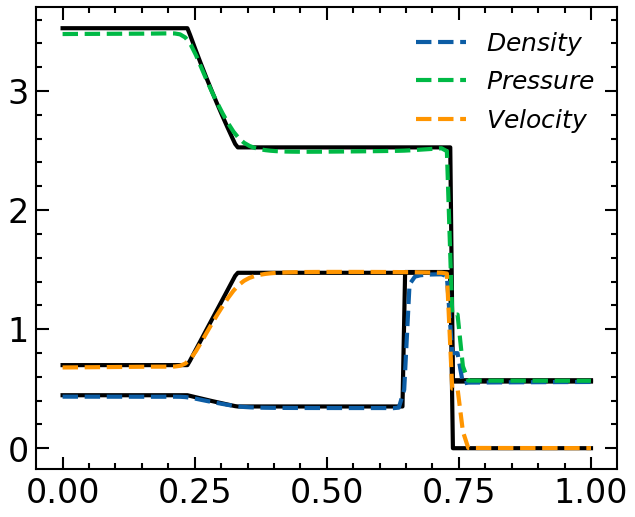

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.1681,  0.7032],
        [ 0.0260, -0.0246]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0041, -0.0016],
        [ 0.0066,  0.9997]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[0.0138, 0.0094, 0.2920, 0.6168, 0.0449]], device='cuda:0',
       dtype=torch.float64),tensor([[ 0.0685, -0.0030,  0.2155,  0.5167,  0.1937]], device='cuda:0',
       dtype=torch.float64),tensor([[ 0.0741, -0.0226,  0.2355,  0.5145,  0.1942]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 5000 | Loss: 0.127031


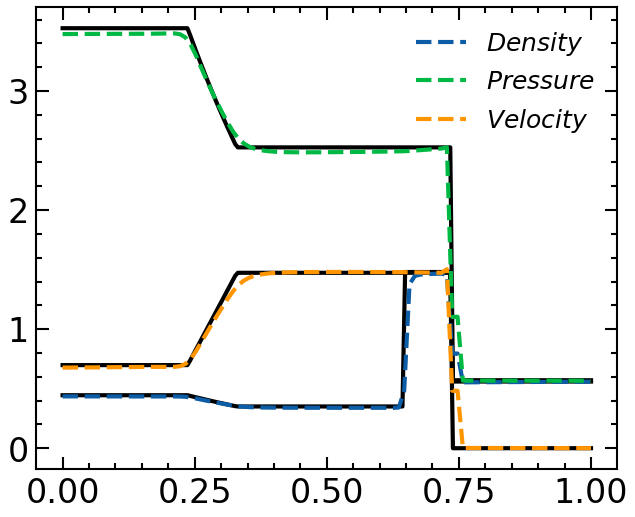

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0409,  1.4678],
        [-0.0662,  0.1826]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0041, -0.0016],
        [ 0.0066,  0.9997]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[0.0041, 0.0119, 0.2312, 0.6956, 0.0469]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0310, 0.0158, 0.1797, 0.6193, 0.1499]], device='cuda:0',
       dtype=torch.float64),tensor([[ 0.0431, -0.0019,  0.2008,  0.5984,  0.1541]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 6000 | Loss: 0.076665


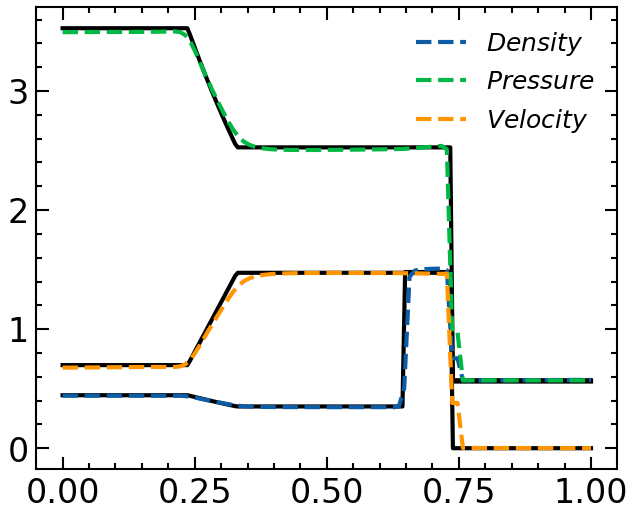

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0660,  0.7166],
        [-0.0298,  0.5054]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0042, -0.0016],
        [ 0.0067,  0.9997]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0012,  0.0085,  0.1540,  0.7829,  0.0455]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0086, 0.0059, 0.1292, 0.6968, 0.1569]], device='cuda:0',
       dtype=torch.float64),tensor([[ 0.0202, -0.0050,  0.1443,  0.6784,  0.1595]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 7000 | Loss: 0.040529


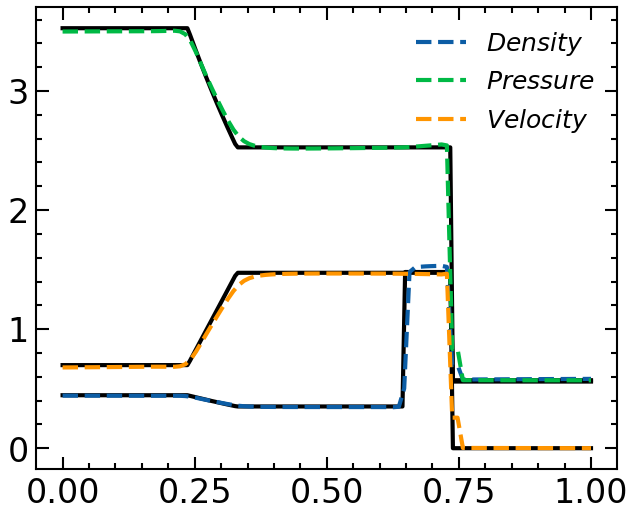

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0251, -1.1130],
        [-0.0523, -0.7046]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0042, -0.0017],
        [ 0.0067,  0.9996]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0032,  0.0039,  0.0975,  0.8311,  0.0596]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0056, 0.0051, 0.0778, 0.7748, 0.1356]], device='cuda:0',
       dtype=torch.float64),tensor([[ 0.0135, -0.0023,  0.0889,  0.7611,  0.1378]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 8000 | Loss: 0.048940


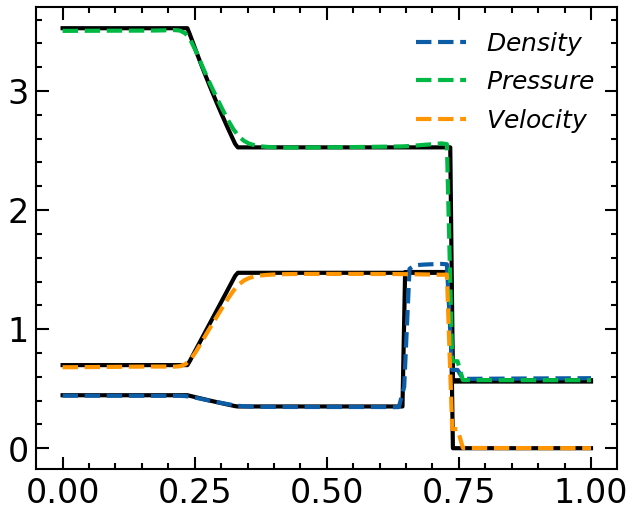

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 1.0043, -0.0016],
        [ 0.0068,  0.9997]], device='cuda:0', dtype=torch.float64) and tensor([[-0.0045,  0.0026,  0.0802,  0.8638,  0.0474]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0106, 0.0256, 0.0491, 0.7938, 0.1189]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0133, 0.0226, 0.0548, 0.7902, 0.1206]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 8511 | Loss: 0.009651 (TGPT_PINN2 Step Criteria Met)



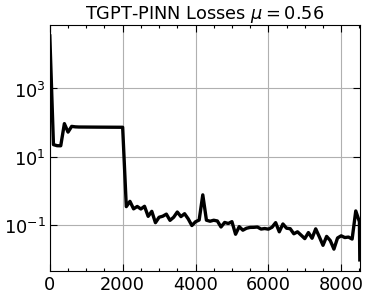

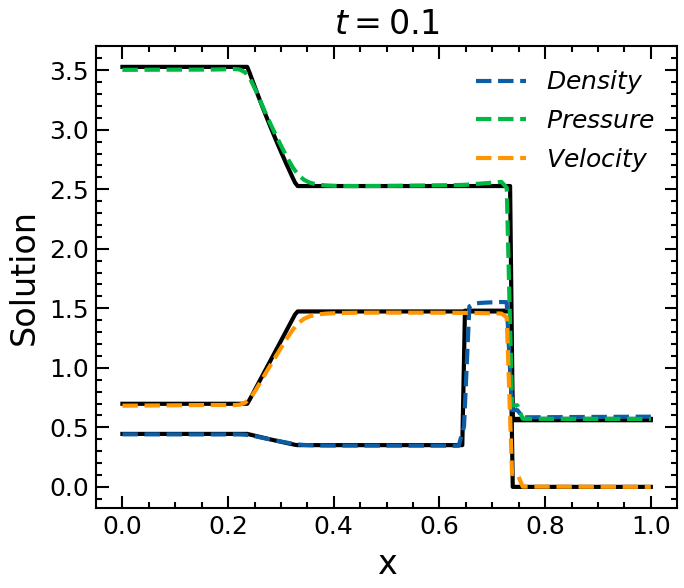

In [5]:
ini[3] = 0.56
weno_u = exact_solver([ini[0],ini[2],ini[1]],[ini[3],ini[5],ini[4]],gamma,Tf,N=200)
for i in range(0,number_of_neurons):
    layers_gpt = np.array([2, i+1, 3])
    c_initial  = torch.full((1,i+1), 1/(i+1))
    IC_data = create_IC_data(ini,Xi, Xf, Ti, Tf, IC_pts)
    IC_xt     = IC_data[0].to(device)
    IC_u      = IC_data[1]

    BC_data = create_BC_data(ini,Xi, Xf, Ti, Tf, IC_pts)
    BC_xt     = BC_data[0].to(device)
    BC_u      = BC_data[1]

    xt_en = Move_Time_1D(IC_xt, Tf).to(device)
    #weno_u = Euler_WENO(Xi,Xf,Ti,Tf,ini,gamma,delta_t=0.0001,delta_x=0.005)
    #weno_u = exact_solver([ini[0],ini[2],ini[1]],[ini[3],ini[5],ini[4]],gamma,Tf,N=200)
    TGPT_PINN = GPT(ini, layers_gpt, P_list[0:i+1], c_initial, Nc, Tc, gamma,Tf).to(device).double()
    
    tgpt_losses = gpt_train(TGPT_PINN, ini, xt_resid,  IC_xt, IC_u,BC_xt, BC_u, f_hat,xt_test,xt_en, xt_RH, xt_RHL,weno_u,  epochs_tgpt, lr_tgpt, tol_tgpt)

    loss_plot(tgpt_losses[1], tgpt_losses[2], dpi=80, figsize=(5,4),title=fr"TGPT-PINN Losses $\mu={round(ini[3],3)}$")
    
    Nx_test=N_test
    Nt_test=T_test
    plt.figure(dpi=150, figsize=(5,4))
    
    ind = 100
    plt.plot(weno_u[3],weno_u[0],'k')#,label="$Density$"
    plt.plot(weno_u[3],weno_u[1],'k')#,label="$Pressure$"
    plt.plot(weno_u[3],weno_u[2],'k')#,label="$velocity$"
    
    #plt.plot(xt_test[0::Nt_test,1].detach().cpu(),P_list[0](xt_test)[:,0:1][ind-1::Nx_test].detach().cpu(),'k',label=fr"$Density$")
    #plt.plot(xt_test[0::Nt_test,1].detach().cpu(),P_list[0](xt_test)[:,1:2][ind-1::Nx_test].detach().cpu(),'k',label=fr"$Pressure$")
    #plt.plot(xt_test[0::Nt_test,1].detach().cpu(),P_list[0](xt_test)[:,2:][ind-1::Nx_test].detach().cpu(),'k',label=fr"$Velocity$")
    
    plt.plot(xt_test[0::Nt_test,1].detach().cpu(),TGPT_PINN(xt_test)[0][ind-1::Nx_test].detach().cpu(),'--',label=fr"$Density$")
    plt.plot(xt_test[0::Nt_test,1].detach().cpu(),TGPT_PINN(xt_test)[1][ind-1::Nx_test].detach().cpu(),'--',label=fr"$Pressure$")
    plt.plot(xt_test[0::Nt_test,1].detach().cpu(),TGPT_PINN(xt_test)[2][ind-1::Nx_test].detach().cpu(),'--',label=fr"$Velocity$")
    plt.xlabel("x",     fontsize=16)
    plt.ylabel("Solution", fontsize=16)
    plt.title(fr"$t={round((ind-1)*(Tf-Ti)/(Nt_test-1),3)}$")
    plt.tick_params(axis='both', which='major', labelsize=12)
    plt.tick_params(axis='both', which='minor', labelsize=12)
    
    plt.legend(fontsize = 12)#
    plt.show()

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: tensor([[1., 0.],
        [0., 1.]], device='cuda:0', dtype=torch.float64) and tensor([[0.2000, 0.2000, 0.2000, 0.2000, 0.2000]], device='cuda:0',
       dtype=torch.float64),tensor([[0.2000, 0.2000, 0.2000, 0.2000, 0.2000]], device='cuda:0',
       dtype=torch.float64),tensor([[0.2000, 0.2000, 0.2000, 0.2000, 0.2000]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: Loss: 34569.214243
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: Epoch: 0 | Loss: 34569.214242989336
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 500 | Loss: 52.986655
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 1000 | Loss: 74.415730
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 1500 | Loss: 73.835690
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 2000 | Loss: 73.374610
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 9.9987e-01, -1.6528e-04],
        [ 1.3656e-04,  1.0002e+00]], device='cuda:0', dtype=torch.float64) and tensor([[0.2000, 0.20

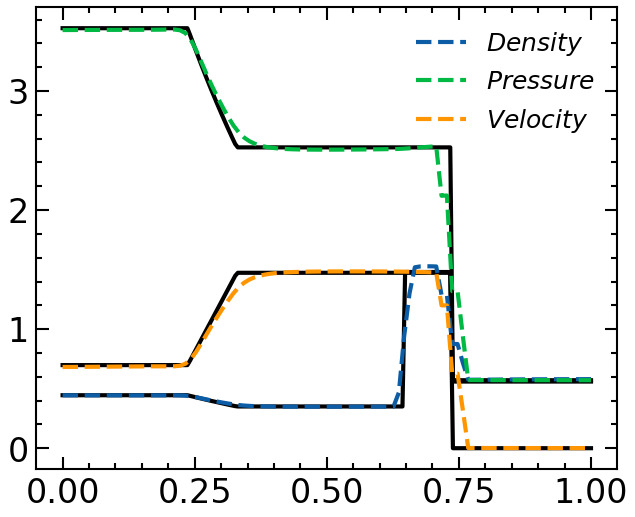

Step 2 Training Begin...
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-1.6035, -8.5313],
        [ 0.8255,  6.3271]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9948e-01, -5.5642e-04],
        [ 1.3164e-03,  9.9994e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0220,  0.0190,  0.4003,  0.5362,  0.0329]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1485, 0.0419, 0.2127, 0.3280, 0.2582]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1516, 0.0345, 0.2367, 0.3139, 0.2613]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 3000 | Loss: 0.236629


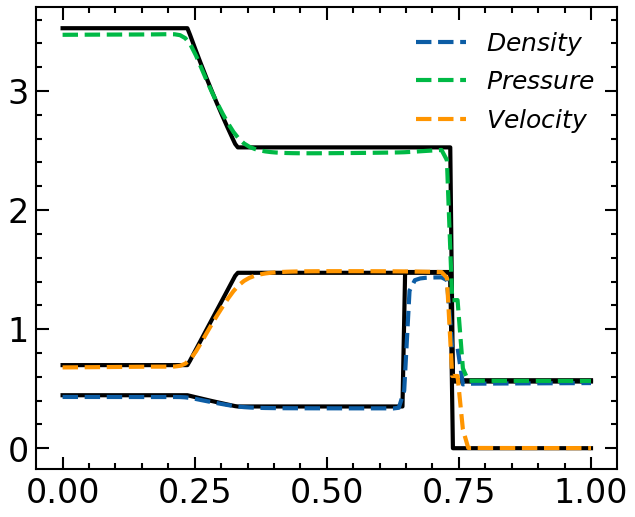

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.0624,  8.4015],
        [-0.2677, -0.6521]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9990e-01, -9.0817e-04],
        [ 2.2431e-03,  9.9966e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0174,  0.0147,  0.3462,  0.5879,  0.0434]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0855, 0.0170, 0.2217, 0.4273, 0.2397]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0972, 0.0121, 0.2370, 0.4143, 0.2374]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 4000 | Loss: 0.266552


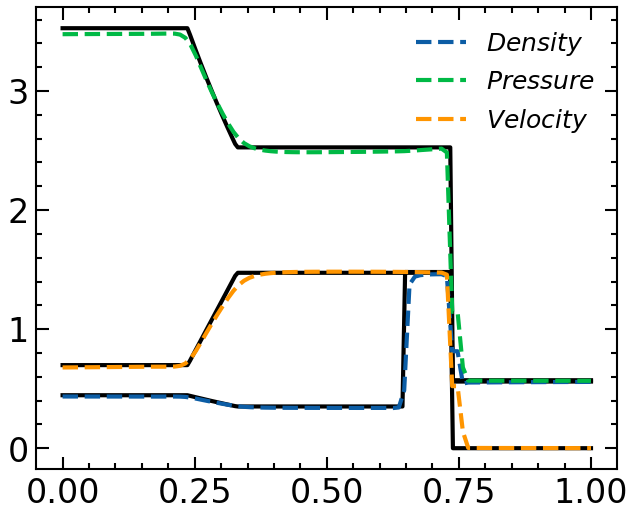

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.2589,  2.5719],
        [-0.2545, -2.5337]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0068, -0.0016],
        [ 0.0110,  0.9987]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0153,  0.0309,  0.2366,  0.6631,  0.0576]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0347, 0.0247, 0.1761, 0.5007, 0.2574]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0484, 0.0262, 0.1864, 0.4842, 0.2556]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 5000 | Loss: 0.128121


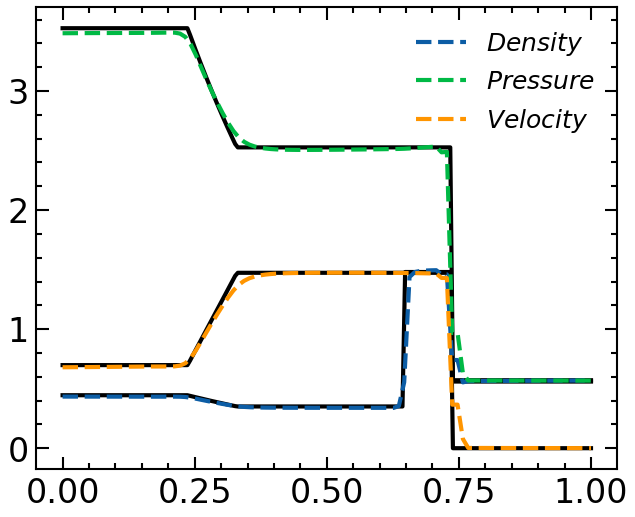

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.1735,  7.0568],
        [-0.1113,  1.1900]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0107, -0.0013],
        [ 0.0139,  0.9979]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[0.0212, 0.0172, 0.0253, 0.7935, 0.1157]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0566, 0.0037, 0.0109, 0.6196, 0.3038]], device='cuda:0',
       dtype=torch.float64),tensor([[7.0338e-02, 5.2441e-04, 2.6317e-02, 5.9937e-01, 3.0607e-01]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 6000 | Loss: 0.073989


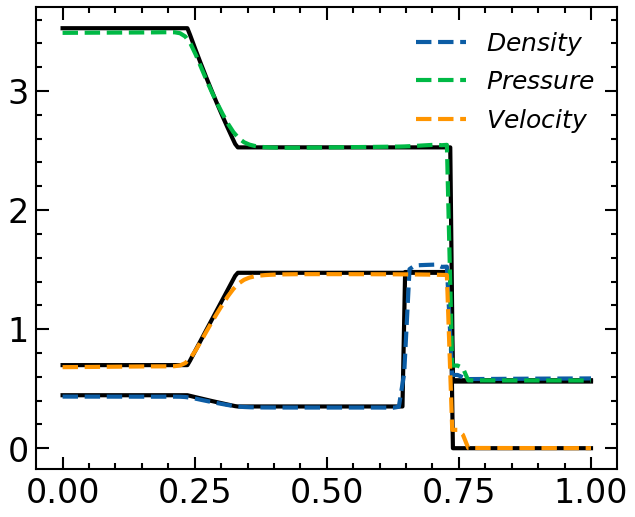

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.0134, -0.2257],
        [-0.0193,  0.1055]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0107, -0.0013],
        [ 0.0141,  0.9979]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[0.0095, 0.0044, 0.0012, 0.8063, 0.1642]], device='cuda:0',
       dtype=torch.float64),tensor([[ 0.0151, -0.0016,  0.0018,  0.6667,  0.3157]], device='cuda:0',
       dtype=torch.float64),tensor([[ 1.5269e-02, -1.0626e-04,  3.5801e-03,  6.6785e-01,  3.1768e-01]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 7000 | Loss: 0.028083


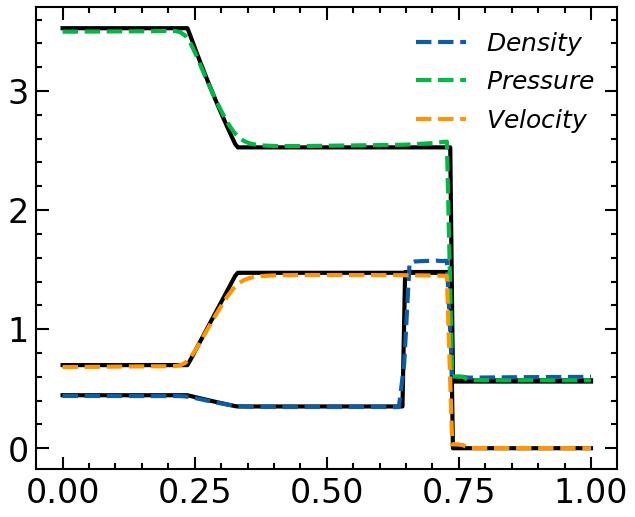

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0684, -0.2162],
        [ 0.0138,  0.4515]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0108, -0.0013],
        [ 0.0144,  0.9981]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[5.3517e-03, 7.0239e-03, 8.7954e-05, 7.8639e-01, 1.9089e-01]],
       device='cuda:0', dtype=torch.float64),tensor([[0.0078, 0.0017, 0.0017, 0.6864, 0.2998]], device='cuda:0',
       dtype=torch.float64),tensor([[1.0294e-02, 4.0103e-04, 2.9514e-03, 6.8547e-01, 3.0469e-01]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 8000 | Loss: 0.037876


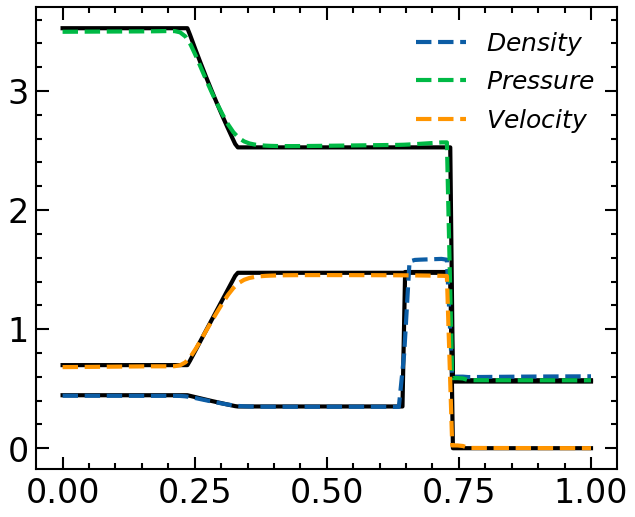

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 1.0108, -0.0013],
        [ 0.0144,  0.9981]], device='cuda:0', dtype=torch.float64) and tensor([[0.0045, 0.0060, 0.0010, 0.7883, 0.1891]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0078, 0.0012, 0.0011, 0.6887, 0.3010]], device='cuda:0',
       dtype=torch.float64),tensor([[8.7658e-03, 4.2440e-04, 2.4895e-03, 6.8675e-01, 3.0477e-01]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 8084 | Loss: 0.009169 (TGPT_PINN2 Step Criteria Met)



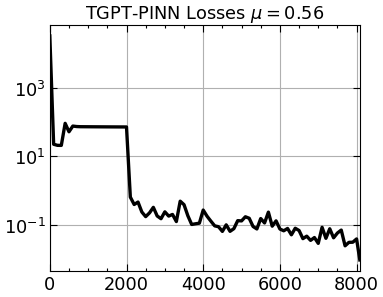

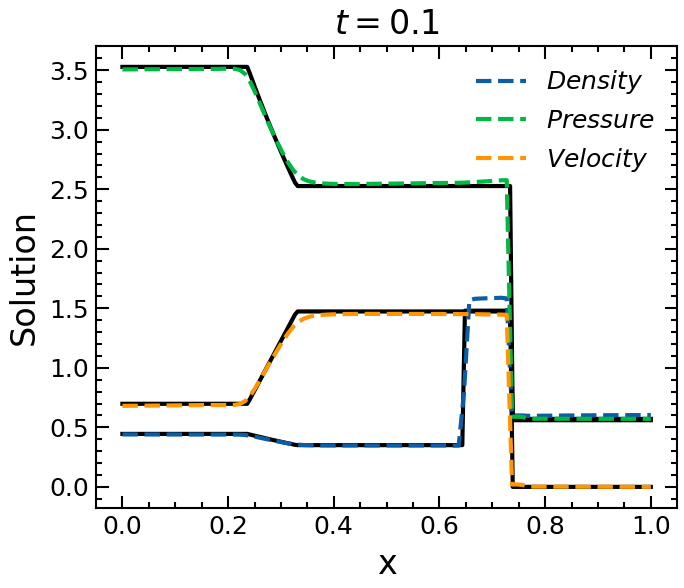

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: tensor([[1., 0.],
        [0., 1.]], device='cuda:0', dtype=torch.float64) and tensor([[0.1667, 0.1667, 0.1667, 0.1667, 0.1667, 0.1667]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1667, 0.1667, 0.1667, 0.1667, 0.1667, 0.1667]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1667, 0.1667, 0.1667, 0.1667, 0.1667, 0.1667]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: Loss: 29317.573221
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: Epoch: 0 | Loss: 29317.573220664883
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 500 | Loss: 823.282911
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 1000 | Loss: 718.187936
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 1500 | Loss: 716.533014
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 2000 | Loss: 40.601983
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 9.9983e-01, -2.0938e-04],
        [ 1.7514e-04,  1.0002e+00]], device='cuda:0', dtype=torch.float64

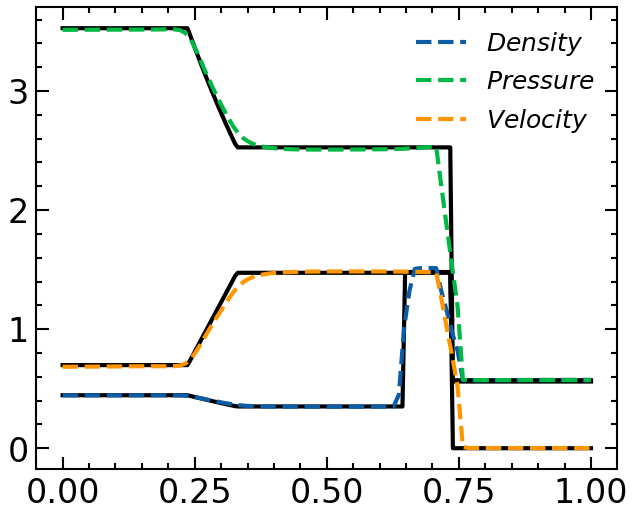

Step 2 Training Begin...
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.3611,  9.8783],
        [-0.3109, -1.3533]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9733e-01,  3.9989e-04],
        [-2.3822e-03,  1.0007e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0105,  0.0127,  0.1921,  0.1226,  0.0805,  0.6050]],
       device='cuda:0', dtype=torch.float64),tensor([[0.1881, 0.0117, 0.1623, 0.0982, 0.2328, 0.2856]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1855, 0.0081, 0.1714, 0.0904, 0.2576, 0.2788]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 3000 | Loss: 0.200233


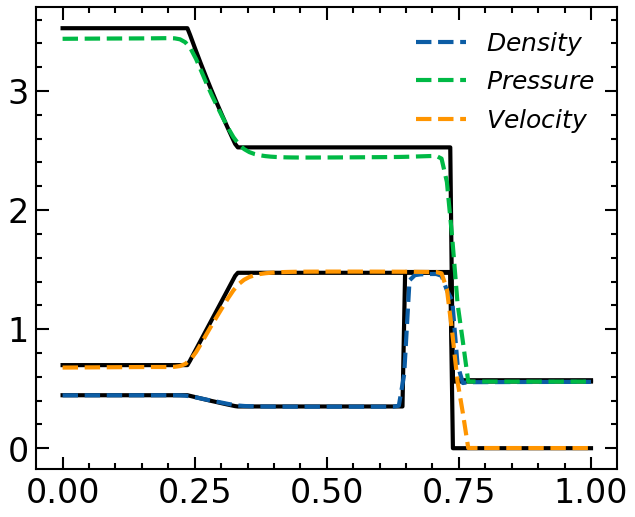

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.2197, -6.0548],
        [ 0.0986, -0.1220]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9486e-01,  4.3547e-04],
        [-4.0318e-03,  1.0008e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[0.0025, 0.0143, 0.2112, 0.0598, 0.1171, 0.5857]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1611, 0.0074, 0.1698, 0.0507, 0.2544, 0.3429]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1675, 0.0005, 0.1722, 0.0466, 0.2714, 0.3344]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 4000 | Loss: 0.542580


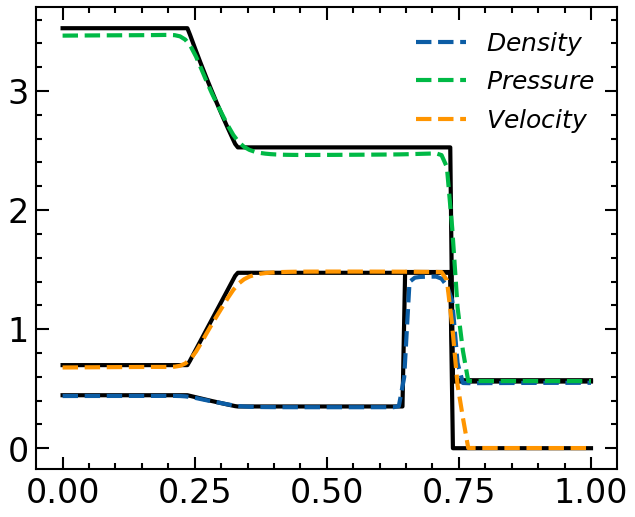

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0051,  0.5604],
        [-0.0069,  0.5600]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9584e-01,  3.2491e-04],
        [-3.5992e-03,  1.0006e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[0.0027, 0.0036, 0.1988, 0.1086, 0.1278, 0.5513]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1196, 0.0028, 0.1644, 0.0523, 0.2554, 0.3963]], device='cuda:0',
       dtype=torch.float64),tensor([[1.3161e-01, 1.1553e-04, 1.6167e-01, 4.8629e-02, 2.6542e-01, 3.8580e-01]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 5000 | Loss: 0.108627


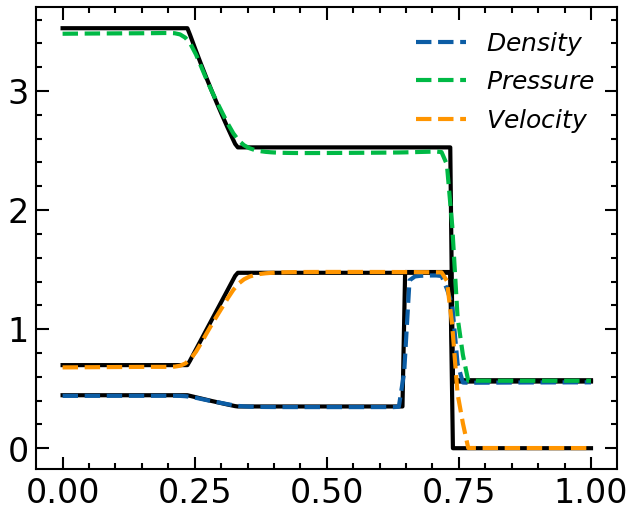

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0308,  4.7328],
        [-0.0527,  2.0280]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9587e-01,  3.1777e-04],
        [-3.5555e-03,  1.0005e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[4.6982e-04, 5.9289e-03, 1.6553e-01, 1.0679e-01, 1.7559e-01, 5.3993e-01]],
       device='cuda:0', dtype=torch.float64),tensor([[0.0920, 0.0063, 0.1435, 0.0578, 0.2545, 0.4386]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1019, 0.0061, 0.1408, 0.0521, 0.2637, 0.4304]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 6000 | Loss: 0.087627


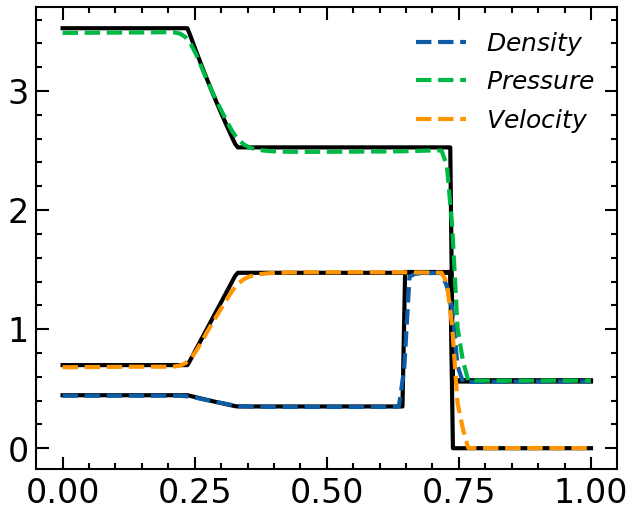

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.5552, -3.1687],
        [-0.0966,  0.1550]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9606e-01,  2.4016e-04],
        [-3.4283e-03,  1.0004e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0021, -0.0047,  0.0986,  0.1656,  0.2143,  0.5348]],
       device='cuda:0', dtype=torch.float64),tensor([[0.0624, 0.0378, 0.1105, 0.0399, 0.2575, 0.4848]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0749, 0.0425, 0.1086, 0.0286, 0.2685, 0.4706]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 7000 | Loss: 0.067387


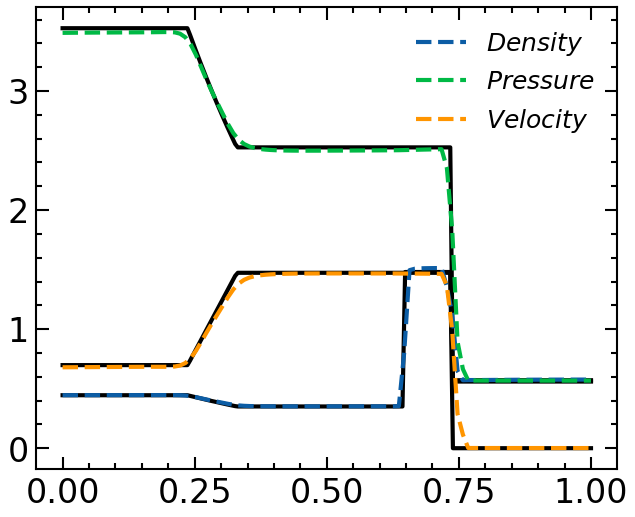

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.0475, -0.6922],
        [ 0.0186, -0.1511]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9664e-01,  2.3831e-04],
        [-2.7865e-03,  1.0004e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[4.3709e-04, 1.3902e-03, 6.9521e-02, 9.7272e-02, 2.5860e-01, 5.7914e-01]],
       device='cuda:0', dtype=torch.float64),tensor([[0.0512, 0.0422, 0.0820, 0.0093, 0.2811, 0.5322]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0562, 0.0444, 0.0813, 0.0041, 0.2912, 0.5153]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 8000 | Loss: 0.025513


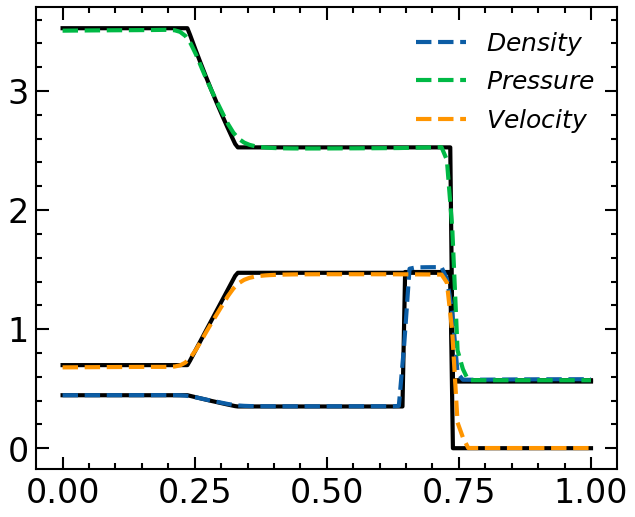

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[0.0531, 1.1115],
        [0.0235, 0.7114]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9744e-01,  1.0460e-05],
        [-1.9931e-03,  9.9989e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[0.0006, 0.0010, 0.0528, 0.0952, 0.2624, 0.5968]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0482, 0.0318, 0.0587, 0.0078, 0.2951, 0.5557]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0506, 0.0332, 0.0574, 0.0075, 0.3023, 0.5431]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 9000 | Loss: 0.027381


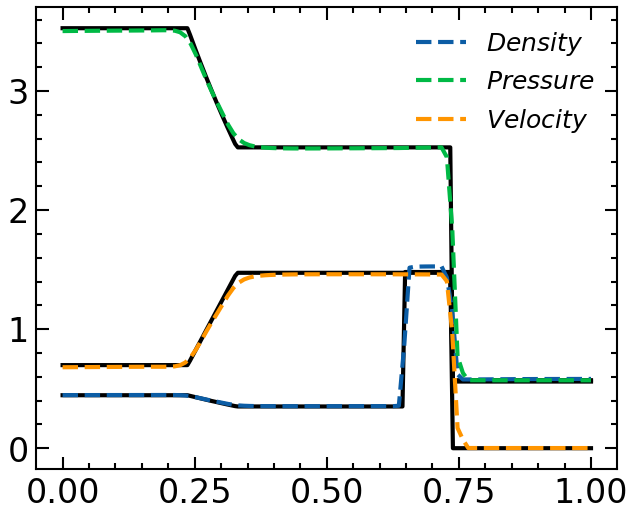

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 9.9562e-01,  8.2157e-05],
        [-3.2071e-03,  9.9964e-01]], device='cuda:0', dtype=torch.float64) and tensor([[2.3164e-04, 3.5859e-04, 4.4395e-02, 1.0054e-01, 2.5914e-01, 6.0625e-01]],
       device='cuda:0', dtype=torch.float64),tensor([[0.0464, 0.0242, 0.0462, 0.0018, 0.3059, 0.5736]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0441, 0.0250, 0.0452, 0.0085, 0.3088, 0.5618]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 9914 | Loss: 0.009765 (TGPT_PINN2 Step Criteria Met)



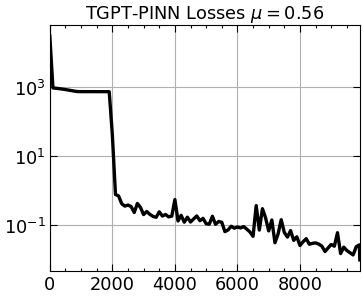

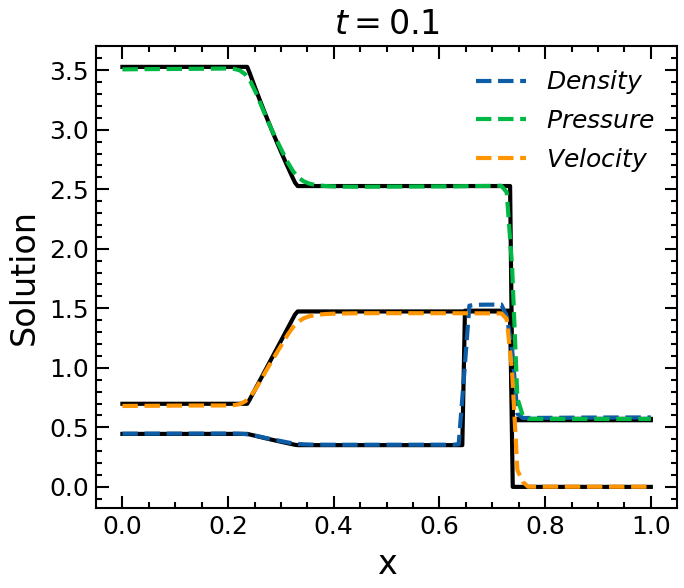

In [7]:
ini[3] = 0.56
weno_u = exact_solver([ini[0],ini[2],ini[1]],[ini[3],ini[5],ini[4]],gamma,Tf,N=200)
for i in range(4,number_of_neurons):
    layers_gpt = np.array([2, i+1, 3])
    c_initial  = torch.full((1,i+1), 1/(i+1))
    IC_data = create_IC_data(ini,Xi, Xf, Ti, Tf, IC_pts)
    IC_xt     = IC_data[0].to(device)
    IC_u      = IC_data[1]

    BC_data = create_BC_data(ini,Xi, Xf, Ti, Tf, IC_pts)
    BC_xt     = BC_data[0].to(device)
    BC_u      = BC_data[1]

    xt_en = Move_Time_1D(IC_xt, Tf).to(device)
    #weno_u = Euler_WENO(Xi,Xf,Ti,Tf,ini,gamma,delta_t=0.0001,delta_x=0.005)
    #weno_u = exact_solver([ini[0],ini[2],ini[1]],[ini[3],ini[5],ini[4]],gamma,Tf,N=200)
    TGPT_PINN = GPT(ini, layers_gpt, P_list[0:i+1], c_initial, Nc, Tc, gamma,Tf).to(device).double()
    
    tgpt_losses = gpt_train(TGPT_PINN, ini, xt_resid,  IC_xt, IC_u,BC_xt, BC_u, f_hat,xt_test,xt_en, xt_RH, xt_RHL,weno_u,  epochs_tgpt, lr_tgpt, tol_tgpt)

    loss_plot(tgpt_losses[1], tgpt_losses[2], dpi=80, figsize=(5,4),title=fr"TGPT-PINN Losses $\mu={round(ini[3],3)}$")
    
    Nx_test=N_test
    Nt_test=T_test
    plt.figure(dpi=150, figsize=(5,4))
    
    ind = 100
    plt.plot(weno_u[3],weno_u[0],'k')#,label="$Density$"
    plt.plot(weno_u[3],weno_u[1],'k')#,label="$Pressure$"
    plt.plot(weno_u[3],weno_u[2],'k')#,label="$velocity$"
    
    #plt.plot(xt_test[0::Nt_test,1].detach().cpu(),P_list[0](xt_test)[:,0:1][ind-1::Nx_test].detach().cpu(),'k',label=fr"$Density$")
    #plt.plot(xt_test[0::Nt_test,1].detach().cpu(),P_list[0](xt_test)[:,1:2][ind-1::Nx_test].detach().cpu(),'k',label=fr"$Pressure$")
    #plt.plot(xt_test[0::Nt_test,1].detach().cpu(),P_list[0](xt_test)[:,2:][ind-1::Nx_test].detach().cpu(),'k',label=fr"$Velocity$")
    
    plt.plot(xt_test[0::Nt_test,1].detach().cpu(),TGPT_PINN(xt_test)[0][ind-1::Nx_test].detach().cpu(),'--',label=fr"$Density$")
    plt.plot(xt_test[0::Nt_test,1].detach().cpu(),TGPT_PINN(xt_test)[1][ind-1::Nx_test].detach().cpu(),'--',label=fr"$Pressure$")
    plt.plot(xt_test[0::Nt_test,1].detach().cpu(),TGPT_PINN(xt_test)[2][ind-1::Nx_test].detach().cpu(),'--',label=fr"$Velocity$")
    plt.xlabel("x",     fontsize=16)
    plt.ylabel("Solution", fontsize=16)
    plt.title(fr"$t={round((ind-1)*(Tf-Ti)/(Nt_test-1),3)}$")
    plt.tick_params(axis='both', which='major', labelsize=12)
    plt.tick_params(axis='both', which='minor', labelsize=12)
    
    plt.legend(fontsize = 12)#
    plt.show()

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: tensor([[1., 0.],
        [0., 1.]], device='cuda:0', dtype=torch.float64) and tensor([[0.1667, 0.1667, 0.1667, 0.1667, 0.1667, 0.1667]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1667, 0.1667, 0.1667, 0.1667, 0.1667, 0.1667]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1667, 0.1667, 0.1667, 0.1667, 0.1667, 0.1667]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: Loss: 29317.573221
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: Epoch: 0 | Loss: 29317.573220664883
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 500 | Loss: 823.282911
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 1000 | Loss: 718.187936
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 1500 | Loss: 716.533014
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 2000 | Loss: 40.601983
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 9.9983e-01, -2.0938e-04],
        [ 1.7514e-04,  1.0002e+00]], device='cuda:0', dtype=torch.float64

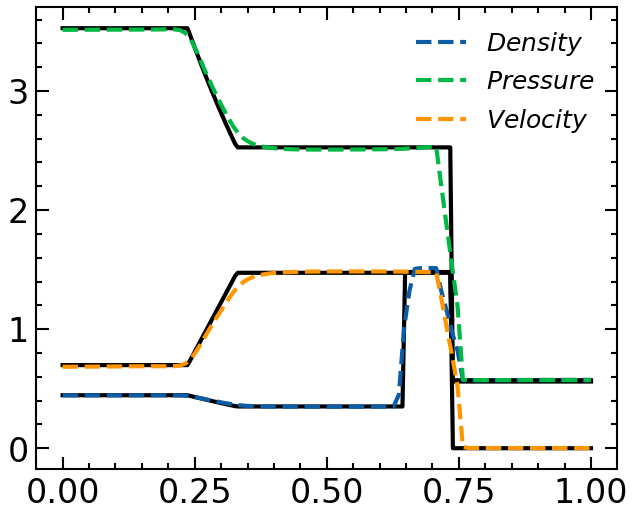

Step 2 Training Begin...
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 1.0108, 11.1798],
        [-0.6641, -5.1103]], device='cuda:0', dtype=torch.float64) and tensor([[1.0019e+00, 1.9840e-06],
        [9.1401e-04, 1.0008e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0355,  0.0266,  0.1947,  0.1216,  0.0628,  0.6093]],
       device='cuda:0', dtype=torch.float64),tensor([[0.2078, 0.1736, 0.1084, 0.1118, 0.1664, 0.2121]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1831, 0.1574, 0.1476, 0.0902, 0.1970, 0.2250]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 3000 | Loss: 0.214952


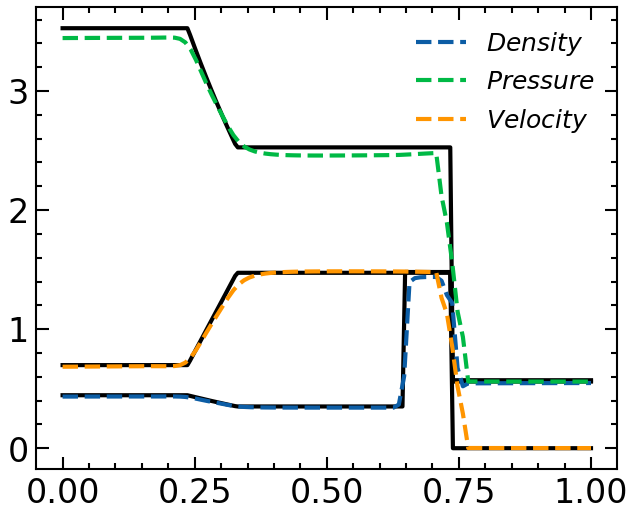

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.5064,  8.6973],
        [-1.3245,  4.9809]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0069, -0.0015],
        [ 0.0065,  0.9998]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0188,  0.0251,  0.2318,  0.0522,  0.0961,  0.5934]],
       device='cuda:0', dtype=torch.float64),tensor([[0.2003, 0.1688, 0.1169, 0.0485, 0.1802, 0.2685]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1984, 0.1624, 0.1370, 0.0372, 0.2043, 0.2620]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 4000 | Loss: 0.527629


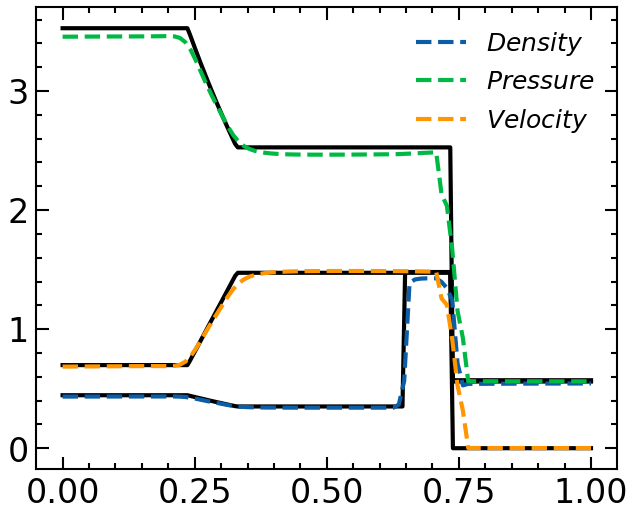

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 1.9545, 21.3936],
        [-0.7340, -3.9726]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0149, -0.0034],
        [ 0.0172,  0.9986]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0137,  0.0151,  0.2604,  0.0570,  0.0966,  0.5583]],
       device='cuda:0', dtype=torch.float64),tensor([[0.1828, 0.1632, 0.1166, 0.0333, 0.1821, 0.3080]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1933, 0.1573, 0.1323, 0.0251, 0.2020, 0.2916]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 5000 | Loss: 0.114517


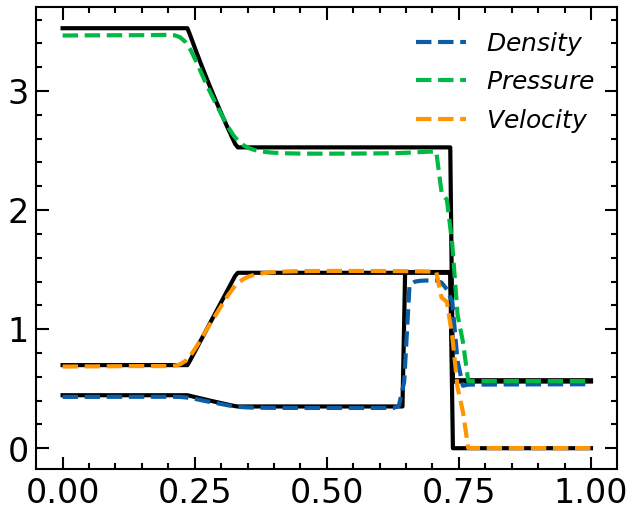

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[  7.2115, 100.2856],
        [ -2.7133, -30.3346]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0215, -0.0043],
        [ 0.0251,  0.9977]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[0.0050, 0.0092, 0.2667, 0.0502, 0.1091, 0.5195]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1733, 0.1554, 0.1098, 0.0293, 0.1668, 0.3478]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1823, 0.1448, 0.1349, 0.0207, 0.1882, 0.3326]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 6000 | Loss: 0.212525


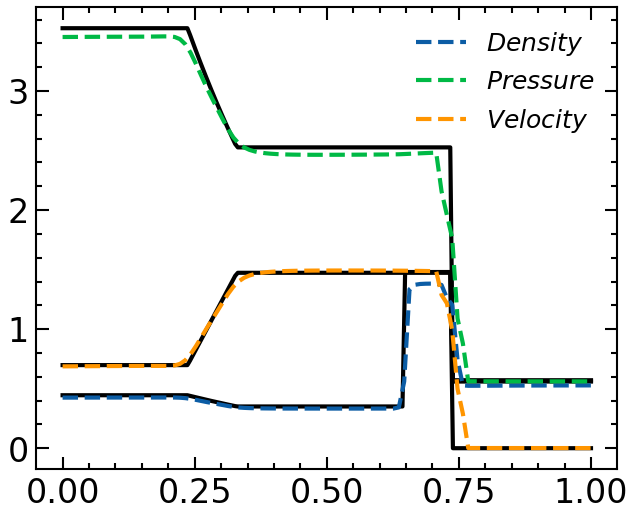

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.2772, -5.4049],
        [-0.1515, -2.9544]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0215, -0.0043],
        [ 0.0251,  0.9976]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0013,  0.0084,  0.2472,  0.0787,  0.0969,  0.5425]],
       device='cuda:0', dtype=torch.float64),tensor([[0.1484, 0.1579, 0.1064, 0.0346, 0.1091, 0.4303]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1610, 0.1482, 0.1283, 0.0221, 0.1274, 0.4151]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 7000 | Loss: 0.146703


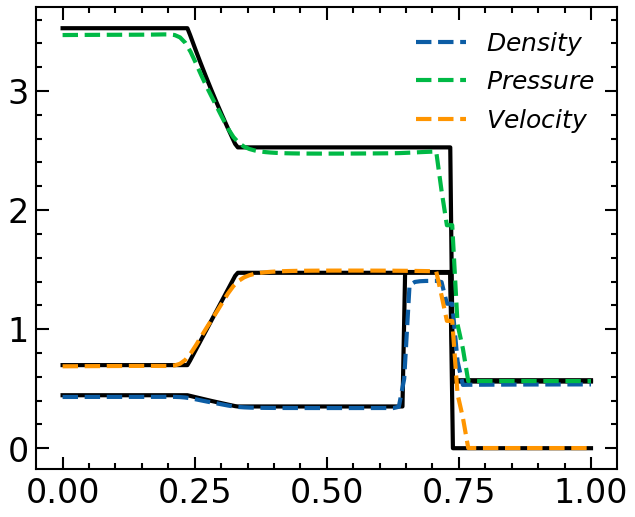

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ -1.0049, -18.8683],
        [  0.3459,   2.3489]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0215, -0.0043],
        [ 0.0252,  0.9976]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0029,  0.0069,  0.2300,  0.0729,  0.1091,  0.5605]],
       device='cuda:0', dtype=torch.float64),tensor([[0.1270, 0.1464, 0.1005, 0.0361, 0.0811, 0.4976]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1385, 0.1371, 0.1200, 0.0242, 0.0981, 0.4821]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 8000 | Loss: 0.414798


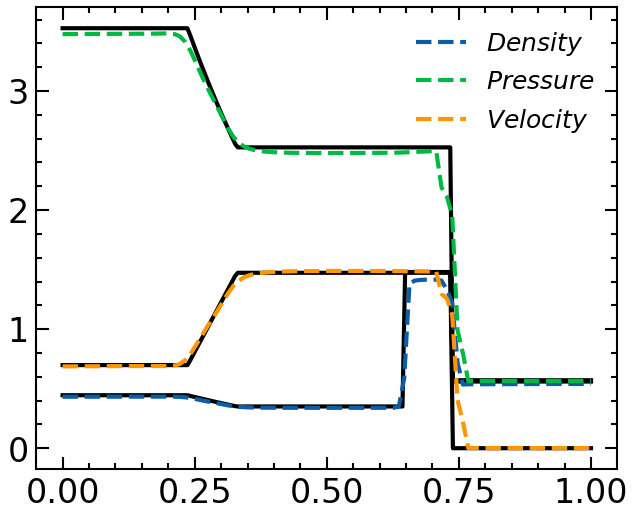

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.1522, -5.5804],
        [-0.1015, -2.6438]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0217, -0.0044],
        [ 0.0254,  0.9974]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0038,  0.0053,  0.2162,  0.0641,  0.1040,  0.5914]],
       device='cuda:0', dtype=torch.float64),tensor([[0.1124, 0.1434, 0.0923, 0.0198, 0.0662, 0.5560]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1235, 0.1351, 0.1127, 0.0088, 0.0807, 0.5410]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 9000 | Loss: 0.072052


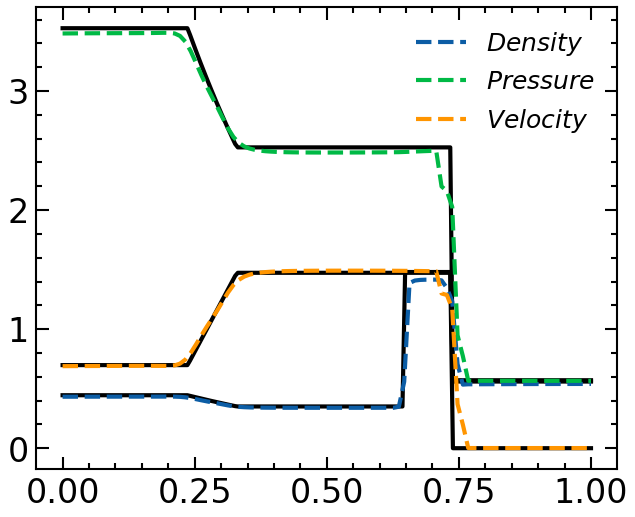

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.2559,  3.1695],
        [-0.0849,  1.0263]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0216, -0.0046],
        [ 0.0259,  0.9976]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0072,  0.0061,  0.1917,  0.0625,  0.1018,  0.6278]],
       device='cuda:0', dtype=torch.float64),tensor([[0.0993, 0.1413, 0.0816, 0.0122, 0.0598, 0.5977]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1093, 0.1321, 0.1018, 0.0016, 0.0722, 0.5834]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 10000 | Loss: 0.380396


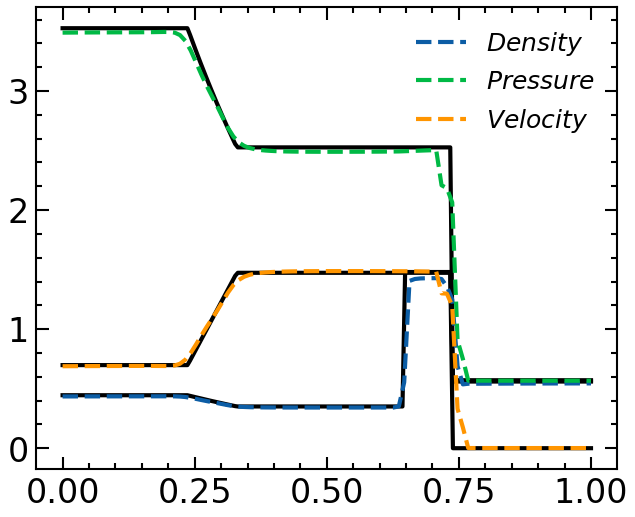

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.0081,  5.0055],
        [-0.0148,  2.3940]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0224, -0.0046],
        [ 0.0267,  0.9975]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0101,  0.0050,  0.1698,  0.0657,  0.0971,  0.6546]],
       device='cuda:0', dtype=torch.float64),tensor([[0.0900, 0.1357, 0.0705, 0.0089, 0.0557, 0.6319]], device='cuda:0',
       dtype=torch.float64),tensor([[ 0.0996,  0.1270,  0.0905, -0.0020,  0.0668,  0.6184]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 11000 | Loss: 0.331868


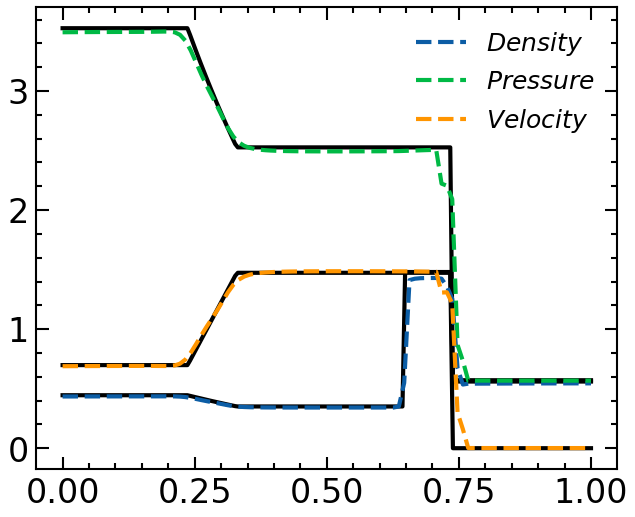

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.3118, 12.8104],
        [ 0.1121,  5.6538]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0238, -0.0049],
        [ 0.0295,  0.9979]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0013,  0.0253,  0.1378,  0.0212,  0.0823,  0.6293]],
       device='cuda:0', dtype=torch.float64),tensor([[ 0.0768,  0.1144,  0.0546, -0.0073,  0.0446,  0.6265]],
       device='cuda:0', dtype=torch.float64),tensor([[0.0763, 0.1135, 0.0757, 0.0102, 0.0451, 0.6815]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 12000 | Loss: 0.489237


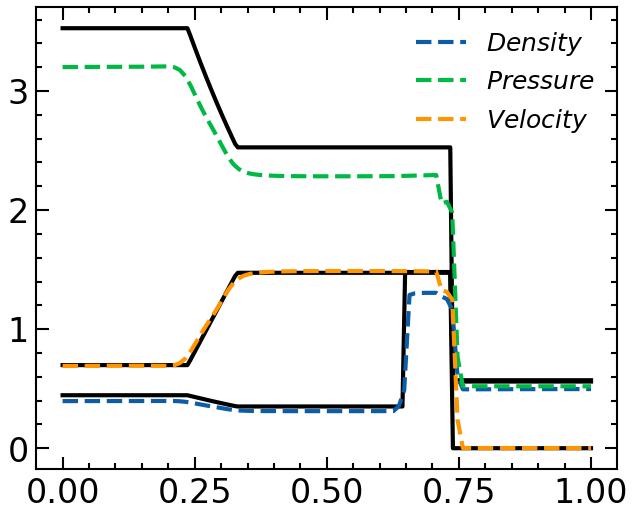

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.1158, -0.9418],
        [ 0.0613,  0.3996]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0238, -0.0049],
        [ 0.0295,  0.9979]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[0.0066, 0.0161, 0.1346, 0.0220, 0.1044, 0.6938]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0810, 0.0980, 0.0705, 0.0070, 0.0500, 0.6810]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0854, 0.0892, 0.0874, 0.0081, 0.0572, 0.6730]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 13000 | Loss: 0.071228


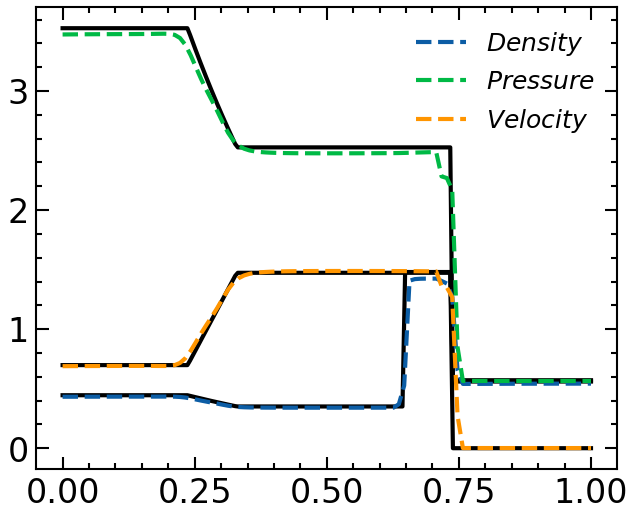

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.1335, -2.5758],
        [-0.0164, -0.8858]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0238, -0.0049],
        [ 0.0295,  0.9979]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[0.0060, 0.0135, 0.1131, 0.0202, 0.0901, 0.7390]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0652, 0.0940, 0.0599, 0.0103, 0.0358, 0.7250]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0715, 0.0908, 0.0728, 0.0062, 0.0448, 0.7164]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 14000 | Loss: 0.358293


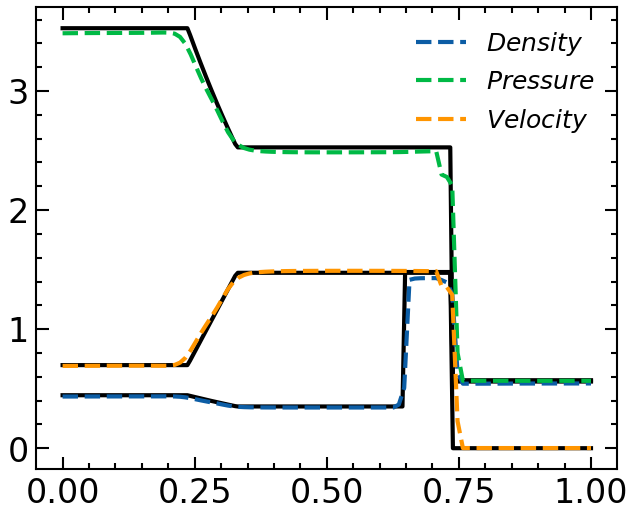

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.1787, -2.4166],
        [ 0.0455, -0.8471]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0240, -0.0049],
        [ 0.0295,  0.9978]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[0.0081, 0.0135, 0.0872, 0.0164, 0.0783, 0.7817]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0567, 0.0837, 0.0475, 0.0094, 0.0224, 0.7715]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0637, 0.0768, 0.0624, 0.0037, 0.0306, 0.7633]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 15000 | Loss: 0.025158


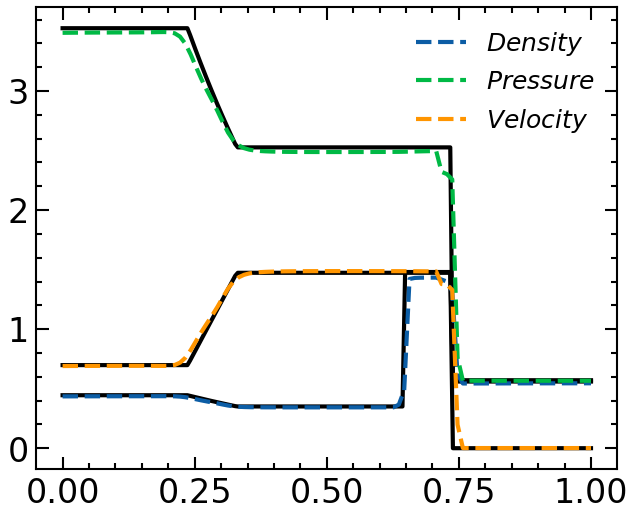

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.7005,  8.3858],
        [-0.3265, -2.2619]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0235, -0.0048],
        [ 0.0307,  0.9979]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.0208,  0.0033,  0.0806, -0.0016,  0.0628,  0.8244]],
       device='cuda:0', dtype=torch.float64),tensor([[0.0441, 0.0128, 0.0740, 0.0043, 0.0164, 0.8479]], device='cuda:0',
       dtype=torch.float64),tensor([[ 5.2184e-02,  2.7051e-04,  8.6822e-02, -3.4047e-04,  2.1576e-02,
          8.3779e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 16000 | Loss: 0.020195


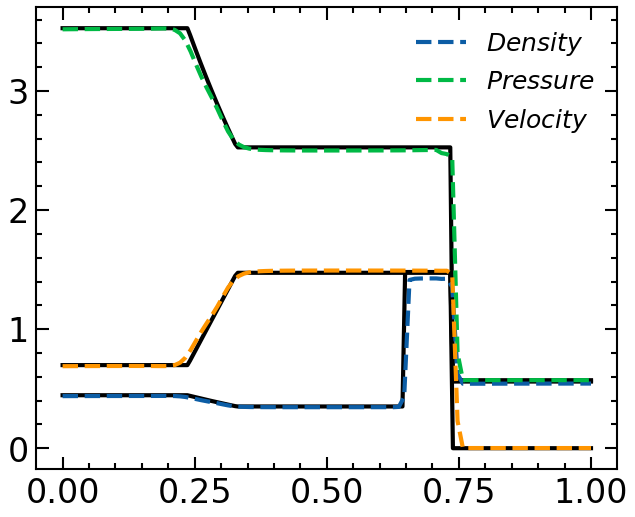

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.1735, -1.4839],
        [ 0.0429,  1.3411]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0224, -0.0050],
        [ 0.0328,  0.9979]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.0141,  0.0010,  0.0758, -0.0027,  0.0367,  0.8578]],
       device='cuda:0', dtype=torch.float64),tensor([[0.0284, 0.0055, 0.0800, 0.0028, 0.0118, 0.8684]], device='cuda:0',
       dtype=torch.float64),tensor([[ 3.3116e-02, -1.2616e-04,  8.6161e-02, -1.0523e-04,  1.5191e-02,
          8.6673e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 17000 | Loss: 0.033982


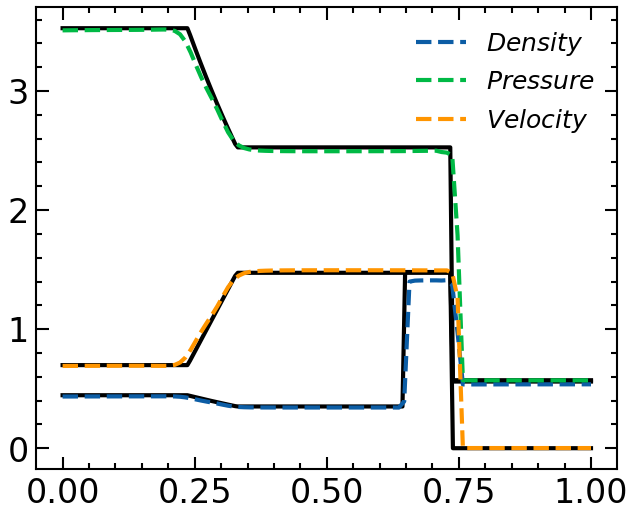

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.0955,  0.9540],
        [-0.0832, -0.4474]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0219, -0.0053],
        [ 0.0338,  0.9978]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.0129,  0.0016,  0.0704, -0.0020,  0.0322,  0.8705]],
       device='cuda:0', dtype=torch.float64),tensor([[0.0197, 0.0055, 0.0725, 0.0026, 0.0072, 0.8887]], device='cuda:0',
       dtype=torch.float64),tensor([[2.4015e-02, 4.0104e-04, 7.8543e-02, 8.7266e-04, 1.0302e-02, 8.9004e-01]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 18000 | Loss: 0.027827


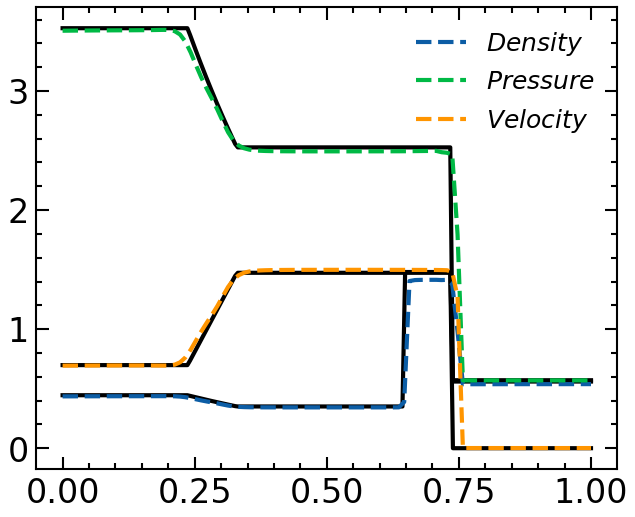

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 6.2711e-04,  1.6951e-01],
        [-1.7510e-05,  6.9214e-02]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0219, -0.0053],
        [ 0.0338,  0.9978]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[1.8774e-04, 5.2069e-04, 5.3985e-02, 5.2038e-04, 1.7238e-02, 9.1050e-01]],
       device='cuda:0', dtype=torch.float64),tensor([[2.3782e-02, 1.0447e-02, 6.4569e-02, 1.2370e-03, 3.5037e-04, 8.9763e-01]],
       device='cuda:0', dtype=torch.float64),tensor([[ 2.7096e-02,  1.0090e-02,  6.6052e-02, -5.8746e-04,  1.6492e-03,
          9.0147e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 19000 | Loss: 0.011224


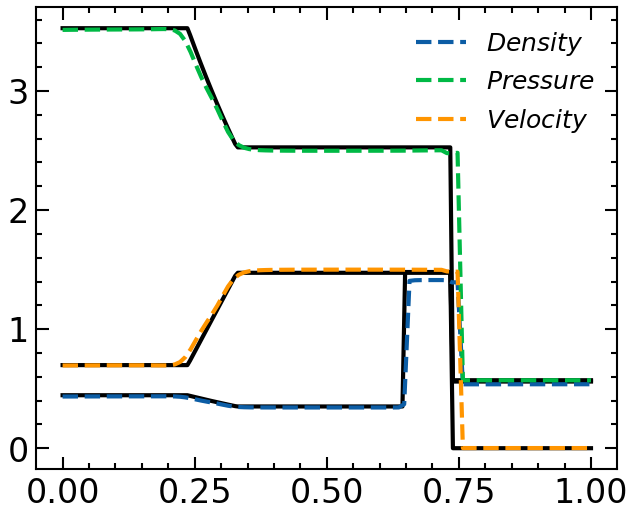

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 1.0219, -0.0053],
        [ 0.0338,  0.9978]], device='cuda:0', dtype=torch.float64) and tensor([[ 4.3897e-03, -2.7767e-04,  4.1309e-02, -3.3100e-03,  1.2125e-02,
          9.2080e-01]], device='cuda:0', dtype=torch.float64),tensor([[ 0.0287,  0.0029,  0.0466, -0.0026,  0.0028,  0.9155]],
       device='cuda:0', dtype=torch.float64),tensor([[ 0.0322, -0.0010,  0.0497, -0.0025,  0.0035,  0.9257]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 20000 | Loss: 0.016752 (TGPT_PINN2 Step Criteria Met)



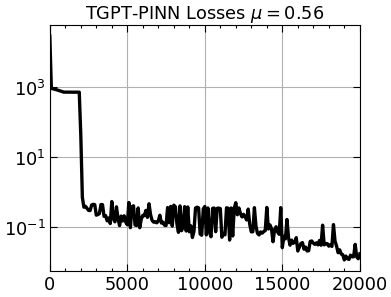

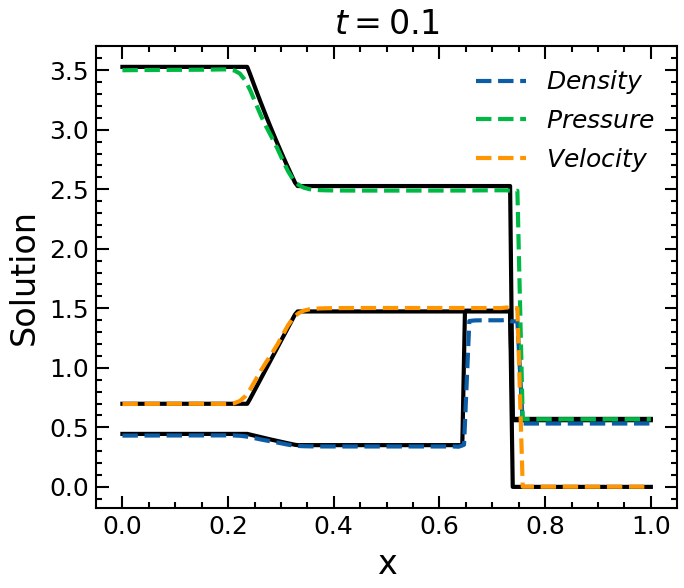

In [8]:
ini[3] = 0.56
weno_u = exact_solver([ini[0],ini[2],ini[1]],[ini[3],ini[5],ini[4]],gamma,Tf,N=200)
for i in range(5,number_of_neurons):
    layers_gpt = np.array([2, i+1, 3])
    c_initial  = torch.full((1,i+1), 1/(i+1))
    IC_data = create_IC_data(ini,Xi, Xf, Ti, Tf, IC_pts)
    IC_xt     = IC_data[0].to(device)
    IC_u      = IC_data[1]

    BC_data = create_BC_data(ini,Xi, Xf, Ti, Tf, IC_pts)
    BC_xt     = BC_data[0].to(device)
    BC_u      = BC_data[1]

    xt_en = Move_Time_1D(IC_xt, Tf).to(device)
    #weno_u = Euler_WENO(Xi,Xf,Ti,Tf,ini,gamma,delta_t=0.0001,delta_x=0.005)
    #weno_u = exact_solver([ini[0],ini[2],ini[1]],[ini[3],ini[5],ini[4]],gamma,Tf,N=200)
    TGPT_PINN = GPT(ini, layers_gpt, P_list[0:i+1], c_initial, Nc, Tc, gamma,Tf).to(device).double()
    
    tgpt_losses = gpt_train(TGPT_PINN, ini, xt_resid,  IC_xt, IC_u,BC_xt, BC_u, f_hat,xt_test,xt_en, xt_RH, xt_RHL,weno_u,  epochs_tgpt, lr_tgpt, 1e-3)

    loss_plot(tgpt_losses[1], tgpt_losses[2], dpi=80, figsize=(5,4),title=fr"TGPT-PINN Losses $\mu={round(ini[3],3)}$")
    
    Nx_test=N_test
    Nt_test=T_test
    plt.figure(dpi=150, figsize=(5,4))
    
    ind = 100
    plt.plot(weno_u[3],weno_u[0],'k')#,label="$Density$"
    plt.plot(weno_u[3],weno_u[1],'k')#,label="$Pressure$"
    plt.plot(weno_u[3],weno_u[2],'k')#,label="$velocity$"
    
    #plt.plot(xt_test[0::Nt_test,1].detach().cpu(),P_list[0](xt_test)[:,0:1][ind-1::Nx_test].detach().cpu(),'k',label=fr"$Density$")
    #plt.plot(xt_test[0::Nt_test,1].detach().cpu(),P_list[0](xt_test)[:,1:2][ind-1::Nx_test].detach().cpu(),'k',label=fr"$Pressure$")
    #plt.plot(xt_test[0::Nt_test,1].detach().cpu(),P_list[0](xt_test)[:,2:][ind-1::Nx_test].detach().cpu(),'k',label=fr"$Velocity$")
    
    plt.plot(xt_test[0::Nt_test,1].detach().cpu(),TGPT_PINN(xt_test)[0][ind-1::Nx_test].detach().cpu(),'--',label=fr"$Density$")
    plt.plot(xt_test[0::Nt_test,1].detach().cpu(),TGPT_PINN(xt_test)[1][ind-1::Nx_test].detach().cpu(),'--',label=fr"$Pressure$")
    plt.plot(xt_test[0::Nt_test,1].detach().cpu(),TGPT_PINN(xt_test)[2][ind-1::Nx_test].detach().cpu(),'--',label=fr"$Velocity$")
    plt.xlabel("x",     fontsize=16)
    plt.ylabel("Solution", fontsize=16)
    plt.title(fr"$t={round((ind-1)*(Tf-Ti)/(Nt_test-1),3)}$")
    plt.tick_params(axis='both', which='major', labelsize=12)
    plt.tick_params(axis='both', which='minor', labelsize=12)
    
    plt.legend(fontsize = 12)#
    plt.show()

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: tensor([[ 1.0219, -0.0053],
        [ 0.0338,  0.9978]], device='cuda:0', dtype=torch.float64) and tensor([[ 4.3897e-03, -2.7767e-04,  4.1309e-02, -3.3100e-03,  1.2125e-02,
          9.2080e-01]], device='cuda:0', dtype=torch.float64),tensor([[ 0.0287,  0.0029,  0.0466, -0.0026,  0.0028,  0.9155]],
       device='cuda:0', dtype=torch.float64),tensor([[ 0.0322, -0.0010,  0.0497, -0.0025,  0.0035,  0.9257]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: Loss: 1466.546426
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]: Epoch: 0 | Loss: 1466.5464258449385
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 500 | Loss: 0.512759
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 1000 | Loss: 0.279846
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 1500 | Loss: 0.160231
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 2000 | Loss: 0.103209
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 1.0219, -0.0053],
        [ 0.0339,  0.9979

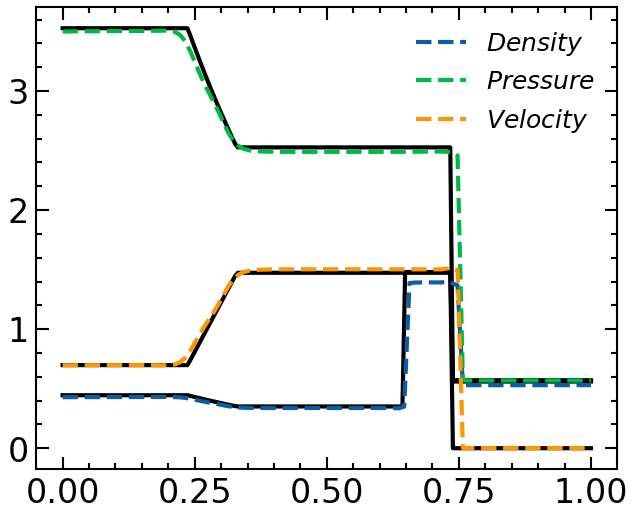

Step 2 Training Begin...
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.0138, -2.3964],
        [ 0.0063, -1.0336]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0214, -0.0053],
        [ 0.0347,  0.9990]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0013, -0.0052,  0.0286,  0.0168, -0.0046,  0.9393]],
       device='cuda:0', dtype=torch.float64),tensor([[ 0.0260, -0.0156,  0.0341,  0.0122,  0.0206,  0.9193]],
       device='cuda:0', dtype=torch.float64),tensor([[ 0.0289, -0.0214,  0.0382,  0.0106,  0.0254,  0.9277]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 3000 | Loss: 0.013017


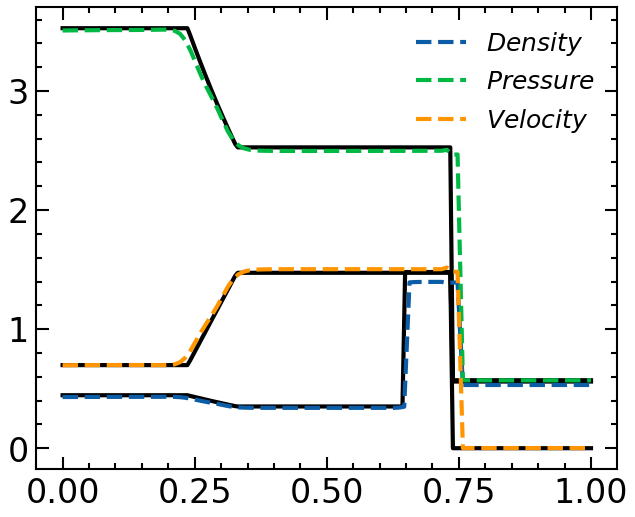

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.0009, -0.5077],
        [-0.0052, -0.2466]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0214, -0.0053],
        [ 0.0347,  0.9990]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 1.4738e-03, -3.6528e-03,  2.7692e-02, -2.4176e-04,  7.4372e-03,
          9.4334e-01]], device='cuda:0', dtype=torch.float64),tensor([[ 2.9290e-02, -1.7056e-02,  3.1094e-02, -4.0892e-04,  2.0892e-02,
          9.3380e-01]], device='cuda:0', dtype=torch.float64),tensor([[ 2.8489e-02, -2.4344e-02,  3.5231e-02, -9.7348e-05,  2.4048e-02,
          9.4522e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 4000 | Loss: 0.010617


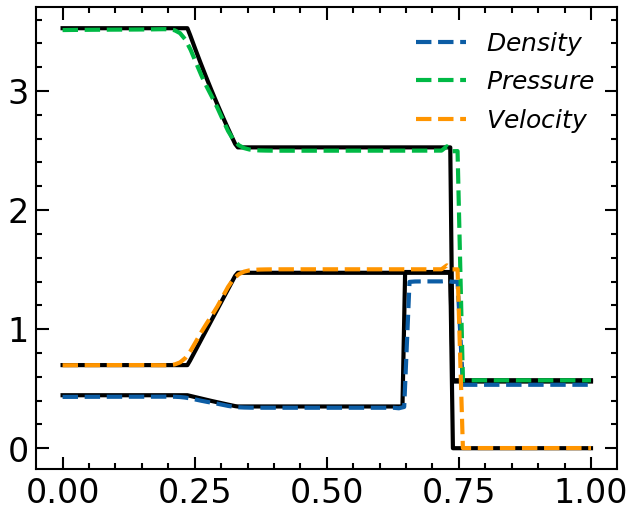

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.0848, -1.4827],
        [ 0.0396, -0.7304]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0212, -0.0052],
        [ 0.0349,  0.9994]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 6.9260e-04, -3.1897e-03,  2.2668e-02,  6.0983e-04,  4.6554e-03,
          9.4811e-01]], device='cuda:0', dtype=torch.float64),tensor([[ 2.9779e-02, -1.6199e-02,  2.6759e-02, -7.1087e-06,  1.8335e-02,
          9.4022e-01]], device='cuda:0', dtype=torch.float64),tensor([[ 2.6582e-02, -2.2229e-02,  2.8677e-02,  7.8409e-04,  2.0171e-02,
          9.5419e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 5000 | Loss: 0.019674


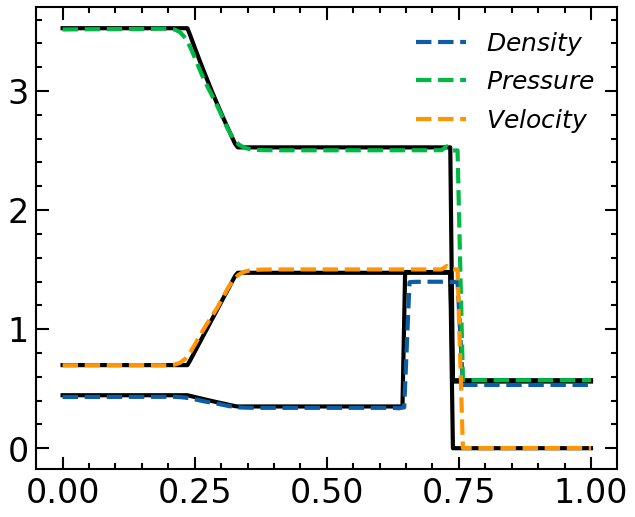

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0166,  0.2378],
        [-0.0048,  0.1673]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0205, -0.0051],
        [ 0.0347,  0.9998]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 9.1140e-04, -1.8155e-03,  1.8380e-02,  1.2149e-03,  3.0071e-03,
          9.5531e-01]], device='cuda:0', dtype=torch.float64),tensor([[ 0.0294, -0.0106,  0.0193,  0.0010,  0.0114,  0.9467]],
       device='cuda:0', dtype=torch.float64),tensor([[ 0.0268, -0.0144,  0.0218,  0.0014,  0.0125,  0.9618]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 6000 | Loss: 0.007793


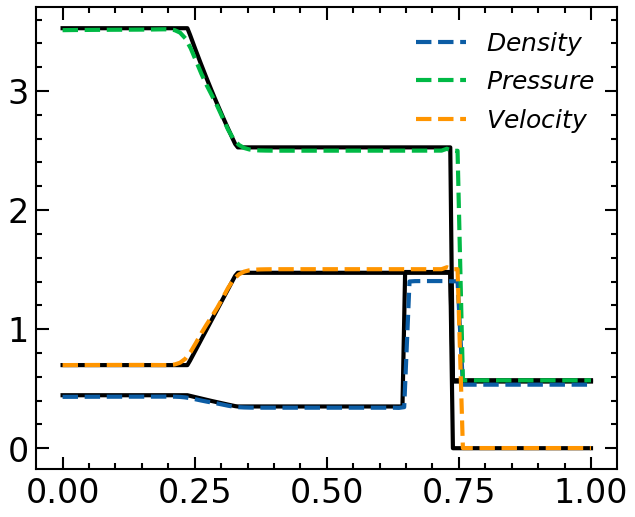

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.0416,  0.1016],
        [-0.0097, -0.1871]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0205, -0.0050],
        [ 0.0348,  1.0000]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 3.4006e-03, -7.2632e-04,  1.6295e-02,  1.3717e-03,  4.3311e-03,
          9.5145e-01]], device='cuda:0', dtype=torch.float64),tensor([[ 0.0265, -0.0059,  0.0162,  0.0010,  0.0075,  0.9515]],
       device='cuda:0', dtype=torch.float64),tensor([[ 2.3887e-02, -9.3959e-03,  1.8484e-02,  4.5580e-04,  7.4523e-03,
          9.6630e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 7000 | Loss: 0.008623


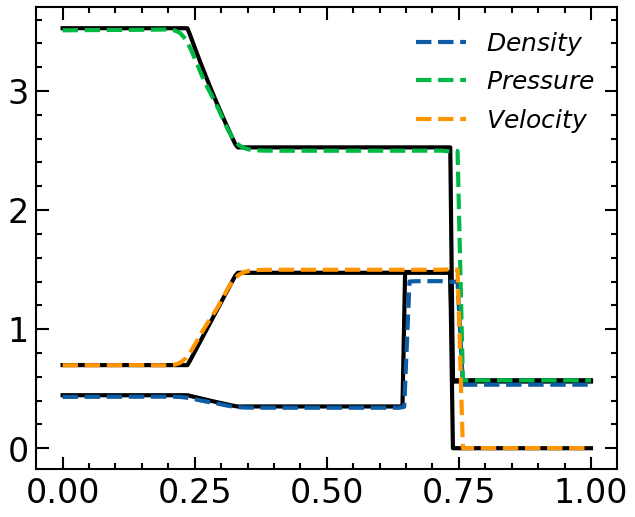

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[0.0132, 0.0471],
        [0.0053, 0.0247]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0205, -0.0050],
        [ 0.0348,  1.0000]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 1.2299e-03, -6.5684e-04,  1.2397e-02, -1.5406e-04,  1.9998e-03,
          9.6224e-01]], device='cuda:0', dtype=torch.float64),tensor([[ 2.7326e-02, -4.5348e-03,  1.3391e-02,  3.1070e-04,  5.2886e-03,
          9.5573e-01]], device='cuda:0', dtype=torch.float64),tensor([[ 2.4606e-02, -6.8407e-03,  1.4866e-02,  3.8880e-04,  5.9500e-03,
          9.7035e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 8000 | Loss: 0.006813


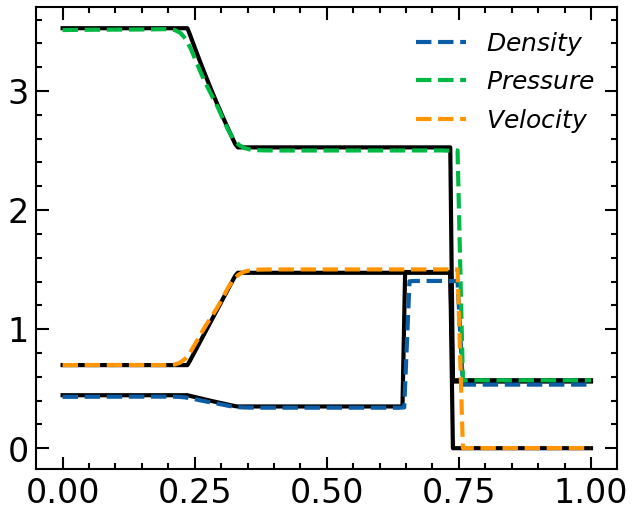

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.0057,  0.0597],
        [-0.0016,  0.0176]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0204, -0.0050],
        [ 0.0348,  1.0000]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 1.2186e-03, -2.4435e-04,  1.0551e-02, -2.5637e-04,  1.7189e-03,
          9.6443e-01]], device='cuda:0', dtype=torch.float64),tensor([[ 2.6634e-02, -3.2369e-03,  1.1093e-02, -8.3608e-05,  4.5308e-03,
          9.5850e-01]], device='cuda:0', dtype=torch.float64),tensor([[ 2.4055e-02, -5.6805e-03,  1.2584e-02,  3.3696e-04,  4.9517e-03,
          9.7301e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 9000 | Loss: 0.007026


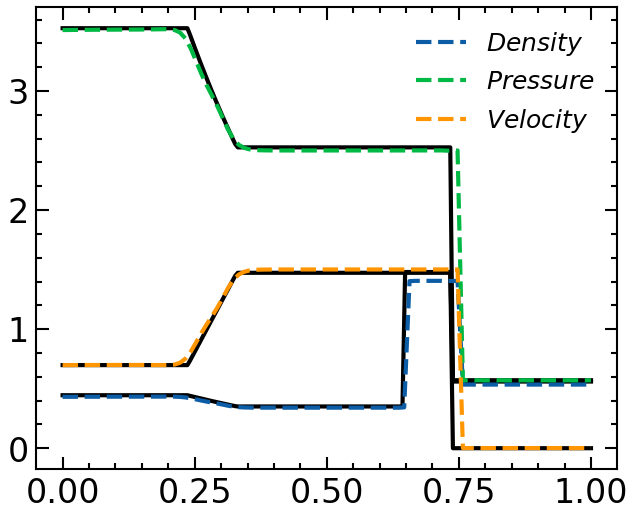

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0481, -1.1789],
        [-0.0182,  0.1543]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0209, -0.0053],
        [ 0.0354,  0.9993]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.0051, -0.0019,  0.0430,  0.0118,  0.0117,  0.9099]],
       device='cuda:0', dtype=torch.float64),tensor([[ 0.0196, -0.0016,  0.0222,  0.0078, -0.0072,  0.9595]],
       device='cuda:0', dtype=torch.float64),tensor([[ 0.0240, -0.0018,  0.0211,  0.0128, -0.0121,  0.9647]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 10000 | Loss: 0.022596


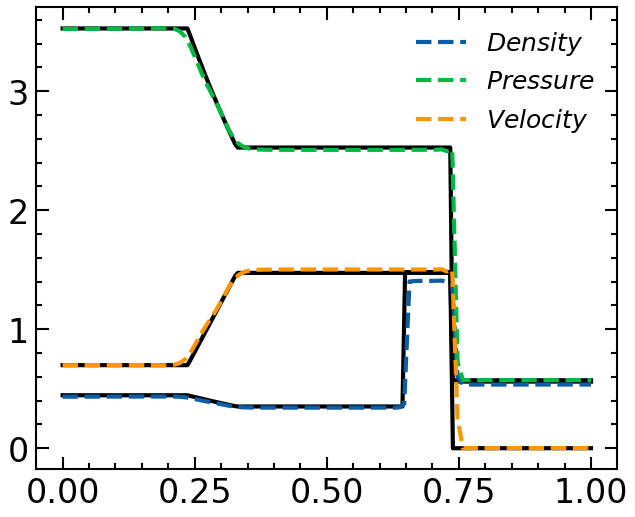

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.0229,  0.0015],
        [-0.0555, -0.4750]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0208, -0.0050],
        [ 0.0371,  0.9996]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 8.4303e-03, -4.0000e-04,  4.9302e-02,  2.6633e-03,  1.3790e-02,
          9.0755e-01]], device='cuda:0', dtype=torch.float64),tensor([[ 1.4121e-02, -3.1678e-04,  3.5787e-02,  2.4996e-04, -3.2820e-03,
          9.5405e-01]], device='cuda:0', dtype=torch.float64),tensor([[ 1.5789e-02, -3.6180e-04,  3.4554e-02,  2.4881e-03, -4.3213e-03,
          9.6113e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 11000 | Loss: 0.015916


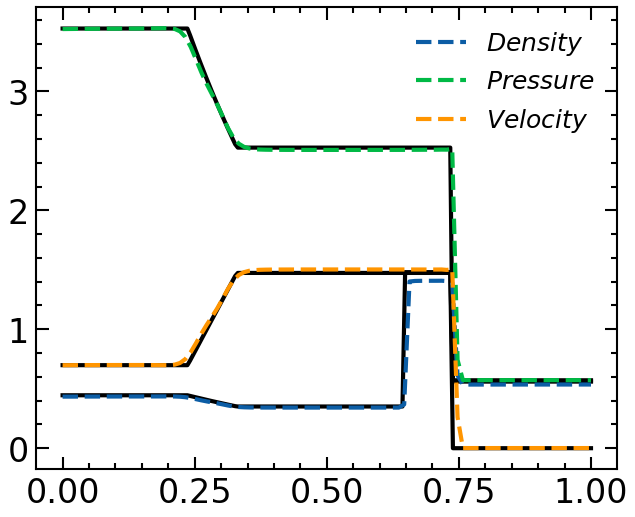

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0691, -0.7572],
        [ 0.0397,  0.3928]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0204, -0.0048],
        [ 0.0390,  1.0001]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 9.9442e-03, -9.4103e-05,  5.2288e-02, -1.6676e-03,  1.6995e-02,
          9.0350e-01]], device='cuda:0', dtype=torch.float64),tensor([[ 1.3451e-02, -8.9150e-04,  3.9100e-02, -2.2859e-03,  8.1675e-04,
          9.5131e-01]], device='cuda:0', dtype=torch.float64),tensor([[ 1.3225e-02,  1.9758e-07,  3.7339e-02, -7.8741e-04, -1.0390e-04,
          9.5981e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 12000 | Loss: 0.019785


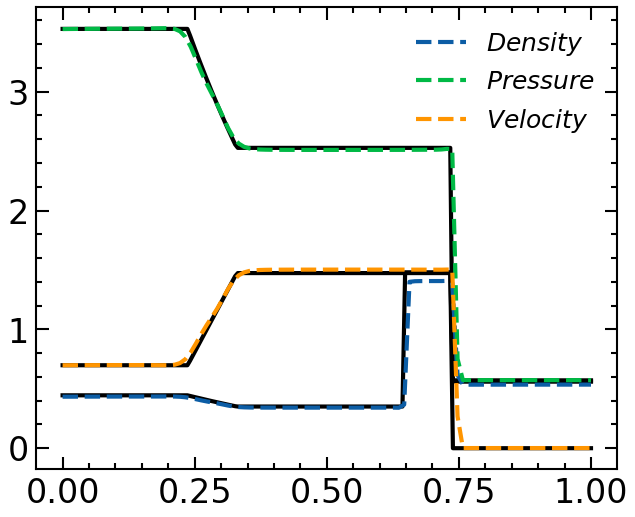

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ -2.0724, -19.4496],
        [  0.7824,   7.3196]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0196, -0.0050],
        [ 0.0401,  1.0009]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.0059,  0.0083,  0.0478, -0.0042,  0.0164,  0.9039]],
       device='cuda:0', dtype=torch.float64),tensor([[-0.0081,  0.0067,  0.0517, -0.0027,  0.0042,  0.9484]],
       device='cuda:0', dtype=torch.float64),tensor([[-0.0077,  0.0105,  0.0485, -0.0018,  0.0043,  0.9569]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 13000 | Loss: 0.030347


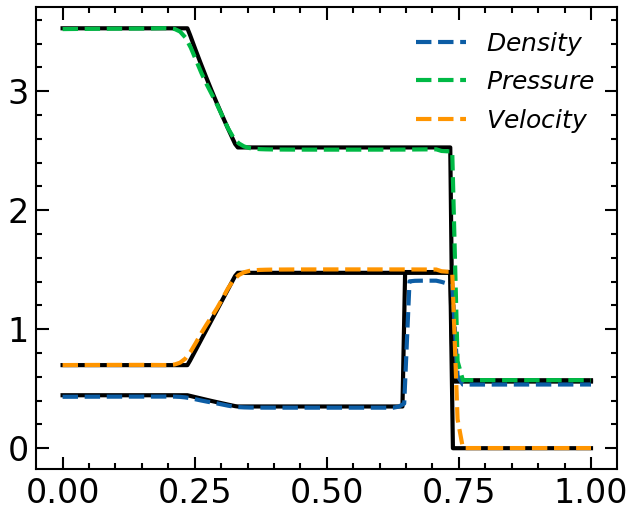

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.0215, -0.3021],
        [ 0.0178,  0.4050]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0196, -0.0050],
        [ 0.0401,  1.0009]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 7.3679e-03, -1.2844e-03,  5.2250e-02,  4.4855e-04,  1.3220e-02,
          9.1055e-01]], device='cuda:0', dtype=torch.float64),tensor([[-0.0045, -0.0032,  0.0521, -0.0021,  0.0034,  0.9555]],
       device='cuda:0', dtype=torch.float64),tensor([[-3.2978e-03, -1.6124e-04,  4.8952e-02, -9.0523e-04,  3.1267e-03,
          9.6269e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 14000 | Loss: 0.009705


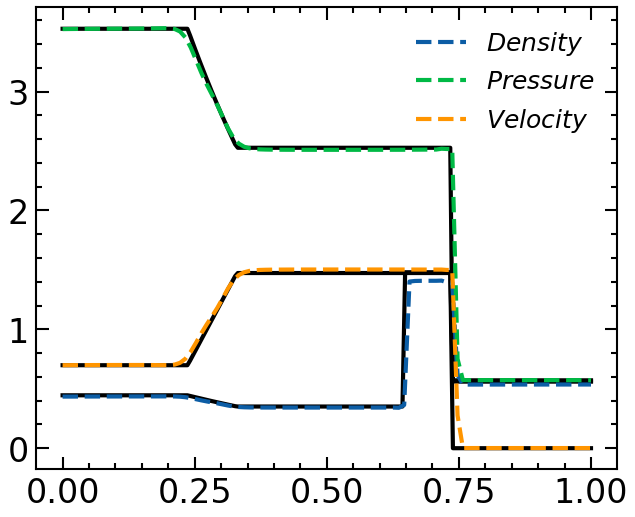

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 0.6518,  7.8546],
        [-0.2623, -3.0021]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0198, -0.0050],
        [ 0.0400,  1.0008]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 6.5594e-03, -1.7900e-03,  5.0457e-02,  4.8059e-04,  1.2842e-02,
          9.1093e-01]], device='cuda:0', dtype=torch.float64),tensor([[-0.0046, -0.0041,  0.0512, -0.0018,  0.0030,  0.9565]],
       device='cuda:0', dtype=torch.float64),tensor([[-3.7730e-03, -1.9668e-04,  4.8118e-02, -9.2779e-04,  3.1107e-03,
          9.6352e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 15000 | Loss: 0.009339


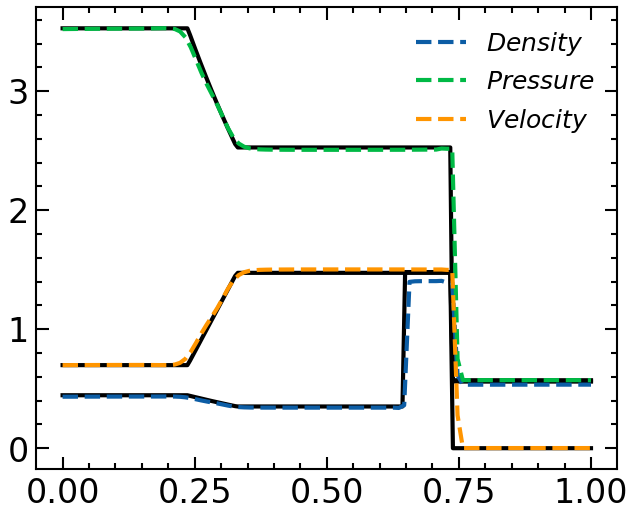

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-19.1764,  81.5309],
        [  7.0525, -26.7679]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0198, -0.0052],
        [ 0.0401,  1.0009]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-2.9812e-02,  1.1218e-04,  1.1188e-01, -1.1647e-02, -4.9698e-03,
          9.0548e-01]], device='cuda:0', dtype=torch.float64),tensor([[-0.0084,  0.0072,  0.0709, -0.0063, -0.0295,  0.9660]],
       device='cuda:0', dtype=torch.float64),tensor([[ 2.8089e-02, -3.3382e-04,  7.0811e-02,  1.6473e-04, -3.0616e-02,
          9.3440e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 16000 | Loss: 0.087445


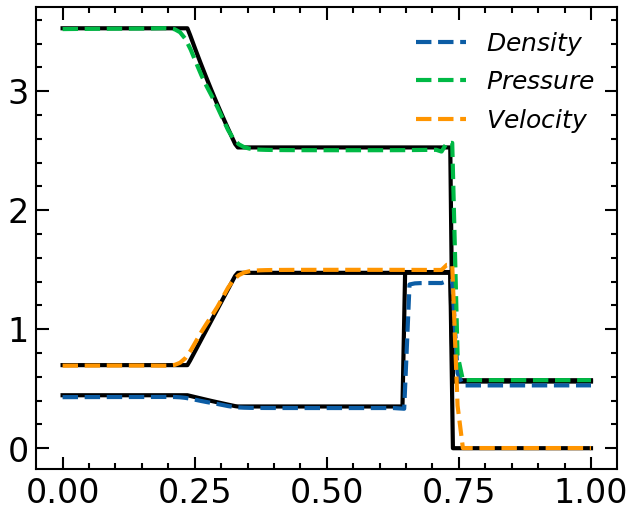

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[0.0221, 0.8541],
        [0.0184, 1.5934]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0199, -0.0052],
        [ 0.0400,  1.0009]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-1.8267e-02,  5.6511e-06,  1.0348e-01, -5.1270e-03,  8.0931e-03,
          8.9455e-01]], device='cuda:0', dtype=torch.float64),tensor([[ 0.0160,  0.0057,  0.0588, -0.0035, -0.0229,  0.9464]],
       device='cuda:0', dtype=torch.float64),tensor([[ 2.5555e-02,  1.4191e-04,  5.9762e-02,  1.1723e-03, -2.6827e-02,
          9.4688e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 17000 | Loss: 0.024716


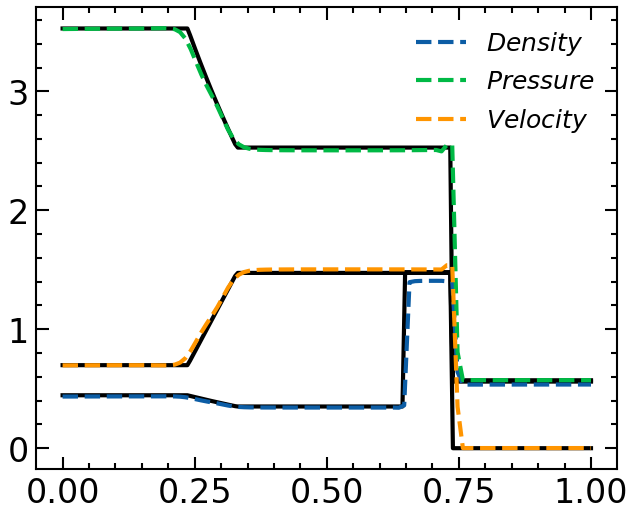

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[  2.9653,  51.3589],
        [ -1.1886, -21.3726]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0200, -0.0052],
        [ 0.0399,  1.0009]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 2.3758e-04, -1.8243e-03,  6.8300e-02,  7.7899e-05,  5.8215e-03,
          9.1051e-01]], device='cuda:0', dtype=torch.float64),tensor([[ 0.0203,  0.0047,  0.0403, -0.0018, -0.0226,  0.9594]],
       device='cuda:0', dtype=torch.float64),tensor([[ 2.3207e-02,  4.0874e-05,  4.2475e-02, -1.6446e-04, -2.3450e-02,
          9.6596e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 18000 | Loss: 0.012486


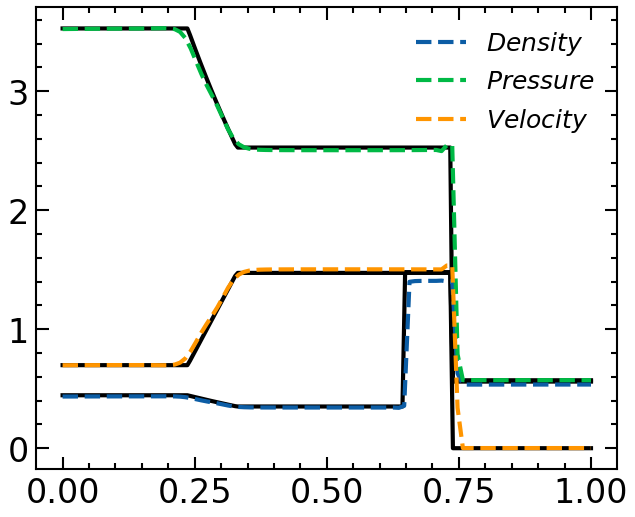

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-0.6845, -5.2730],
        [ 0.2528,  1.6577]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0201, -0.0052],
        [ 0.0398,  1.0009]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[-2.4426e-04, -1.3003e-03,  6.7025e-02,  5.4786e-04, -2.3918e-02,
          9.3567e-01]], device='cuda:0', dtype=torch.float64),tensor([[ 0.0100, -0.0014,  0.0256, -0.0019,  0.0156,  0.9533]],
       device='cuda:0', dtype=torch.float64),tensor([[ 0.0099, -0.0012,  0.0254, -0.0016,  0.0154,  0.9628]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 19000 | Loss: 0.044145


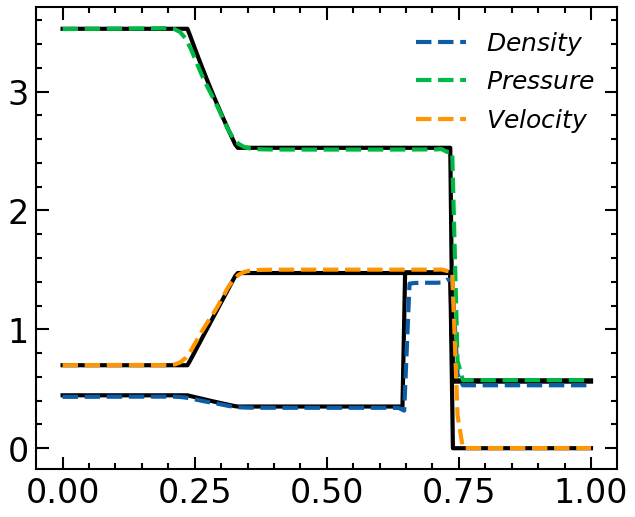

[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:tensor([[ 1.0200, -0.0052],
        [ 0.0398,  1.0009]], device='cuda:0', dtype=torch.float64) and tensor([[-6.9692e-05,  1.2586e-03,  5.2972e-02,  6.0809e-04, -4.8930e-03,
          9.3065e-01]], device='cuda:0', dtype=torch.float64),tensor([[-0.0074,  0.0093,  0.0384, -0.0016,  0.0035,  0.9580]],
       device='cuda:0', dtype=torch.float64),tensor([[-0.0077,  0.0178,  0.0328, -0.0022,  0.0046,  0.9674]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.56, 0.571, 0.0]:Epoch: 20000 | Loss: 0.012421 (TGPT_PINN2 Step Criteria Met)



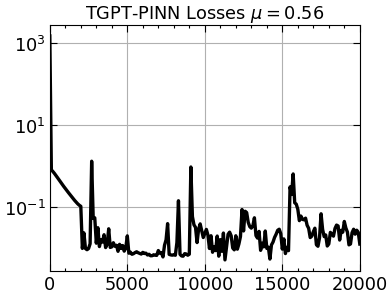

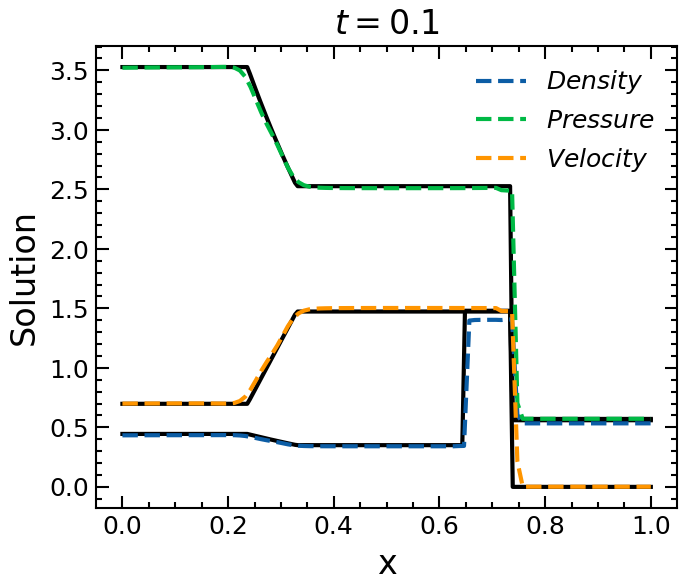

In [9]:
tgpt_losses1 = gpt_train(TGPT_PINN, ini, xt_resid,  IC_xt, IC_u,BC_xt, BC_u, f_hat,xt_test,xt_en, xt_RH, xt_RHL,weno_u,  epochs_tgpt, lr_tgpt, 1e-3)

loss_plot(tgpt_losses1[1], tgpt_losses1[2], dpi=80, figsize=(5,4),title=fr"TGPT-PINN Losses $\mu={round(ini[3],3)}$")

Nx_test=N_test
Nt_test=T_test
plt.figure(dpi=150, figsize=(5,4))

ind = 100
plt.plot(weno_u[3],weno_u[0],'k')#,label="$Density$"
plt.plot(weno_u[3],weno_u[1],'k')#,label="$Pressure$"
plt.plot(weno_u[3],weno_u[2],'k')#,label="$velocity$"

#plt.plot(xt_test[0::Nt_test,1].detach().cpu(),P_list[0](xt_test)[:,0:1][ind-1::Nx_test].detach().cpu(),'k',label=fr"$Density$")
#plt.plot(xt_test[0::Nt_test,1].detach().cpu(),P_list[0](xt_test)[:,1:2][ind-1::Nx_test].detach().cpu(),'k',label=fr"$Pressure$")
#plt.plot(xt_test[0::Nt_test,1].detach().cpu(),P_list[0](xt_test)[:,2:][ind-1::Nx_test].detach().cpu(),'k',label=fr"$Velocity$")

plt.plot(xt_test[0::Nt_test,1].detach().cpu(),TGPT_PINN(xt_test)[0][ind-1::Nx_test].detach().cpu(),'--',label=fr"$Density$")
plt.plot(xt_test[0::Nt_test,1].detach().cpu(),TGPT_PINN(xt_test)[1][ind-1::Nx_test].detach().cpu(),'--',label=fr"$Pressure$")
plt.plot(xt_test[0::Nt_test,1].detach().cpu(),TGPT_PINN(xt_test)[2][ind-1::Nx_test].detach().cpu(),'--',label=fr"$Velocity$")
plt.xlabel("x",     fontsize=16)
plt.ylabel("Solution", fontsize=16)
plt.title(fr"$t={round((ind-1)*(Tf-Ti)/(Nt_test-1),3)}$")
plt.tick_params(axis='both', which='major', labelsize=12)
plt.tick_params(axis='both', which='minor', labelsize=12)

plt.legend(fontsize = 12)#
plt.show()

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]: tensor([[1., 0.],
        [0., 1.]], device='cuda:0', dtype=torch.float64) and tensor([[1.]], device='cuda:0', dtype=torch.float64),tensor([[1.]], device='cuda:0', dtype=torch.float64),tensor([[1.]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]: Loss: 102271.066964
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]: Epoch: 0 | Loss: 102271.06696412494
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 500 | Loss: 2.560750
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 1000 | Loss: 2.402824
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 1500 | Loss: 2.206448
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 2000 | Loss: 1.982506
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 9.9958e-01, -3.4089e-04],
        [ 4.1285e-04,  1.0003e+00]], device='cuda:0', dtype=torch.float64) and tensor([[1.]], device='cuda:0', dtype=torch.float64),tensor([[1.]], device='cuda:0', dtype=torch.float64),tensor([[1.]], device='cuda:0', dtype=t

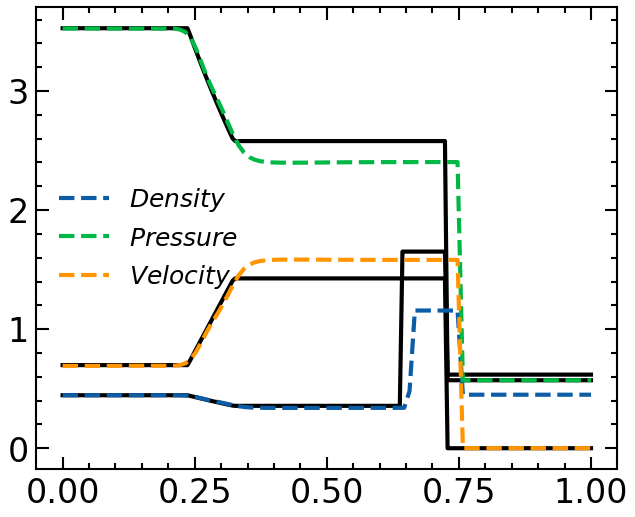

Step 2 Training Begin...
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 2.6674, -3.0625],
        [-0.8151, -2.9993]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9952e-01, -1.1343e-04],
        [-3.1331e-05,  1.0003e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0086]], device='cuda:0', dtype=torch.float64),tensor([[1.0044]], device='cuda:0', dtype=torch.float64),tensor([[0.9991]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 3000 | Loss: 0.032825


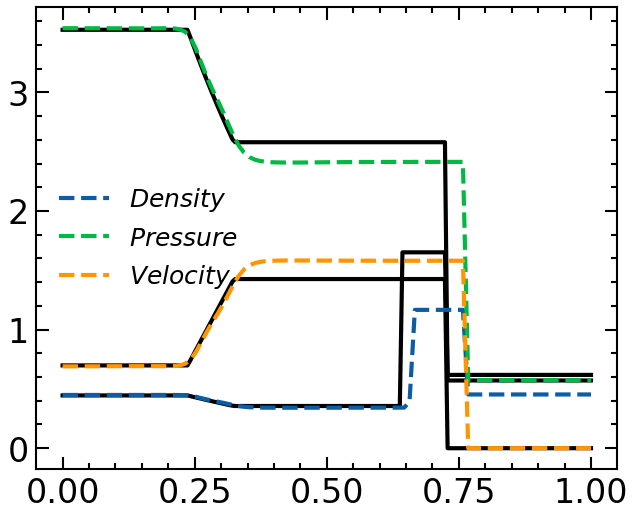

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 1.6942, -2.1919],
        [-0.4578, -1.9722]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9901e-01, -4.0150e-05],
        [ 1.4261e-04,  1.0005e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0097]], device='cuda:0', dtype=torch.float64),tensor([[1.0044]], device='cuda:0', dtype=torch.float64),tensor([[0.9984]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 4000 | Loss: 0.031140


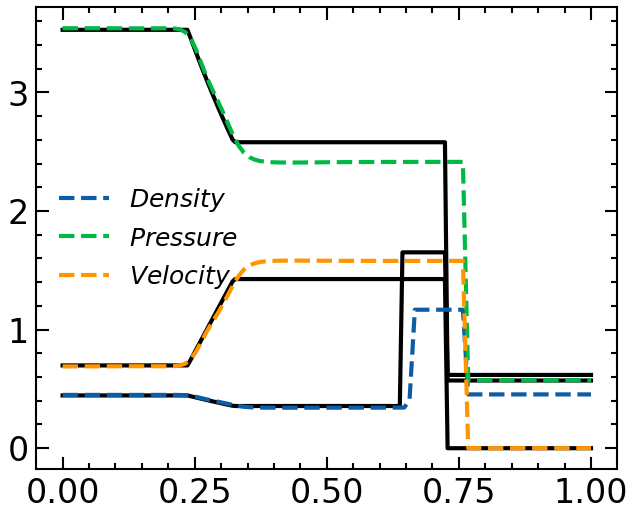

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-1.0695, -0.9651],
        [-0.2041,  1.8732]], device='cuda:0', dtype=torch.float64) and tensor([[9.9838e-01, 1.7460e-04],
        [9.9573e-04, 1.0009e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0124]], device='cuda:0', dtype=torch.float64),tensor([[1.0041]], device='cuda:0', dtype=torch.float64),tensor([[0.9972]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 5000 | Loss: 0.028773


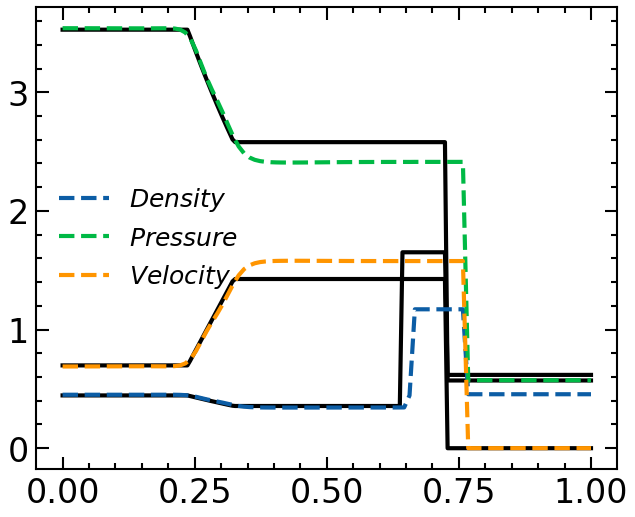

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.9945, -1.9380],
        [ 0.5953,  1.2901]], device='cuda:0', dtype=torch.float64) and tensor([[9.9776e-01, 7.0716e-04],
        [2.7661e-03, 1.0018e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0160]], device='cuda:0', dtype=torch.float64),tensor([[1.0046]], device='cuda:0', dtype=torch.float64),tensor([[0.9953]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 6000 | Loss: 0.028234


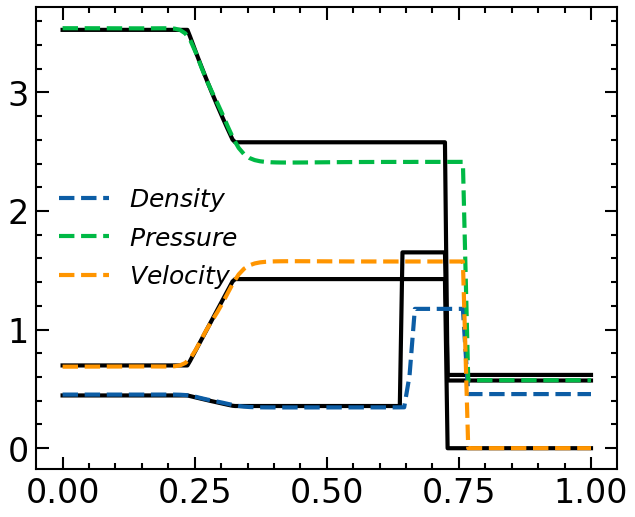

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.3570,  1.3121],
        [-0.3174,  0.2977]], device='cuda:0', dtype=torch.float64) and tensor([[9.9781e-01, 8.7281e-04],
        [2.6917e-03, 1.0017e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0143]], device='cuda:0', dtype=torch.float64),tensor([[1.0049]], device='cuda:0', dtype=torch.float64),tensor([[0.9956]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 7000 | Loss: 0.028176


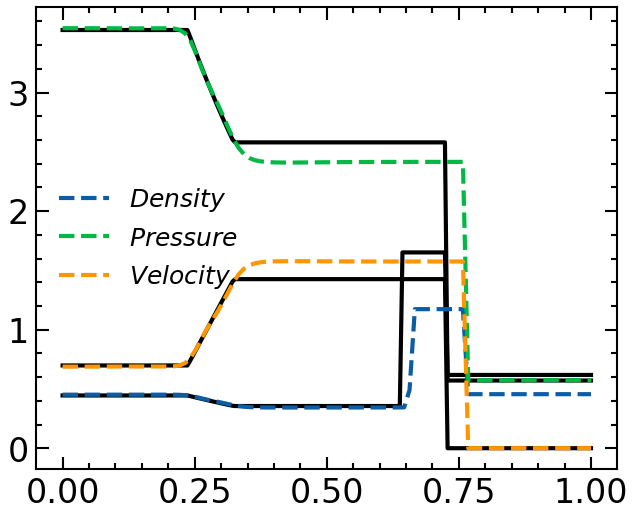

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ -1.1883, -15.2965],
        [  0.0552,   7.1518]], device='cuda:0', dtype=torch.float64) and tensor([[9.9781e-01, 8.7067e-04],
        [2.7734e-03, 1.0017e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0145]], device='cuda:0', dtype=torch.float64),tensor([[1.0050]], device='cuda:0', dtype=torch.float64),tensor([[0.9955]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 8000 | Loss: 0.028199


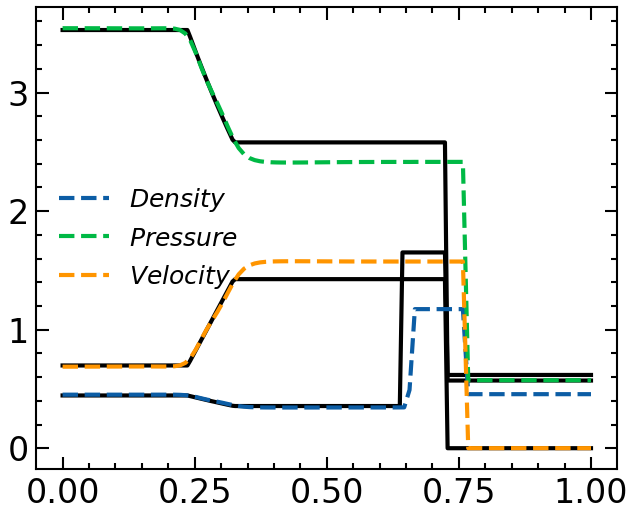

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[  2.3808, -12.2964],
        [ -1.1708,   3.5188]], device='cuda:0', dtype=torch.float64) and tensor([[9.9785e-01, 8.6745e-04],
        [2.9595e-03, 1.0017e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0151]], device='cuda:0', dtype=torch.float64),tensor([[1.0048]], device='cuda:0', dtype=torch.float64),tensor([[0.9955]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 9000 | Loss: 0.028449


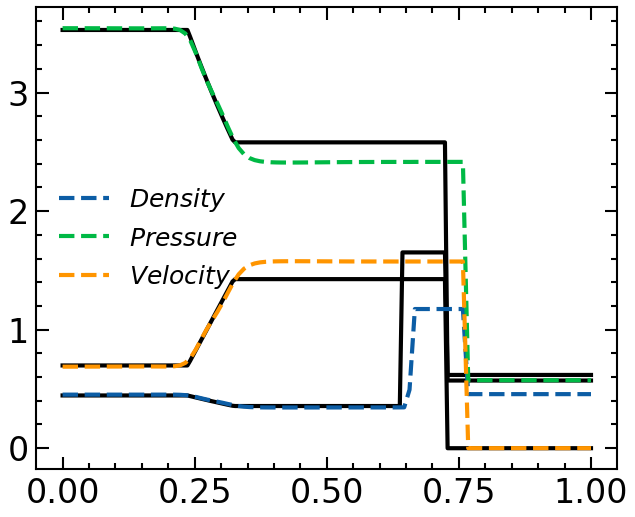

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-1.2529,  0.1805],
        [ 0.2619,  1.3342]], device='cuda:0', dtype=torch.float64) and tensor([[9.9774e-01, 9.8881e-04],
        [3.4107e-03, 1.0016e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0157]], device='cuda:0', dtype=torch.float64),tensor([[1.0047]], device='cuda:0', dtype=torch.float64),tensor([[0.9958]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 10000 | Loss: 0.027996


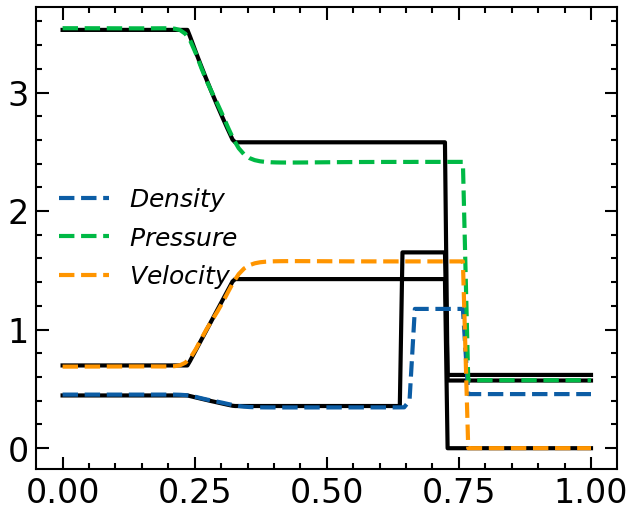

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.3144, -1.1206],
        [ 0.2235,  0.1043]], device='cuda:0', dtype=torch.float64) and tensor([[9.9740e-01, 9.7376e-04],
        [3.6784e-03, 1.0016e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0172]], device='cuda:0', dtype=torch.float64),tensor([[1.0049]], device='cuda:0', dtype=torch.float64),tensor([[0.9951]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 11000 | Loss: 0.027699


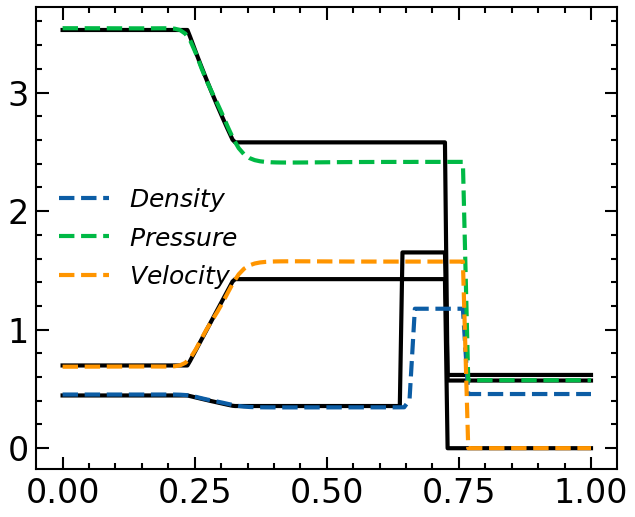

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.2237,  0.7103],
        [ 0.1440, -0.7045]], device='cuda:0', dtype=torch.float64) and tensor([[0.9961, 0.0010],
        [0.0038, 1.0017]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0198]], device='cuda:0', dtype=torch.float64),tensor([[1.0050]], device='cuda:0', dtype=torch.float64),tensor([[0.9936]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 12000 | Loss: 0.027370


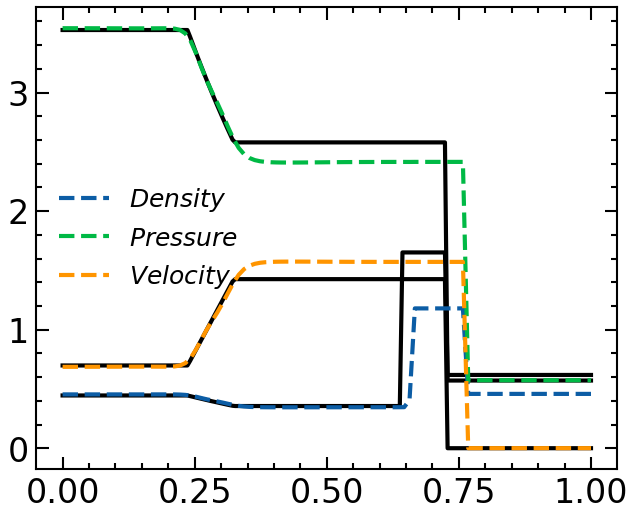

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.5650, -2.1550],
        [ 0.8884,  0.3567]], device='cuda:0', dtype=torch.float64) and tensor([[9.9539e-01, 8.7081e-04],
        [4.0976e-03, 1.0021e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0279]], device='cuda:0', dtype=torch.float64),tensor([[1.0081]], device='cuda:0', dtype=torch.float64),tensor([[0.9922]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 13000 | Loss: 0.028906


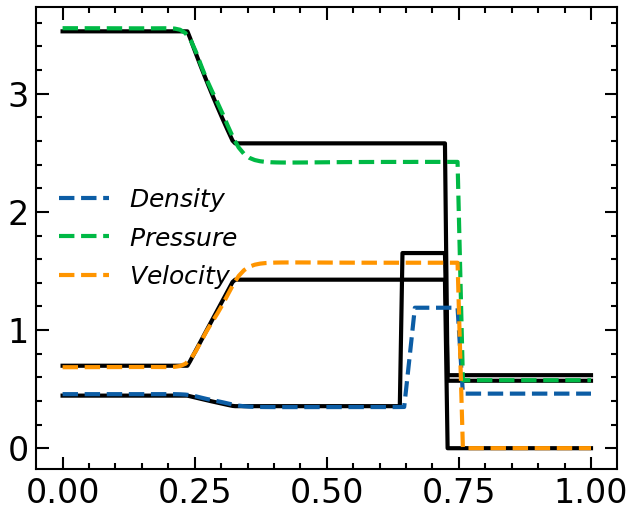

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 1.7712, -1.4134],
        [-0.3532, -1.1221]], device='cuda:0', dtype=torch.float64) and tensor([[9.9521e-01, 9.0783e-04],
        [3.7065e-03, 1.0021e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0266]], device='cuda:0', dtype=torch.float64),tensor([[1.0084]], device='cuda:0', dtype=torch.float64),tensor([[0.9922]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 14000 | Loss: 0.028964


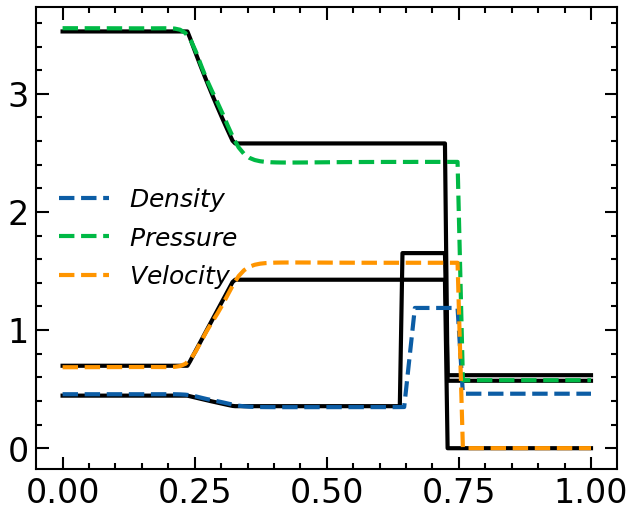

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 1.1565,  2.9234],
        [-0.5921, -1.7383]], device='cuda:0', dtype=torch.float64) and tensor([[9.9482e-01, 9.8849e-04],
        [3.7416e-03, 1.0022e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0272]], device='cuda:0', dtype=torch.float64),tensor([[1.0081]], device='cuda:0', dtype=torch.float64),tensor([[0.9918]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 15000 | Loss: 0.029177


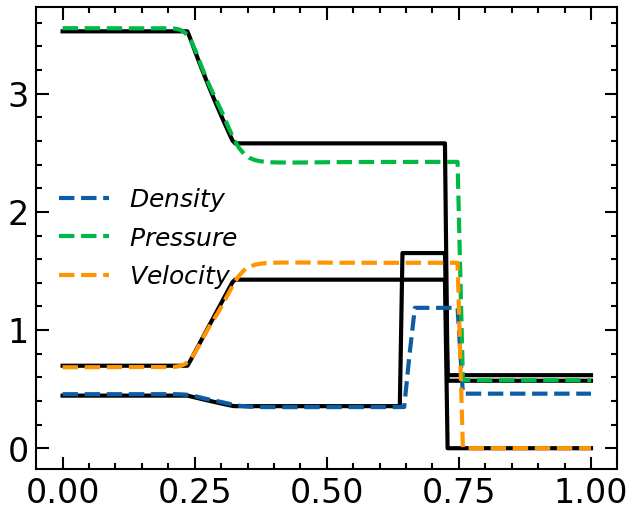

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0289,  1.3908],
        [ 0.0473, -0.4159]], device='cuda:0', dtype=torch.float64) and tensor([[0.9945, 0.0013],
        [0.0047, 1.0024]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0283]], device='cuda:0', dtype=torch.float64),tensor([[1.0082]], device='cuda:0', dtype=torch.float64),tensor([[0.9912]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 16000 | Loss: 0.028302


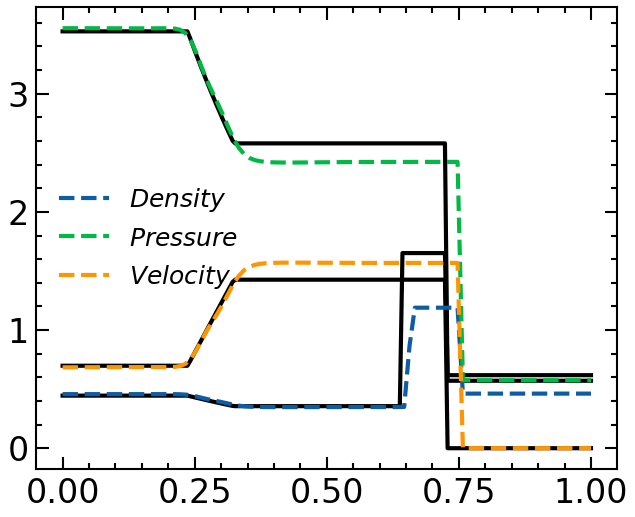

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-4.9097e-01,  1.1207e+00],
        [ 3.9647e-04,  3.2872e-01]], device='cuda:0', dtype=torch.float64) and tensor([[0.9945, 0.0015],
        [0.0053, 1.0025]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0282]], device='cuda:0', dtype=torch.float64),tensor([[1.0081]], device='cuda:0', dtype=torch.float64),tensor([[0.9911]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 17000 | Loss: 0.028179


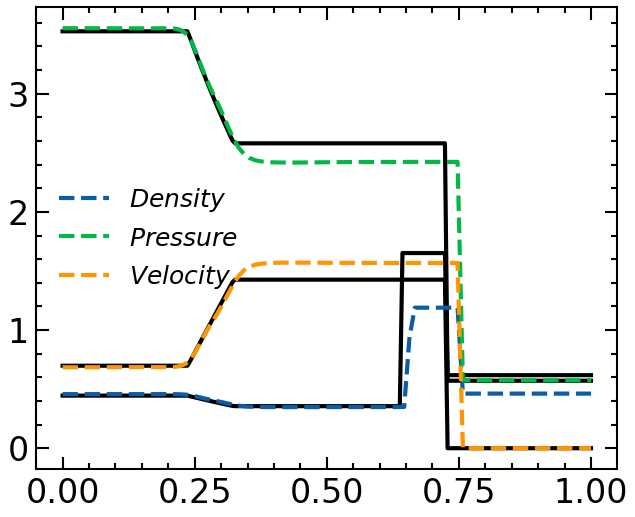

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.5627,  1.0478],
        [-0.1140, -0.5247]], device='cuda:0', dtype=torch.float64) and tensor([[0.9945, 0.0015],
        [0.0053, 1.0025]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0284]], device='cuda:0', dtype=torch.float64),tensor([[1.0080]], device='cuda:0', dtype=torch.float64),tensor([[0.9910]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 18000 | Loss: 0.028349


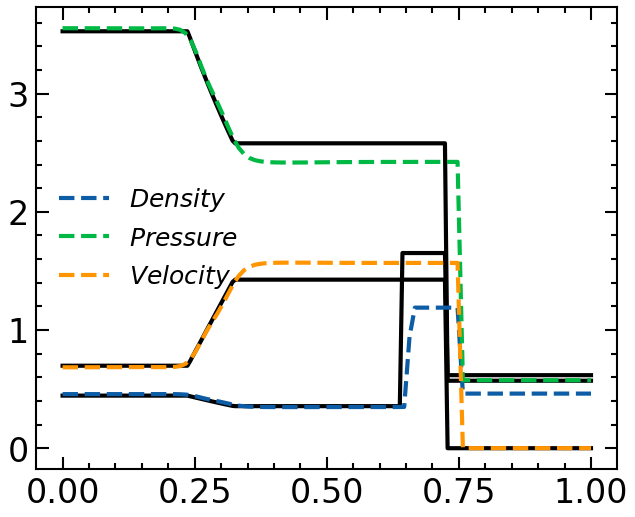

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.2080,  1.2436],
        [-0.0789,  0.0491]], device='cuda:0', dtype=torch.float64) and tensor([[0.9945, 0.0015],
        [0.0054, 1.0025]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0287]], device='cuda:0', dtype=torch.float64),tensor([[1.0078]], device='cuda:0', dtype=torch.float64),tensor([[0.9908]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 19000 | Loss: 0.028218


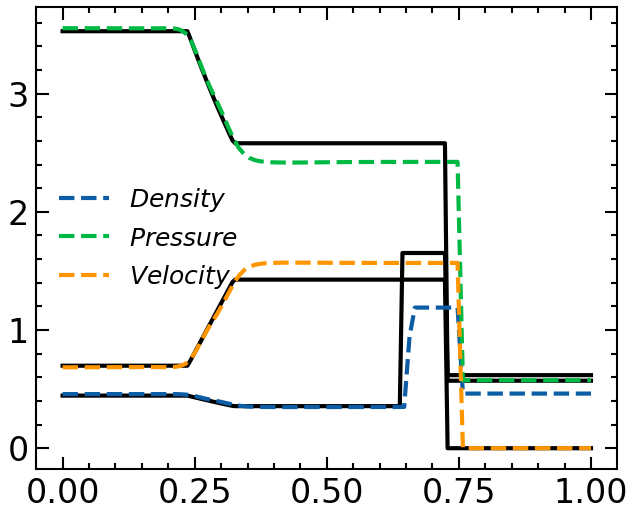

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[0.9943, 0.0015],
        [0.0055, 1.0025]], device='cuda:0', dtype=torch.float64) and tensor([[1.0296]], device='cuda:0', dtype=torch.float64),tensor([[1.0078]], device='cuda:0', dtype=torch.float64),tensor([[0.9906]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 20000 | Loss: 0.028117 (TGPT_PINN2 Step Criteria Met)



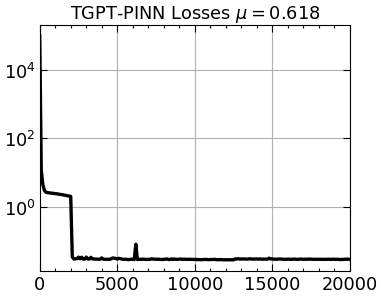

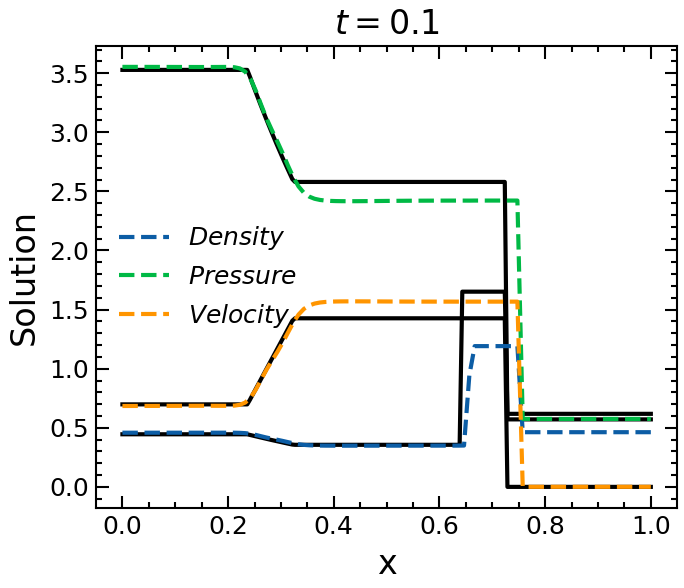

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]: tensor([[1., 0.],
        [0., 1.]], device='cuda:0', dtype=torch.float64) and tensor([[0.5000, 0.5000]], device='cuda:0', dtype=torch.float64),tensor([[0.5000, 0.5000]], device='cuda:0', dtype=torch.float64),tensor([[0.5000, 0.5000]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]: Loss: 56099.779267
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]: Epoch: 0 | Loss: 56099.77926710776
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 500 | Loss: 21.018987
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 1000 | Loss: 19.239395
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 1500 | Loss: 17.840291
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 2000 | Loss: 16.838765
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 9.9984e-01, -1.9001e-04],
        [ 1.6368e-04,  1.0002e+00]], device='cuda:0', dtype=torch.float64) and tensor([[0.5000, 0.5000]], device='cuda:0', dtype=torch.float64),tensor([[0.5000, 0.5000]], device='cuda:0'

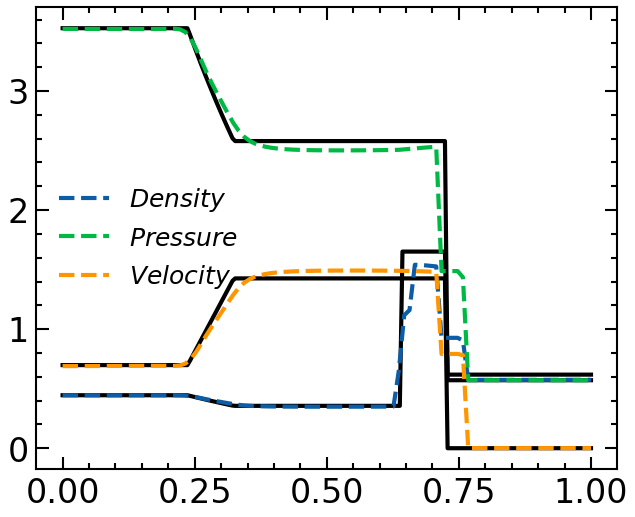

Step 2 Training Begin...
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ -2.0605, -24.5780],
        [ -8.3807,  32.0668]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0003e+00, -6.4242e-04],
        [ 5.6913e-03,  9.9930e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[0.9265, 0.0238]], device='cuda:0', dtype=torch.float64),tensor([[0.7121, 0.2585]], device='cuda:0', dtype=torch.float64),tensor([[0.7112, 0.3220]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 3000 | Loss: 0.640601


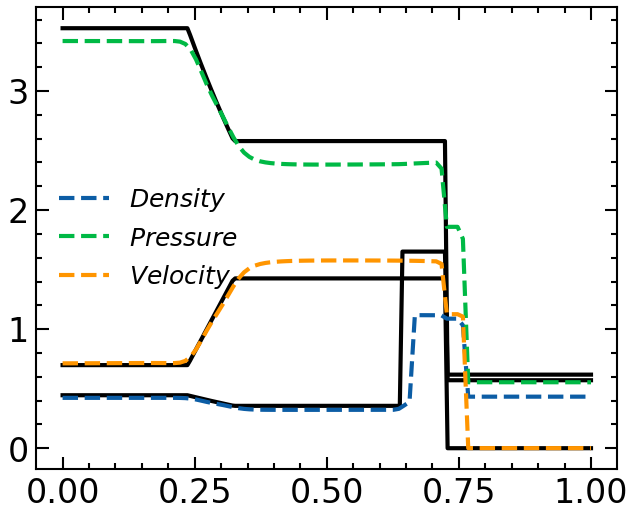

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ -0.3175, -18.7470],
        [  2.6911,   9.5243]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0022e+00, -6.3952e-04],
        [ 8.9656e-03,  9.9876e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0002, 0.0066]], device='cuda:0', dtype=torch.float64),tensor([[0.9225, 0.0798]], device='cuda:0', dtype=torch.float64),tensor([[0.9185, 0.0890]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 4000 | Loss: 0.057108


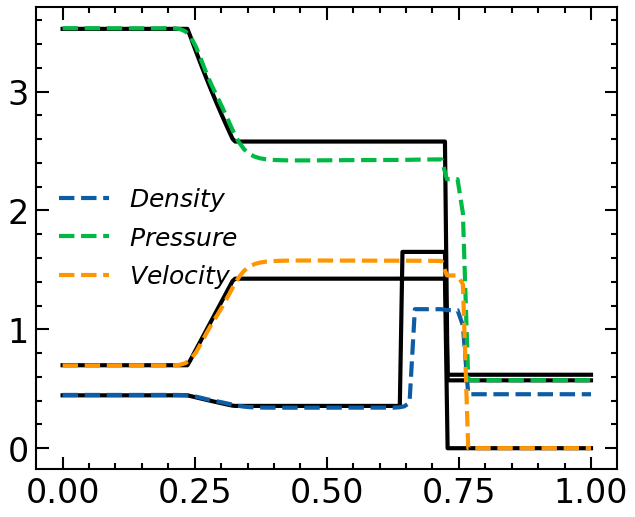

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.6393,  3.6089],
        [-1.6246, -0.7171]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9844e-01, -5.2763e-04],
        [ 4.8813e-03,  9.9960e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[0.9992, 0.0102]], device='cuda:0', dtype=torch.float64),tensor([[0.9636, 0.0396]], device='cuda:0', dtype=torch.float64),tensor([[0.9612, 0.0389]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 5000 | Loss: 0.040121


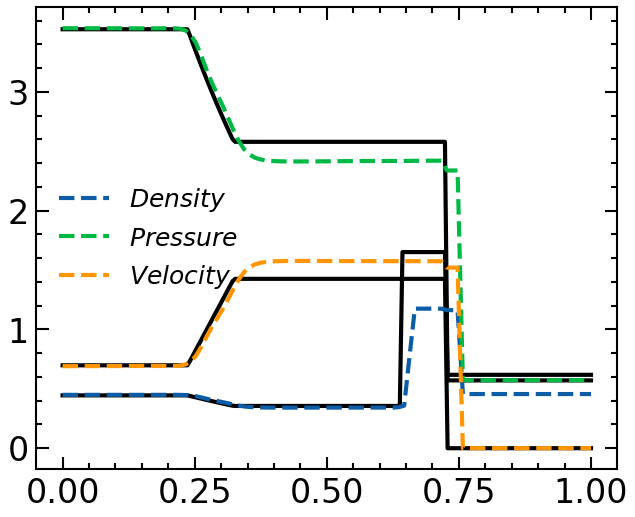

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.7071, -2.3225],
        [ 0.3358, -0.6575]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9673e-01, -3.0083e-04],
        [ 5.4647e-03,  1.0002e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0140, 0.0069]], device='cuda:0', dtype=torch.float64),tensor([[0.9707, 0.0343]], device='cuda:0', dtype=torch.float64),tensor([[0.9608, 0.0367]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 6000 | Loss: 0.031616


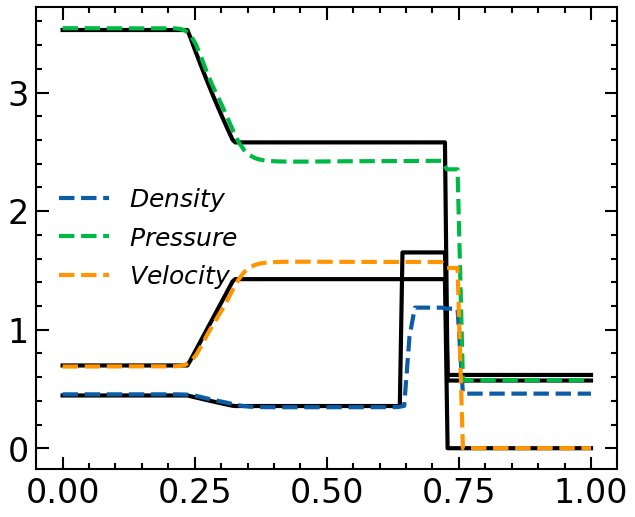

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0127,  5.6932],
        [ 0.6081, -4.0672]], device='cuda:0', dtype=torch.float64) and tensor([[9.9573e-01, 4.7835e-05],
        [1.4856e-03, 1.0010e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0191, 0.0023]], device='cuda:0', dtype=torch.float64),tensor([[0.9999, 0.0069]], device='cuda:0', dtype=torch.float64),tensor([[0.9874, 0.0076]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 7000 | Loss: 0.032777


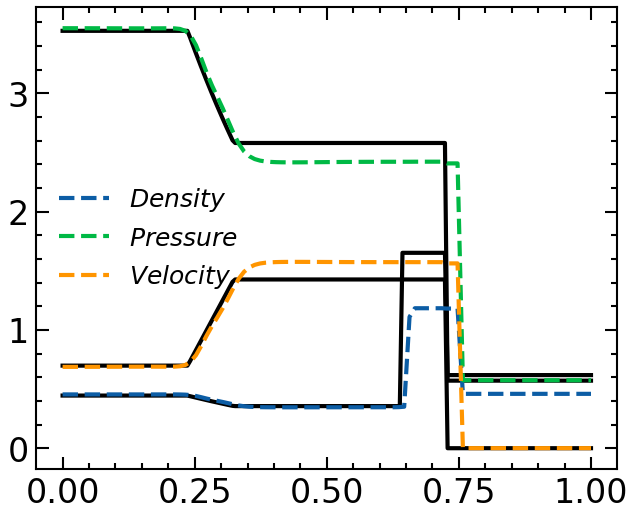

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 5.5549,  6.2421],
        [-2.9702, -5.3332]], device='cuda:0', dtype=torch.float64) and tensor([[9.9328e-01, 2.5121e-04],
        [1.0470e-03, 1.0013e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0242, 0.0020]], device='cuda:0', dtype=torch.float64),tensor([[1.0042, 0.0024]], device='cuda:0', dtype=torch.float64),tensor([[0.9891, 0.0030]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 8000 | Loss: 0.028639


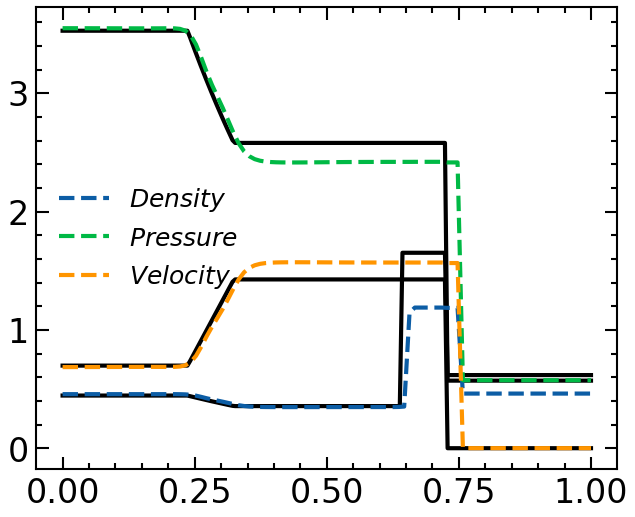

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0082, -0.4249],
        [ 0.1760,  0.0975]], device='cuda:0', dtype=torch.float64) and tensor([[9.9032e-01, 7.4527e-04],
        [2.7718e-03, 1.0025e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0341, 0.0011]], device='cuda:0', dtype=torch.float64),tensor([[1.0064e+00, 4.7952e-04]], device='cuda:0', dtype=torch.float64),tensor([[9.8637e-01, 7.8192e-04]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 9000 | Loss: 0.026078


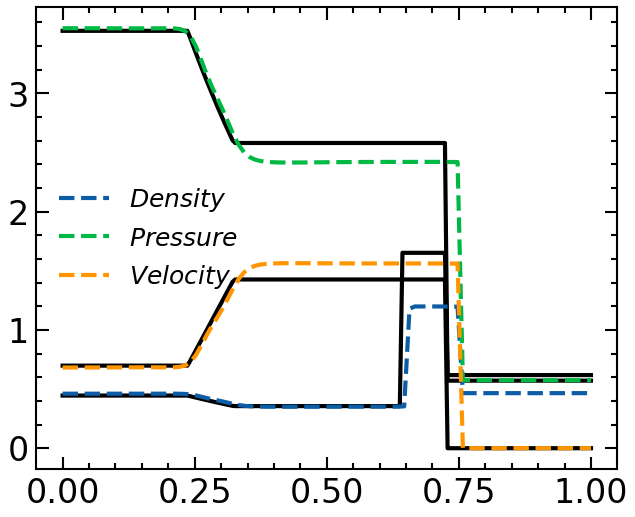

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 2.2924,  2.8665],
        [-1.2168, -2.1420]], device='cuda:0', dtype=torch.float64) and tensor([[9.8706e-01, 9.0828e-04],
        [3.5398e-03, 1.0045e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0448, 0.0018]], device='cuda:0', dtype=torch.float64),tensor([[1.0034, 0.0028]], device='cuda:0', dtype=torch.float64),tensor([[0.9787, 0.0036]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 10000 | Loss: 0.024946


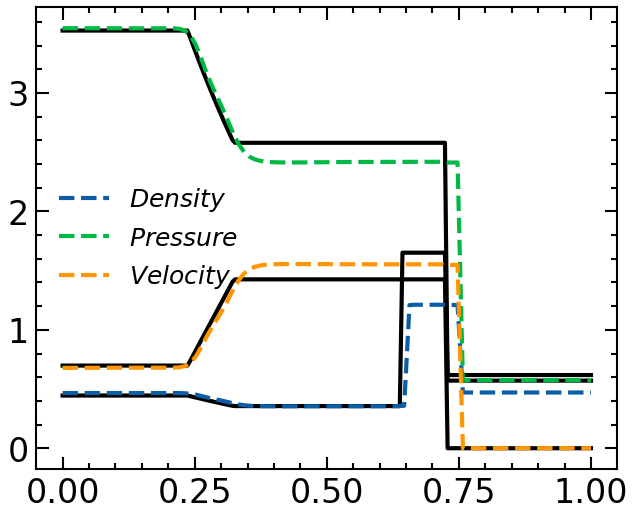

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.7282, -2.4243],
        [ 0.2216, -0.1741]], device='cuda:0', dtype=torch.float64) and tensor([[9.8497e-01, 9.9792e-04],
        [4.5002e-03, 1.0064e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0521, 0.0030]], device='cuda:0', dtype=torch.float64),tensor([[1.0003, 0.0058]], device='cuda:0', dtype=torch.float64),tensor([[0.9718, 0.0064]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 11000 | Loss: 0.024546


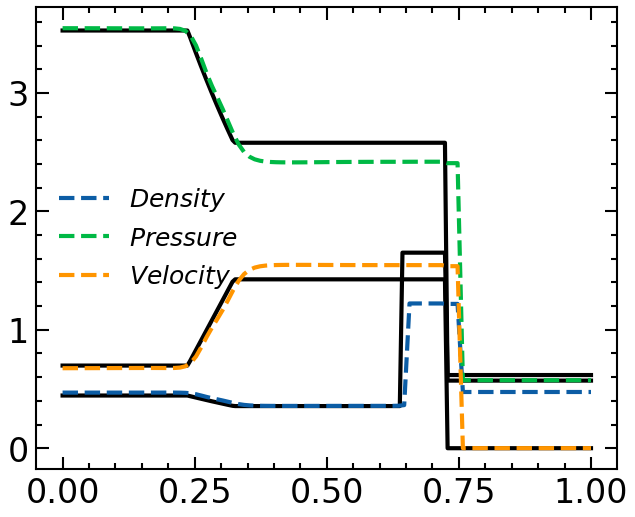

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[  8.3598,  14.4334],
        [ -3.6912, -10.5312]], device='cuda:0', dtype=torch.float64) and tensor([[9.8451e-01, 9.7581e-04],
        [4.5261e-03, 1.0064e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0527, 0.0031]], device='cuda:0', dtype=torch.float64),tensor([[0.9996, 0.0063]], device='cuda:0', dtype=torch.float64),tensor([[0.9703, 0.0073]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 12000 | Loss: 0.026769


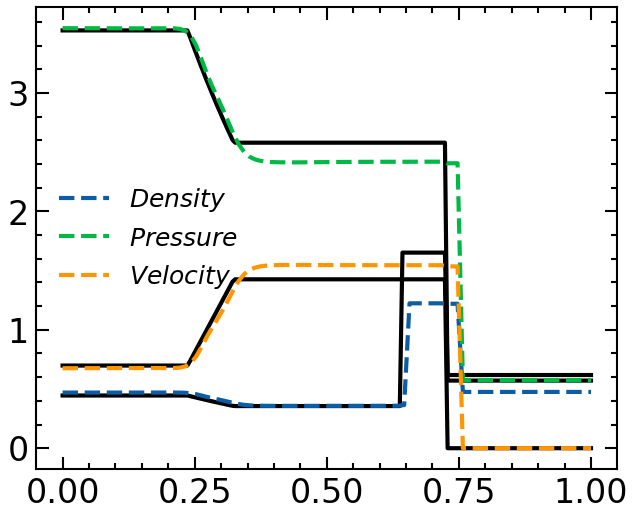

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-1.6164, -3.3000],
        [ 0.5405,  2.9930]], device='cuda:0', dtype=torch.float64) and tensor([[9.8312e-01, 9.5828e-04],
        [4.2268e-03, 1.0064e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0560, 0.0027]], device='cuda:0', dtype=torch.float64),tensor([[1.0003, 0.0056]], device='cuda:0', dtype=torch.float64),tensor([[0.9702, 0.0063]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 13000 | Loss: 0.025021


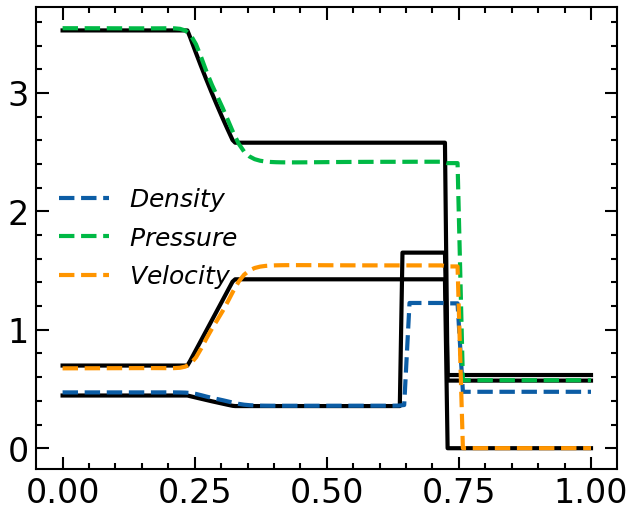

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ -2.4611, -26.8559],
        [  1.0660,   9.8039]], device='cuda:0', dtype=torch.float64) and tensor([[0.9817, 0.0011],
        [0.0037, 1.0063]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 1.0603e+00, -1.1095e-05]], device='cuda:0', dtype=torch.float64),tensor([[ 1.0087, -0.0030]], device='cuda:0', dtype=torch.float64),tensor([[ 0.9774, -0.0028]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 14000 | Loss: 0.024826


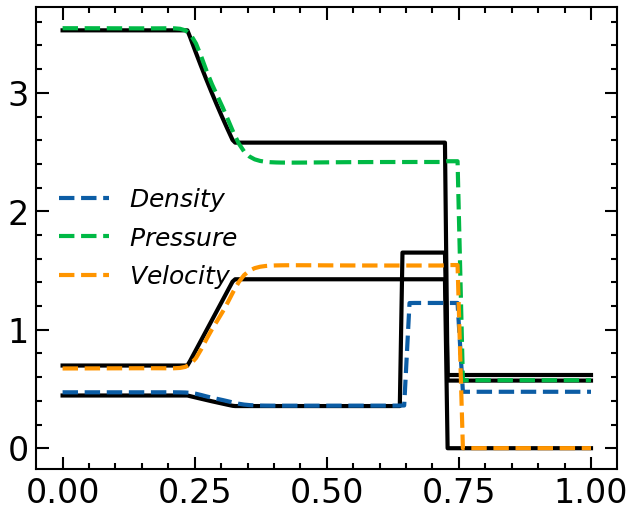

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 2.0801, 26.6137],
        [-1.2348, -8.6531]], device='cuda:0', dtype=torch.float64) and tensor([[0.9817, 0.0011],
        [0.0037, 1.0063]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0594, 0.0012]], device='cuda:0', dtype=torch.float64),tensor([[1.0051e+00, 4.9793e-04]], device='cuda:0', dtype=torch.float64),tensor([[0.9741, 0.0014]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 15000 | Loss: 0.032051


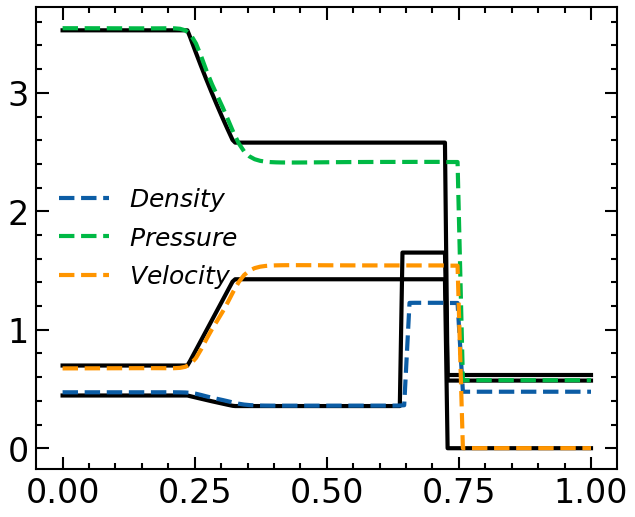

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.4567,  0.0226],
        [-0.0638, -0.3238]], device='cuda:0', dtype=torch.float64) and tensor([[0.9816, 0.0011],
        [0.0037, 1.0063]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0590e+00, 1.0013e-03]], device='cuda:0', dtype=torch.float64),tensor([[1.0048e+00, 8.5282e-04]], device='cuda:0', dtype=torch.float64),tensor([[0.9730, 0.0018]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 16000 | Loss: 0.023104


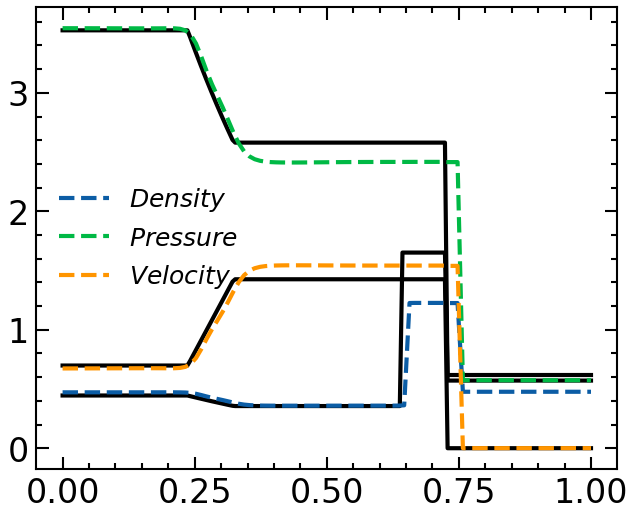

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[  -8.7759, -241.6617],
        [   2.3501,   97.2684]], device='cuda:0', dtype=torch.float64) and tensor([[0.9818, 0.0015],
        [0.0036, 1.0059]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 1.0581e+00, -6.6575e-04]], device='cuda:0', dtype=torch.float64),tensor([[ 1.0065, -0.0013]], device='cuda:0', dtype=torch.float64),tensor([[ 9.7583e-01, -4.4088e-05]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 17000 | Loss: 0.025126


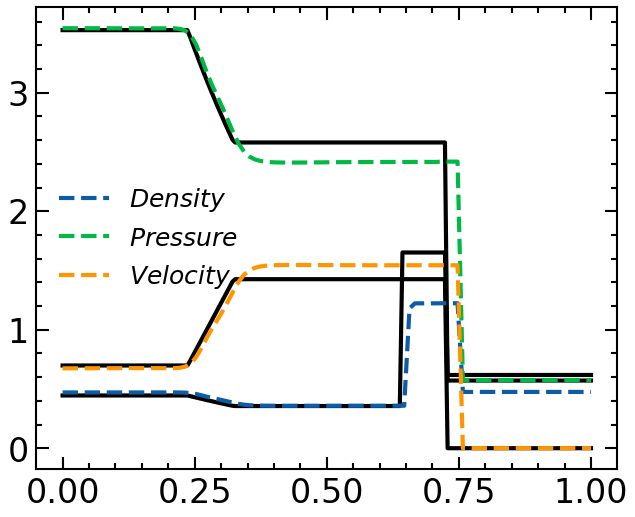

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ -2.3324, -11.0551],
        [  0.1325,   5.7296]], device='cuda:0', dtype=torch.float64) and tensor([[0.9815, 0.0015],
        [0.0040, 1.0059]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 1.0601e+00, -4.5227e-04]], device='cuda:0', dtype=torch.float64),tensor([[ 1.0073, -0.0014]], device='cuda:0', dtype=torch.float64),tensor([[9.7540e-01, 1.3760e-06]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 18000 | Loss: 0.024941


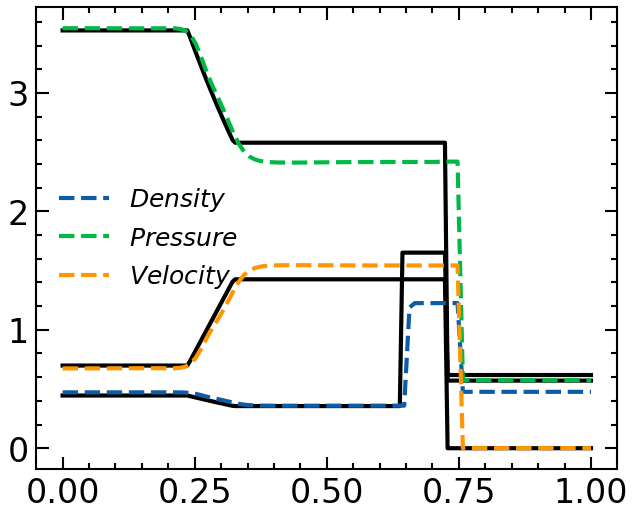

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 2.8911, -7.4788],
        [-1.5306,  1.2129]], device='cuda:0', dtype=torch.float64) and tensor([[0.9816, 0.0015],
        [0.0041, 1.0059]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 1.0603e+00, -4.6676e-04]], device='cuda:0', dtype=torch.float64),tensor([[ 1.0071, -0.0011]], device='cuda:0', dtype=torch.float64),tensor([[ 9.7536e-01, -8.2355e-05]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 19000 | Loss: 0.024475


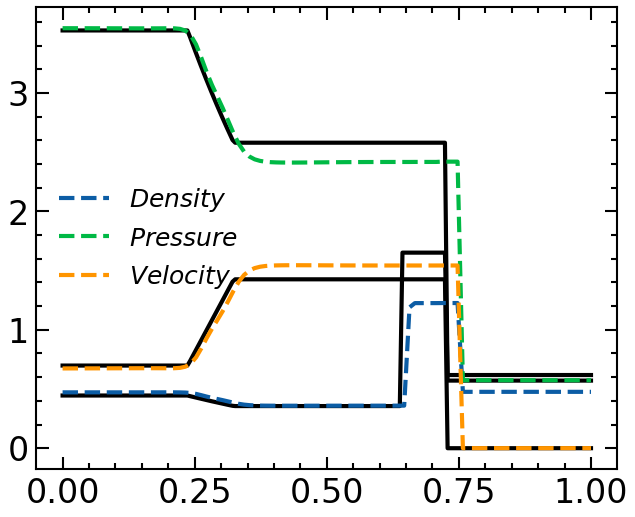

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[0.9816, 0.0017],
        [0.0051, 1.0057]], device='cuda:0', dtype=torch.float64) and tensor([[1.0581, 0.0017]], device='cuda:0', dtype=torch.float64),tensor([[1.0003, 0.0057]], device='cuda:0', dtype=torch.float64),tensor([[0.9679, 0.0084]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 20000 | Loss: 0.024376 (TGPT_PINN2 Step Criteria Met)



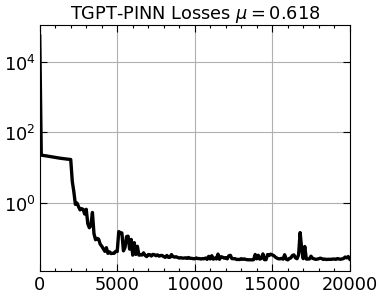

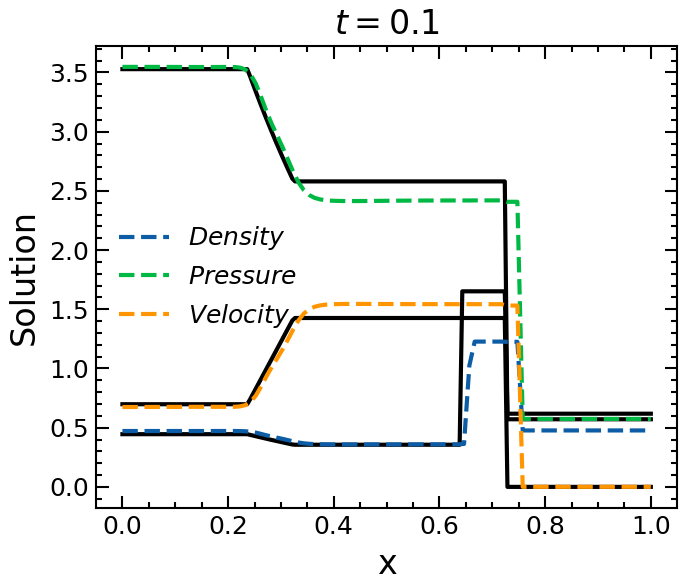

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]: tensor([[1., 0.],
        [0., 1.]], device='cuda:0', dtype=torch.float64) and tensor([[0.3333, 0.3333, 0.3333]], device='cuda:0', dtype=torch.float64),tensor([[0.3333, 0.3333, 0.3333]], device='cuda:0', dtype=torch.float64),tensor([[0.3333, 0.3333, 0.3333]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]: Loss: 26744.713043
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]: Epoch: 0 | Loss: 26744.713043447646
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 500 | Loss: 15.380204
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 1000 | Loss: 13.593569
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 1500 | Loss: 12.366270
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 2000 | Loss: 11.522328
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 9.9988e-01, -1.4731e-04],
        [ 1.2447e-04,  1.0002e+00]], device='cuda:0', dtype=torch.float64) and tensor([[0.3333, 0.3333, 0.3333]], device='cuda:0', dtype=torch.float64),tensor([[

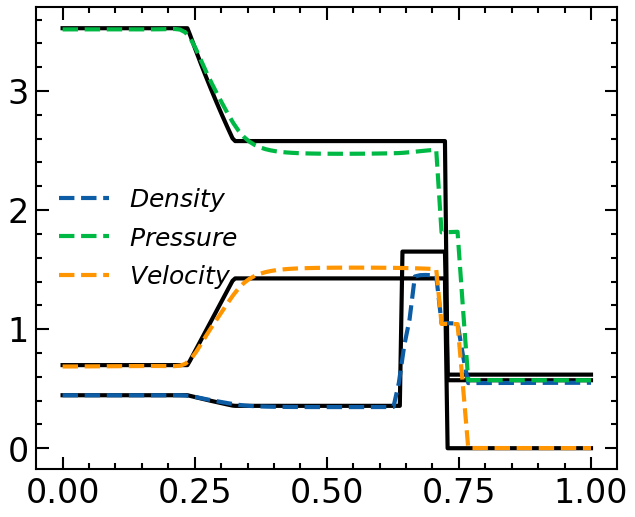

Step 2 Training Begin...
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[  1.9600, -12.1334],
        [ -2.2943, -27.7270]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9922e-01, -2.0429e-04],
        [ 1.5362e-03,  1.0003e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[0.4460, 0.0025, 0.5455]], device='cuda:0', dtype=torch.float64),tensor([[0.3972, 0.0774, 0.5185]], device='cuda:0', dtype=torch.float64),tensor([[0.3821, 0.1161, 0.5184]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 3000 | Loss: 0.173568


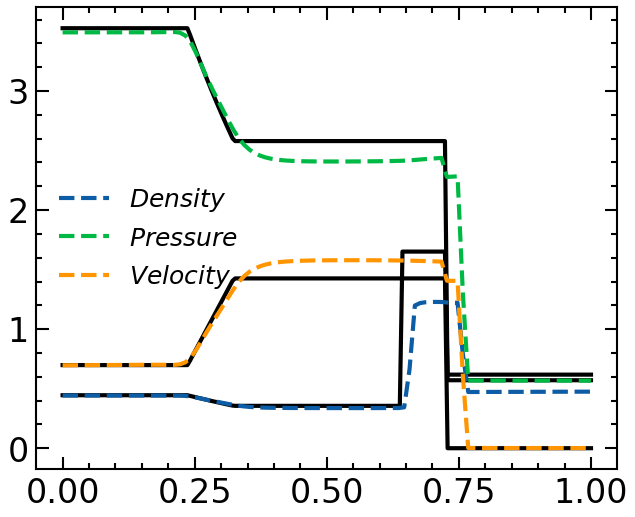

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 11.1698, 117.3325],
        [ -3.5935, -54.3258]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9823e-01, -7.8826e-05],
        [ 3.1717e-03,  1.0011e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.4223, -0.0023,  0.5892]], device='cuda:0', dtype=torch.float64),tensor([[0.3787, 0.0152, 0.6058]], device='cuda:0', dtype=torch.float64),tensor([[0.3608, 0.0344, 0.6110]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 4000 | Loss: 0.038184


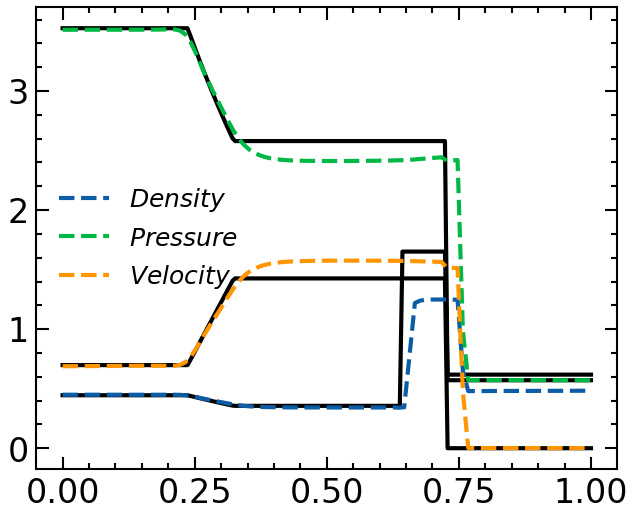

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 9.2677, 15.9939],
        [-4.2457, -8.8979]], device='cuda:0', dtype=torch.float64) and tensor([[9.9850e-01, 5.6659e-05],
        [5.0112e-03, 1.0013e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.3611, -0.0038,  0.6529]], device='cuda:0', dtype=torch.float64),tensor([[0.3194, 0.0020, 0.6803]], device='cuda:0', dtype=torch.float64),tensor([[0.3054, 0.0195, 0.6794]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 5000 | Loss: 0.122732


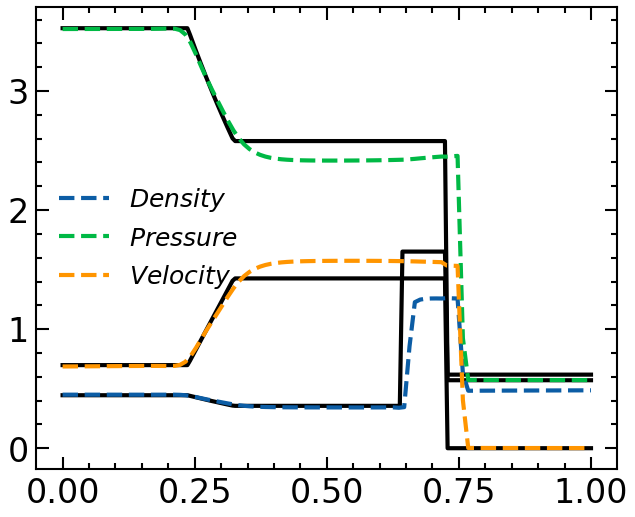

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.9341, 27.3721],
        [-0.0924,  9.2562]], device='cuda:0', dtype=torch.float64) and tensor([[9.9846e-01, 8.6252e-05],
        [7.4327e-03, 1.0014e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.2586, -0.0044,  0.7530]], device='cuda:0', dtype=torch.float64),tensor([[ 2.5327e-01, -5.0585e-04,  7.5087e-01]], device='cuda:0',
       dtype=torch.float64),tensor([[0.2399, 0.0133, 0.7504]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 6000 | Loss: 0.087996


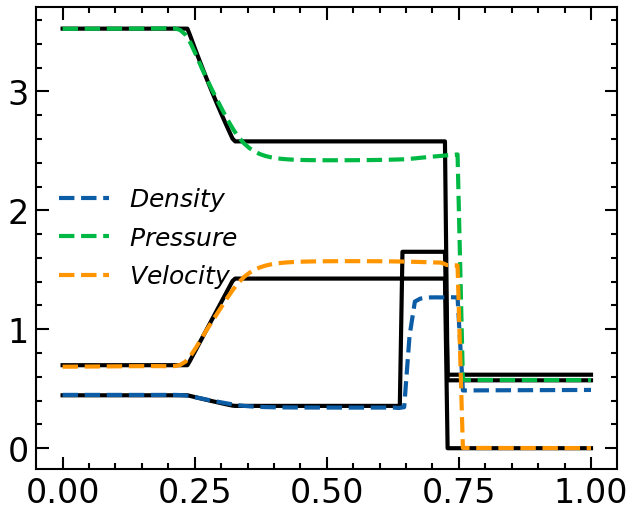

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.5022, -7.0273],
        [-0.2869, -1.9214]], device='cuda:0', dtype=torch.float64) and tensor([[9.9887e-01, 1.6563e-05],
        [1.0750e-02, 1.0013e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.1683, -0.0049,  0.8424]], device='cuda:0', dtype=torch.float64),tensor([[1.8136e-01, 6.5216e-05, 8.2277e-01]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1698, 0.0102, 0.8239]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 7000 | Loss: 0.029430


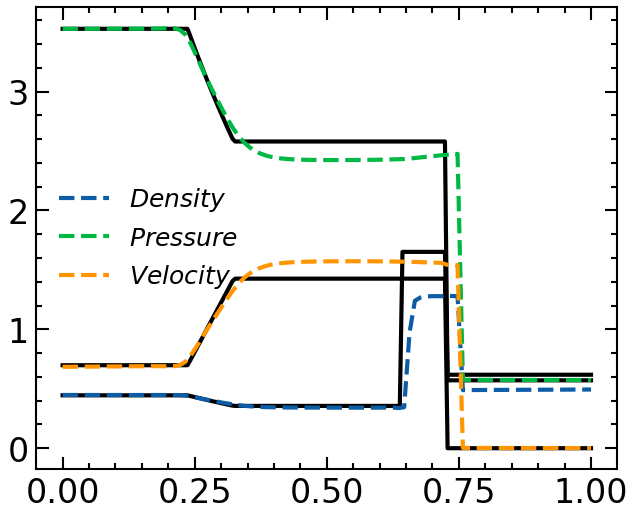

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-7.3152e-02, -2.6010e+00],
        [-1.4543e-03, -8.7459e-01]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0004e+00, -1.8973e-05],
        [ 1.5530e-02,  1.0009e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.1001, -0.0032,  0.9062]], device='cuda:0', dtype=torch.float64),tensor([[ 1.1187e-01, -8.0069e-05,  8.9346e-01]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1038, 0.0053, 0.8940]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 8000 | Loss: 0.028551


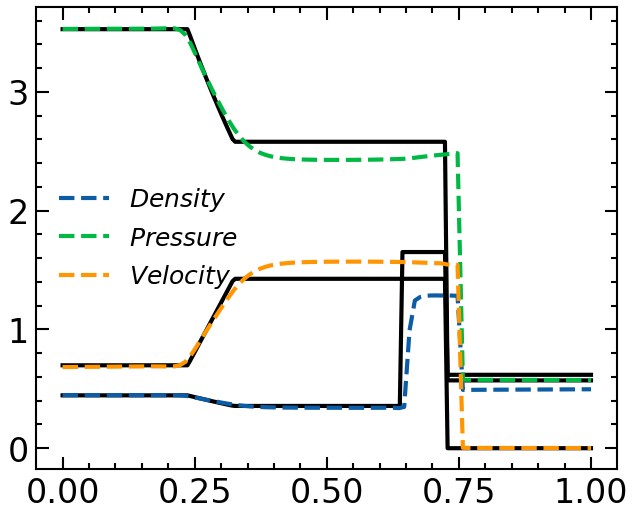

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.1712,  0.2446],
        [ 0.0295,  0.4977]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0021e+00, -7.1518e-05],
        [ 2.0670e-02,  1.0006e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.0534, -0.0018,  0.9508]], device='cuda:0', dtype=torch.float64),tensor([[5.9942e-02, 8.6904e-04, 9.4505e-01]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0557, 0.0024, 0.9453]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 9000 | Loss: 0.026373


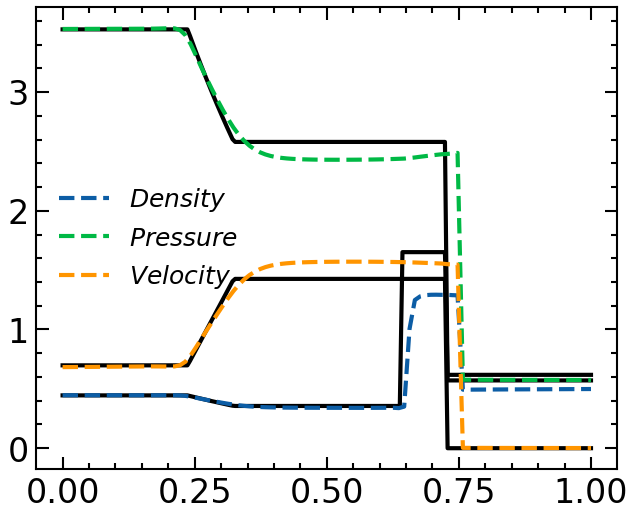

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0108, -0.1138],
        [ 0.0028, -0.0043]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0036e+00, -7.1905e-05],
        [ 2.5499e-02,  1.0004e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 2.9326e-02, -7.5687e-04,  9.7310e-01]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0328, 0.0016, 0.9714]], device='cuda:0', dtype=torch.float64),tensor([[0.0300, 0.0013, 0.9717]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 10000 | Loss: 0.017215


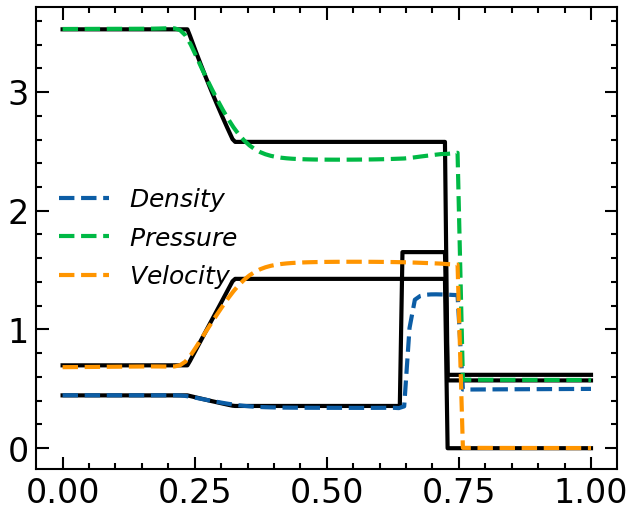

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0043, -0.0080],
        [ 0.0027, -0.0289]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0046e+00, -1.3800e-04],
        [ 2.7975e-02,  1.0005e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.1819e-02, 1.4877e-04, 9.8880e-01]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0112, 0.0030, 0.9914]], device='cuda:0', dtype=torch.float64),tensor([[0.0100, 0.0014, 0.9920]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 11000 | Loss: 0.019235


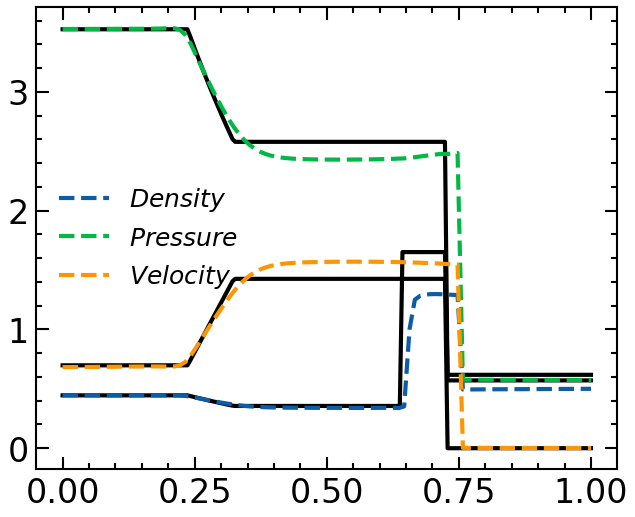

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.0016,  0.0006],
        [-0.0105, -0.0384]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0046e+00, -1.3990e-04],
        [ 2.7982e-02,  1.0005e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 1.7744e-02, -1.5182e-04,  9.8464e-01]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0174, 0.0024, 0.9860]], device='cuda:0', dtype=torch.float64),tensor([[1.5988e-02, 8.0213e-04, 9.8672e-01]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 12000 | Loss: 0.022898


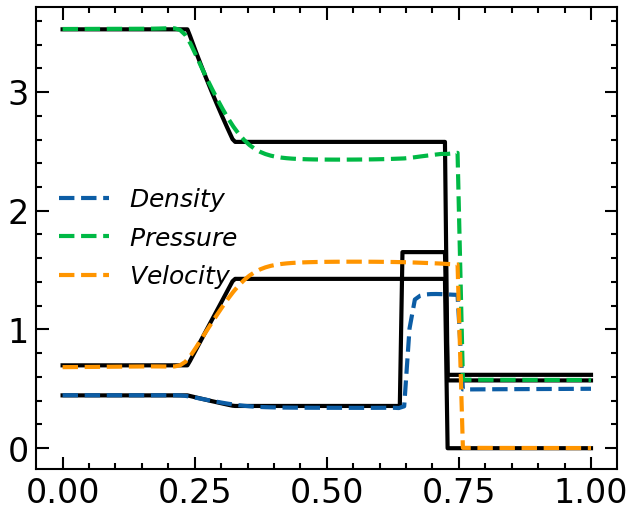

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.0145,  0.1901],
        [-0.0127,  0.0187]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0046e+00, -1.5109e-04],
        [ 2.8024e-02,  1.0005e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 2.0899e-02, -4.7150e-04,  9.8152e-01]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0213, 0.0020, 0.9826]], device='cuda:0', dtype=torch.float64),tensor([[1.9416e-02, 6.0653e-04, 9.8260e-01]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 13000 | Loss: 0.017737


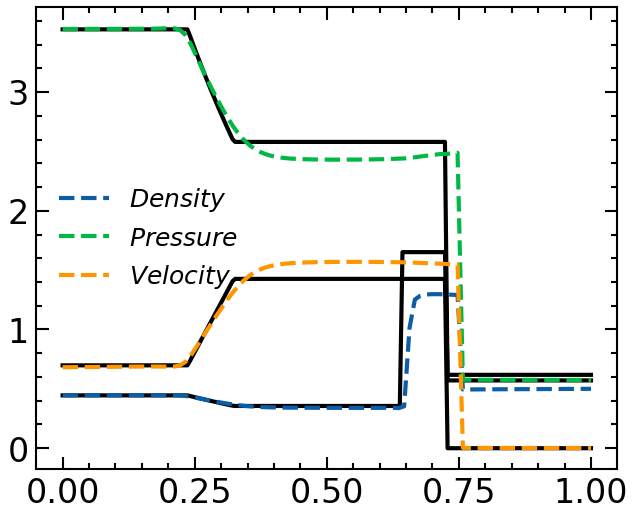

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0292, -0.0628],
        [ 0.0045,  0.0929]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0045e+00, -1.5440e-04],
        [ 2.8147e-02,  1.0005e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 2.2449e-02, -3.3589e-04,  9.8061e-01]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0226, 0.0016, 0.9813]], device='cuda:0', dtype=torch.float64),tensor([[2.0686e-02, 7.0291e-04, 9.8141e-01]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 14000 | Loss: 0.017514


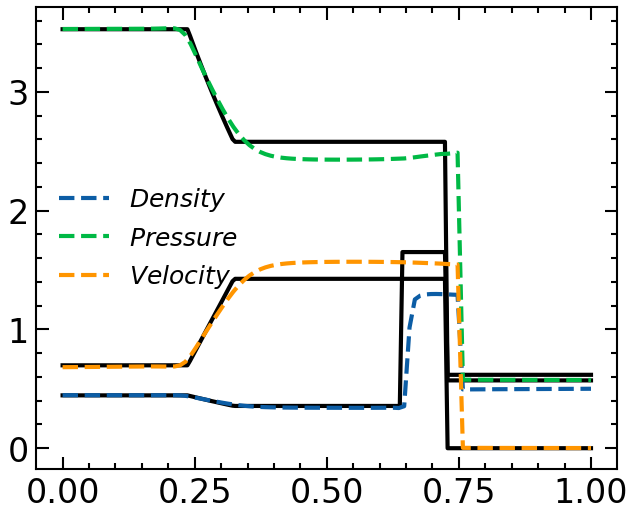

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.0207, -0.0282],
        [-0.0148,  0.0892]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0045e+00, -1.4530e-04],
        [ 2.8594e-02,  1.0005e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 2.2264e-02, -7.5133e-04,  9.8021e-01]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0231, 0.0019, 0.9813]], device='cuda:0', dtype=torch.float64),tensor([[2.0787e-02, 4.2204e-04, 9.8094e-01]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 15000 | Loss: 0.020865


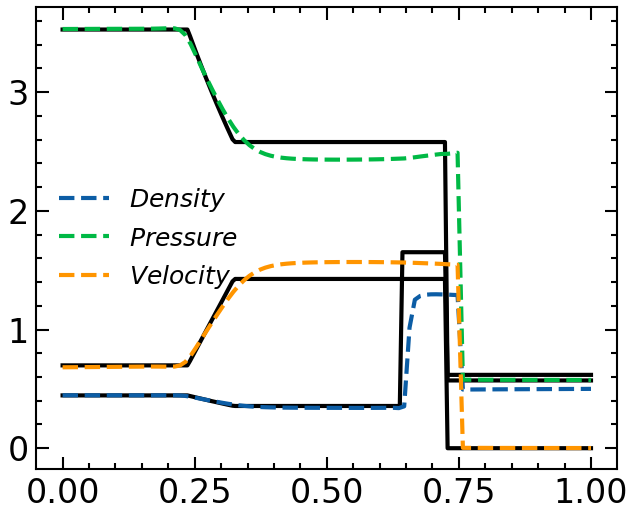

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.0888,  0.7344],
        [-0.0157, -0.1515]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0043e+00, -5.8987e-04],
        [ 3.0382e-02,  1.0009e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.0060, -0.0077,  1.0034]], device='cuda:0', dtype=torch.float64),tensor([[ 0.0078, -0.0107,  0.9989]], device='cuda:0', dtype=torch.float64),tensor([[0.0112, 0.0228, 0.9735]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 16000 | Loss: 0.045668


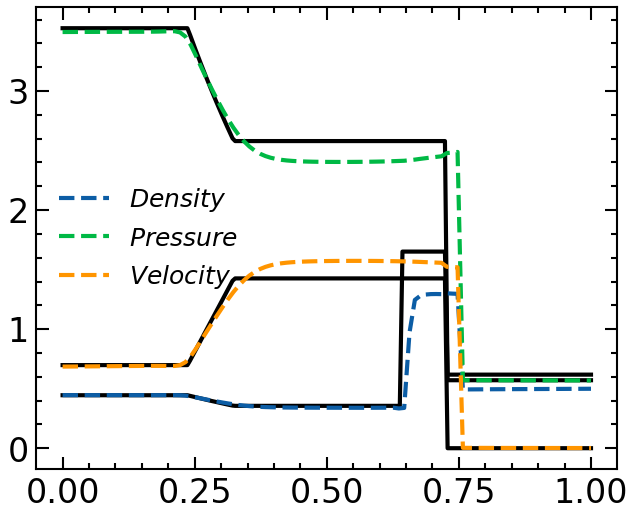

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0076, -0.5190],
        [ 0.0071, -0.1834]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0043e+00, -5.8479e-04],
        [ 3.0349e-02,  1.0009e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.9597e-02, 9.9783e-05, 9.8319e-01]], device='cuda:0',
       dtype=torch.float64),tensor([[2.1481e-02, 1.1332e-04, 9.8404e-01]], device='cuda:0',
       dtype=torch.float64),tensor([[1.9744e-02, 5.2621e-05, 9.8287e-01]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 17000 | Loss: 0.019339


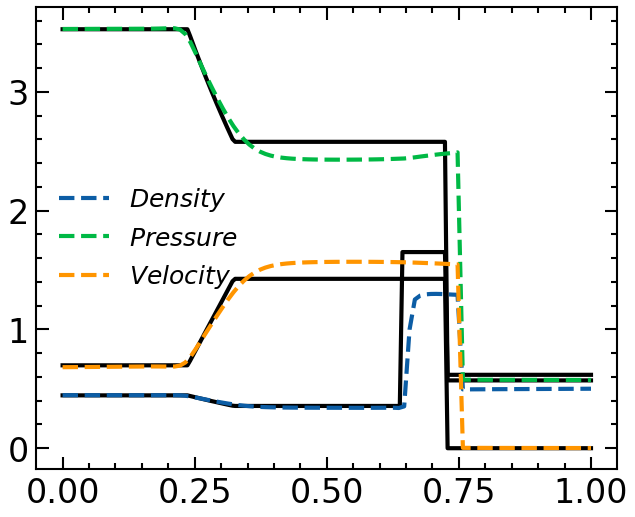

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0290,  0.2641],
        [ 0.0167, -0.2875]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0044e+00, -5.4460e-04],
        [ 3.0181e-02,  1.0010e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[2.2200e-02, 1.1866e-04, 9.8143e-01]], device='cuda:0',
       dtype=torch.float64),tensor([[2.6155e-02, 1.1766e-04, 9.7912e-01]], device='cuda:0',
       dtype=torch.float64),tensor([[2.3944e-02, 5.4087e-05, 9.7825e-01]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 18000 | Loss: 0.025543


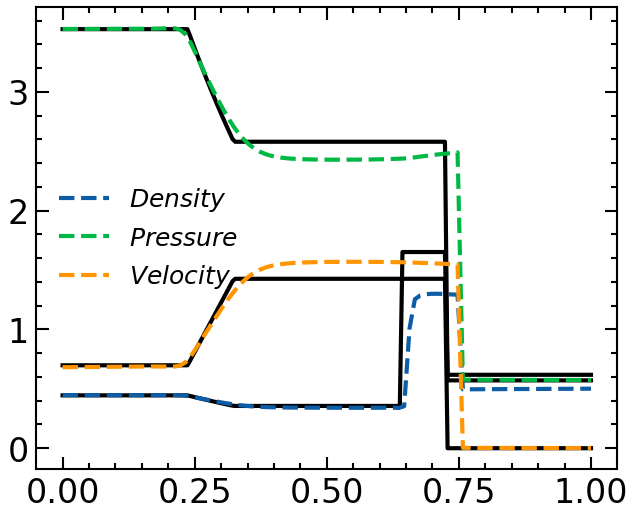

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.0561,  0.0076],
        [-0.0222,  0.3765]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0047e+00, -5.0689e-04],
        [ 2.9669e-02,  1.0010e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[2.2922e-02, 1.9733e-04, 9.8146e-01]], device='cuda:0',
       dtype=torch.float64),tensor([[2.8449e-02, 1.5633e-04, 9.7660e-01]], device='cuda:0',
       dtype=torch.float64),tensor([[2.5889e-02, 2.0399e-05, 9.7598e-01]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 19000 | Loss: 0.023417


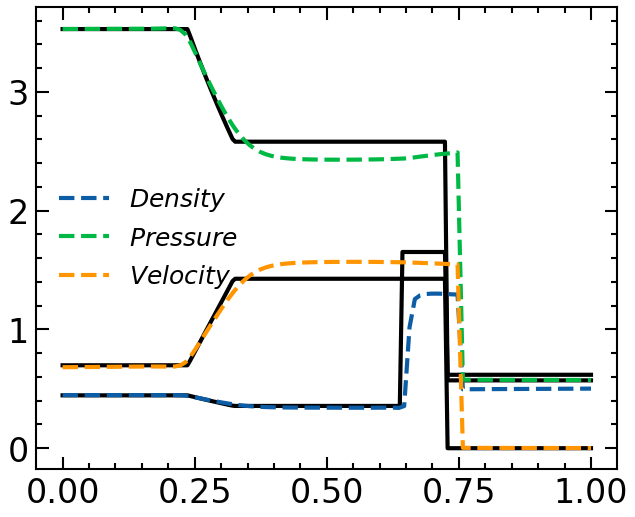

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 1.0047e+00, -7.7579e-04],
        [ 2.9371e-02,  1.0014e+00]], device='cuda:0', dtype=torch.float64) and tensor([[0.0065, 0.0038, 0.9900]], device='cuda:0', dtype=torch.float64),tensor([[0.0186, 0.0029, 0.9824]], device='cuda:0', dtype=torch.float64),tensor([[0.0169, 0.0018, 0.9848]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 20000 | Loss: 0.745390 (TGPT_PINN2 Step Criteria Met)



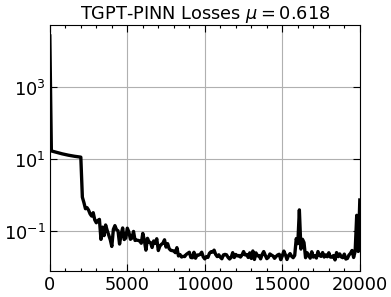

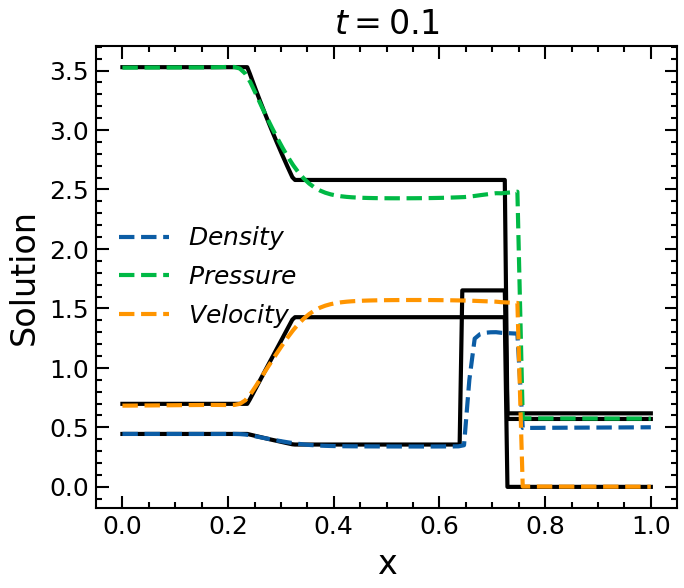

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]: tensor([[1., 0.],
        [0., 1.]], device='cuda:0', dtype=torch.float64) and tensor([[0.2500, 0.2500, 0.2500, 0.2500]], device='cuda:0',
       dtype=torch.float64),tensor([[0.2500, 0.2500, 0.2500, 0.2500]], device='cuda:0',
       dtype=torch.float64),tensor([[0.2500, 0.2500, 0.2500, 0.2500]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]: Loss: 20395.394637
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]: Epoch: 0 | Loss: 20395.394637025154
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 500 | Loss: 1443.675663
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 1000 | Loss: 1441.531739
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 1500 | Loss: 1439.500483
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 2000 | Loss: 1437.698739
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 9.9989e-01, -1.4149e-04],
        [ 1.1085e-04,  1.0001e+00]], device='cuda:0', dtype=torch.float64) and tensor([[0.2500, 0.2500, 0.25

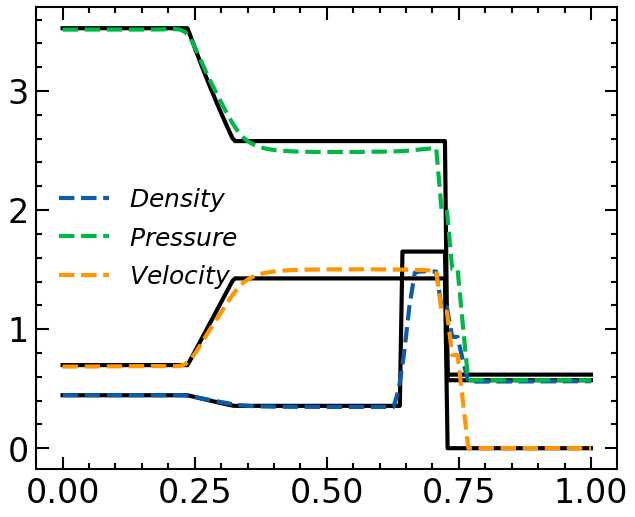

Step 2 Training Begin...
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[  1.1333,  -2.1391],
        [ -1.2064, -15.7654]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0001e+00, -4.1077e-04],
        [ 3.9652e-03,  1.0009e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[0.0284, 0.0245, 0.7001, 0.1958]], device='cuda:0',
       dtype=torch.float64),tensor([[0.2325, 0.1610, 0.3160, 0.2675]], device='cuda:0',
       dtype=torch.float64),tensor([[0.2183, 0.1843, 0.3387, 0.2703]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 3000 | Loss: 0.227790


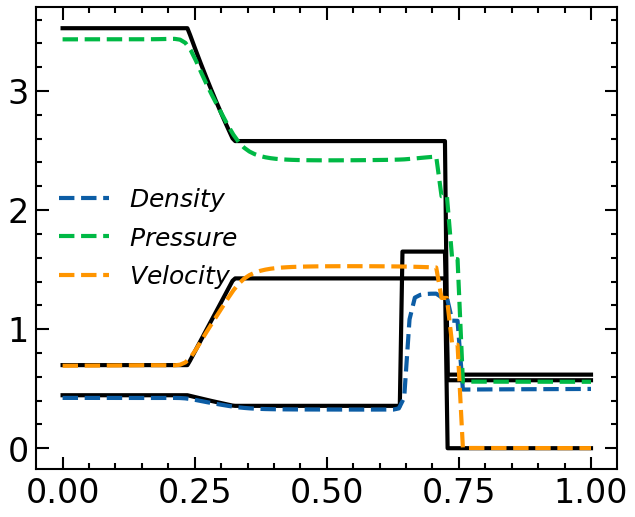

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.6949, -4.2532],
        [-0.7417, -5.7870]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0044e+00, -7.4970e-04],
        [ 8.3494e-03,  1.0010e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[0.0888, 0.0270, 0.7085, 0.1458]], device='cuda:0',
       dtype=torch.float64),tensor([[0.2064, 0.1547, 0.4412, 0.1811]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1981, 0.1797, 0.4507, 0.1817]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 4000 | Loss: 0.157131


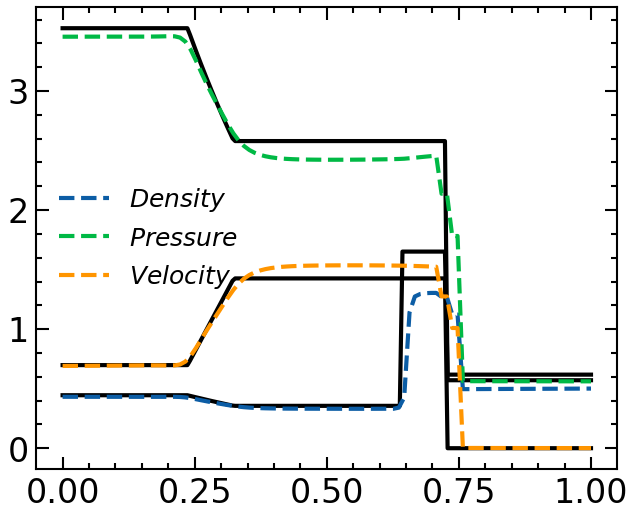

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ -2.6153, -71.4053],
        [  2.0645,   6.8445]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0045e+00, -6.8407e-04],
        [ 8.3045e-03,  1.0010e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[0.1194, 0.0176, 0.7544, 0.0939]], device='cuda:0',
       dtype=torch.float64),tensor([[0.2014, 0.1244, 0.5665, 0.0945]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1908, 0.1357, 0.5777, 0.1009]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 5000 | Loss: 0.178766


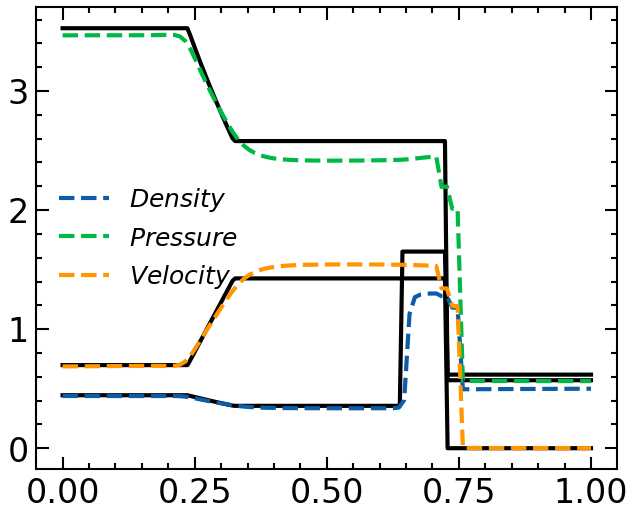

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0099,  9.8729],
        [-0.1536, -2.3631]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0044e+00, -6.0562e-04],
        [ 8.4912e-03,  1.0011e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[0.1209, 0.0100, 0.8624, 0.0009]], device='cuda:0',
       dtype=torch.float64),tensor([[1.8730e-01, 9.9998e-02, 7.0647e-01, 5.9254e-04]], device='cuda:0',
       dtype=torch.float64),tensor([[1.7395e-01, 1.0944e-01, 7.2436e-01, 2.1480e-04]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 6000 | Loss: 0.079025


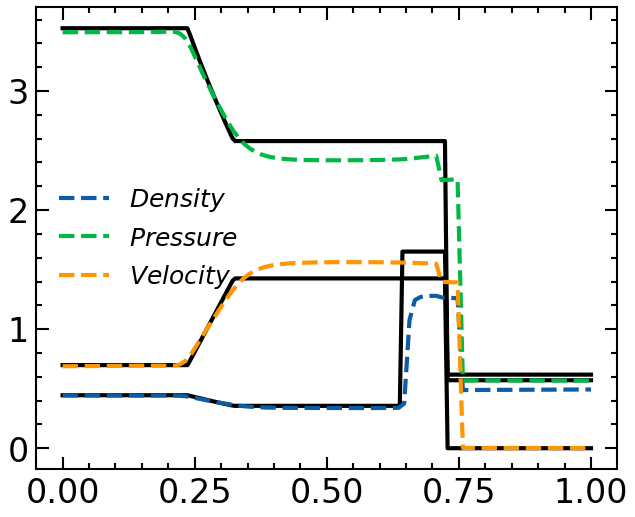

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.3391,  6.4539],
        [-0.3110,  3.8620]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0042e+00, -6.2454e-04],
        [ 8.6454e-03,  1.0013e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 1.4824e-01,  6.2399e-05,  8.6224e-01, -9.0460e-05]], device='cuda:0',
       dtype=torch.float64),tensor([[ 1.5482e-01,  3.3722e-04,  8.4981e-01, -6.7500e-05]], device='cuda:0',
       dtype=torch.float64),tensor([[ 1.4373e-01,  7.7652e-05,  8.5617e-01, -6.0570e-05]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 7000 | Loss: 0.029038


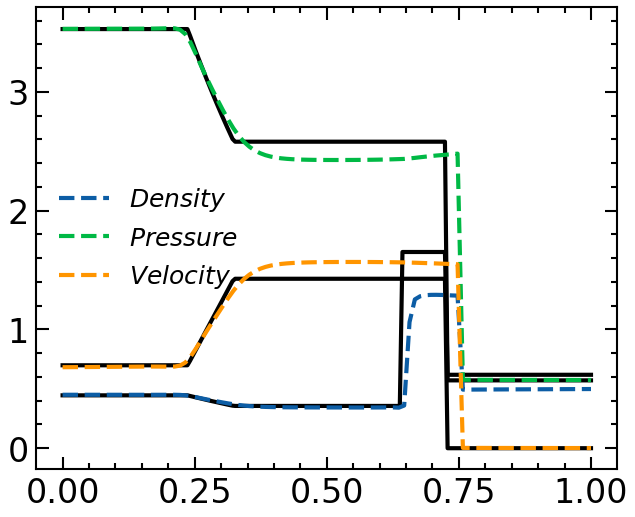

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-4.2275e-02,  4.4073e+00],
        [ 6.6287e-06, -2.8241e+00]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0039e+00, -6.9218e-04],
        [ 9.4290e-03,  1.0013e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[9.0292e-02, 3.8222e-04, 9.1745e-01, 3.2154e-04]], device='cuda:0',
       dtype=torch.float64),tensor([[ 1.0247e-01, -1.4118e-03,  9.0357e-01,  5.3590e-04]], device='cuda:0',
       dtype=torch.float64),tensor([[ 9.4121e-02,  7.9528e-05,  9.0596e-01, -1.0707e-05]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 8000 | Loss: 0.023986


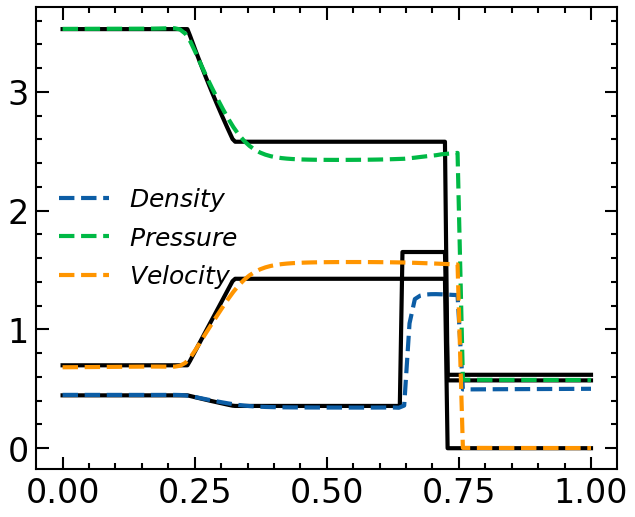

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.1122, -2.9924],
        [ 0.0415,  0.4099]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0038e+00, -7.1765e-04],
        [ 1.1012e-02,  1.0013e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[5.9118e-02, 4.7788e-04, 9.4822e-01, 1.8371e-04]], device='cuda:0',
       dtype=torch.float64),tensor([[ 6.5401e-02, -8.2764e-04,  9.4059e-01,  3.2670e-04]], device='cuda:0',
       dtype=torch.float64),tensor([[ 5.9190e-02, -9.6431e-05,  9.4048e-01, -1.4896e-04]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 9000 | Loss: 0.019178


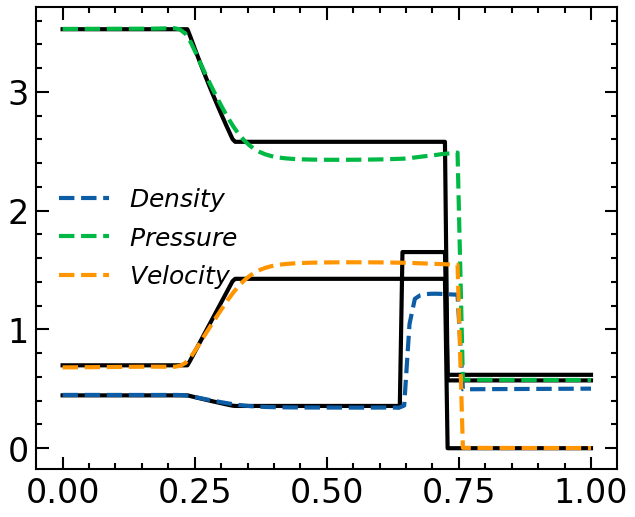

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0037, -0.8816],
        [-0.0278,  0.3570]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0049e+00, -5.9808e-04],
        [ 1.3102e-02,  1.0012e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 4.4246e-02,  1.2626e-03,  9.6264e-01, -8.9145e-05]], device='cuda:0',
       dtype=torch.float64),tensor([[ 4.8295e-02,  1.1502e-03,  9.5576e-01, -1.4557e-05]], device='cuda:0',
       dtype=torch.float64),tensor([[ 4.3700e-02,  1.1317e-03,  9.5534e-01, -4.9114e-05]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 10000 | Loss: 0.017447


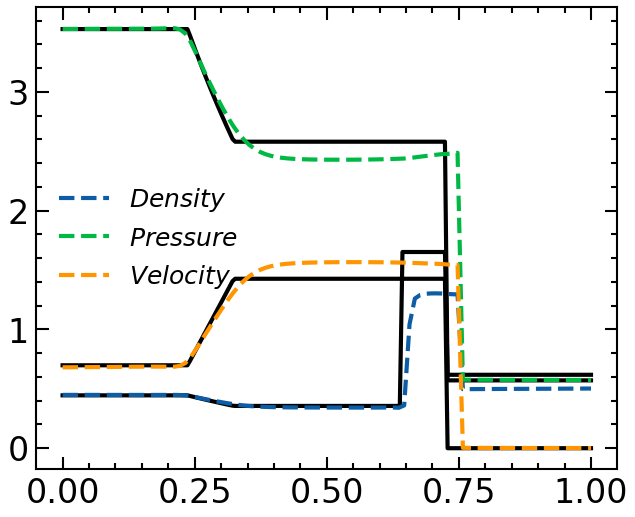

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.0400, -0.8844],
        [-0.0195,  0.5833]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0066e+00, -3.9074e-04],
        [ 1.8631e-02,  1.0011e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 3.5849e-02,  1.3261e-03,  9.7043e-01, -1.2683e-04]], device='cuda:0',
       dtype=torch.float64),tensor([[3.9051e-02, 7.5495e-05, 9.6630e-01, 1.4103e-04]], device='cuda:0',
       dtype=torch.float64),tensor([[ 3.4884e-02,  2.1622e-04,  9.6469e-01, -6.5485e-05]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 11000 | Loss: 0.016784


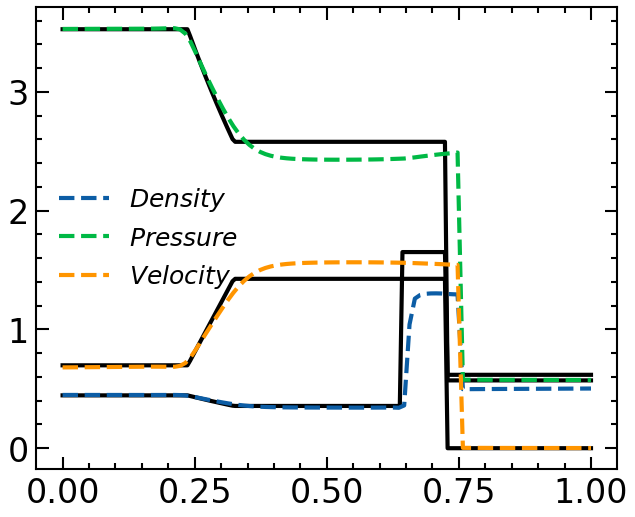

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.0214,  0.2216],
        [-0.0120,  0.1824]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0073e+00, -2.6699e-04],
        [ 2.0681e-02,  1.0011e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 3.5210e-02,  1.3689e-03,  9.7182e-01, -8.0503e-06]], device='cuda:0',
       dtype=torch.float64),tensor([[ 3.6180e-02,  5.5307e-05,  9.6880e-01, -1.6360e-04]], device='cuda:0',
       dtype=torch.float64),tensor([[ 3.2566e-02,  2.8505e-04,  9.6736e-01, -1.9412e-05]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 12000 | Loss: 0.017254


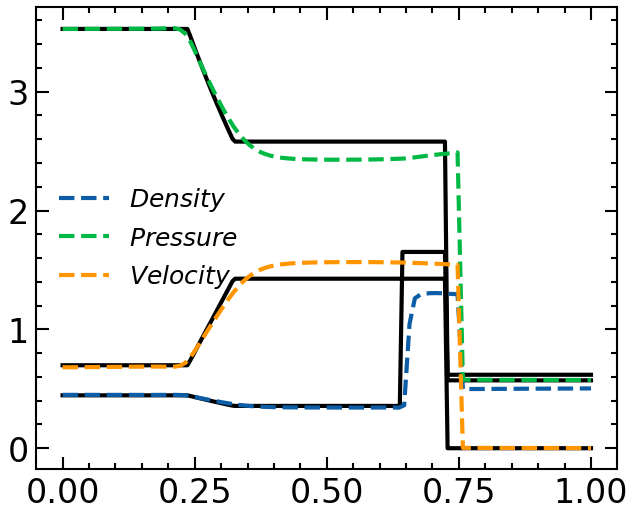

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0203,  0.0484],
        [ 0.0091, -0.4069]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0073e+00, -2.9037e-04],
        [ 2.0753e-02,  1.0011e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 3.2835e-02,  1.3992e-03,  9.7397e-01, -8.2442e-05]], device='cuda:0',
       dtype=torch.float64),tensor([[ 3.5538e-02, -6.9726e-05,  9.6944e-01, -1.3710e-04]], device='cuda:0',
       dtype=torch.float64),tensor([[3.1780e-02, 1.8205e-04, 9.6803e-01, 5.8113e-05]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 13000 | Loss: 0.016228


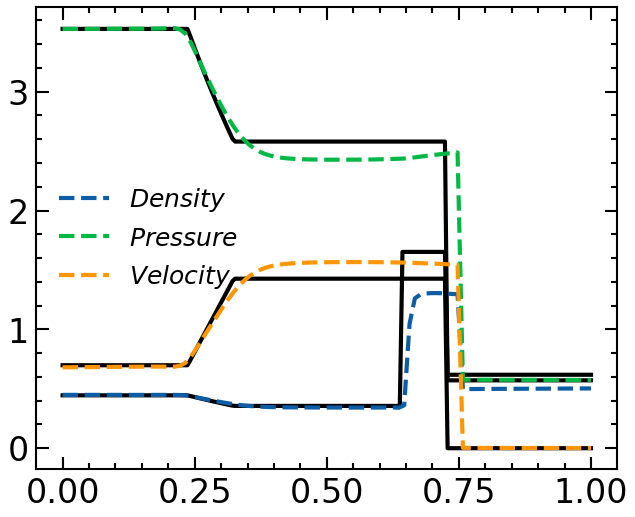

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0077, -0.5625],
        [-0.0055, -0.2434]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0074e+00, -2.8281e-04],
        [ 2.0861e-02,  1.0010e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 3.4323e-02,  1.8770e-03,  9.7163e-01, -7.8448e-05]], device='cuda:0',
       dtype=torch.float64),tensor([[ 3.8408e-02,  5.3961e-03,  9.6159e-01, -1.6728e-05]], device='cuda:0',
       dtype=torch.float64),tensor([[ 3.4372e-02,  5.3073e-03,  9.6101e-01, -1.3032e-06]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 14000 | Loss: 0.016283


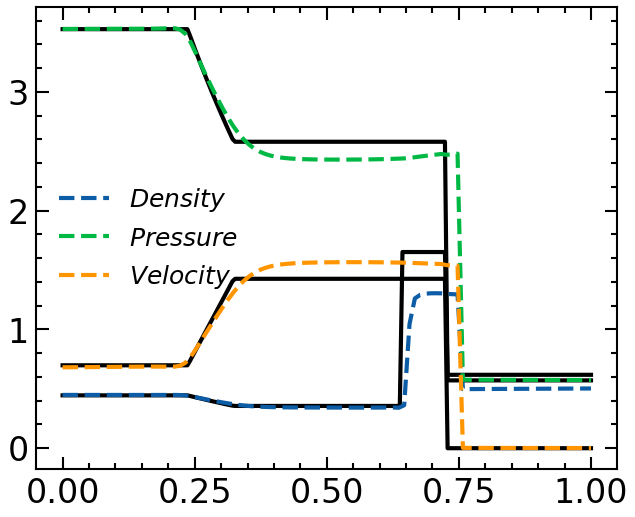

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.1071,  3.4497],
        [ 0.0295, -1.5352]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0074e+00, -2.4136e-04],
        [ 2.1772e-02,  1.0010e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 3.3403e-02,  1.8219e-03,  9.7335e-01, -1.2686e-04]], device='cuda:0',
       dtype=torch.float64),tensor([[3.5887e-02, 3.4772e-04, 9.6898e-01, 9.8320e-05]], device='cuda:0',
       dtype=torch.float64),tensor([[3.2463e-02, 3.4095e-04, 9.6764e-01, 3.3116e-06]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 15000 | Loss: 0.029683


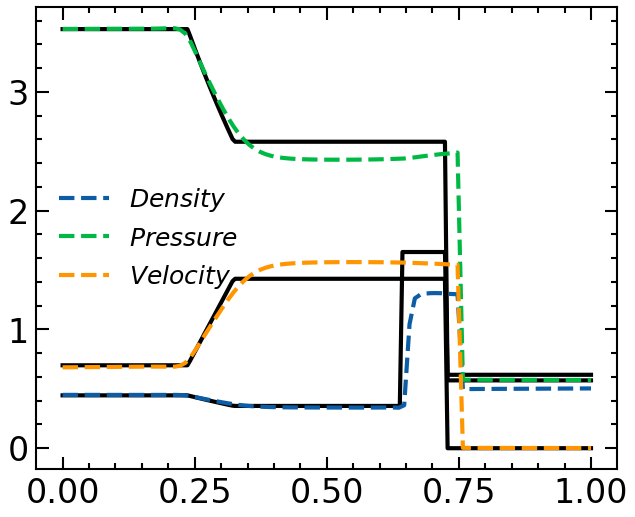

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0030, -0.3849],
        [ 0.0023,  0.1440]], device='cuda:0', dtype=torch.float64) and tensor([[1.0075e+00, 3.5768e-04],
        [2.4282e-02, 1.0026e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.0141,  0.0036,  0.9885, -0.0013]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0168, 0.0060, 0.9556, 0.0245]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0145, 0.0079, 0.9533, 0.0254]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 16000 | Loss: 0.024384


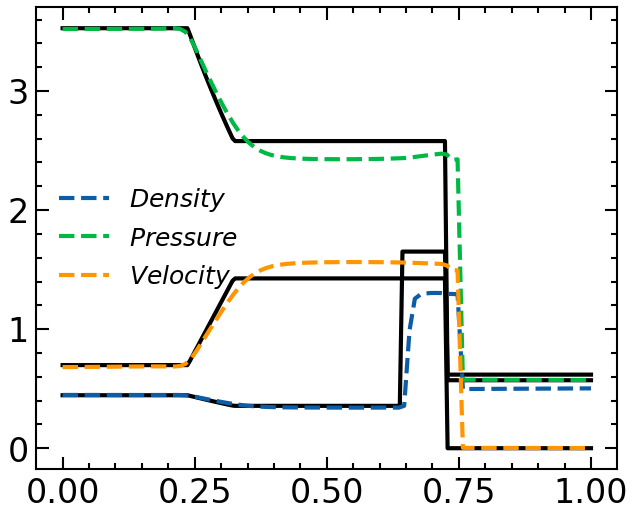

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0059,  0.6769],
        [ 0.0032, -0.3755]], device='cuda:0', dtype=torch.float64) and tensor([[1.0074e+00, 5.4891e-04],
        [2.2774e-02, 1.0028e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.2905e-02, 7.2556e-04, 9.8748e-01, 2.6808e-03]], device='cuda:0',
       dtype=torch.float64),tensor([[ 0.0100, -0.0183,  0.9893,  0.0235]], device='cuda:0',
       dtype=torch.float64),tensor([[ 0.0087, -0.0172,  0.9855,  0.0239]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 17000 | Loss: 0.024994


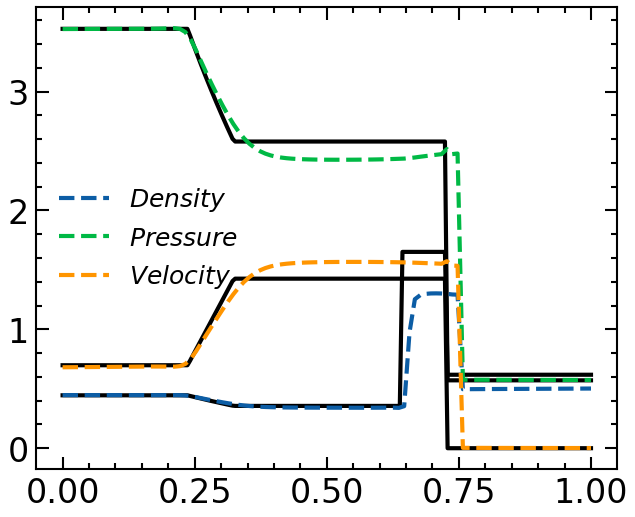

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[0.0050, 0.0776],
        [0.0004, 0.0415]], device='cuda:0', dtype=torch.float64) and tensor([[1.0062e+00, 5.9885e-04],
        [2.0761e-02, 1.0027e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.2422e-02, 6.3255e-04, 9.8916e-01, 2.1101e-03]], device='cuda:0',
       dtype=torch.float64),tensor([[ 0.0083, -0.0172,  0.9949,  0.0190]], device='cuda:0',
       dtype=torch.float64),tensor([[ 0.0074, -0.0169,  0.9912,  0.0194]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 18000 | Loss: 0.023003


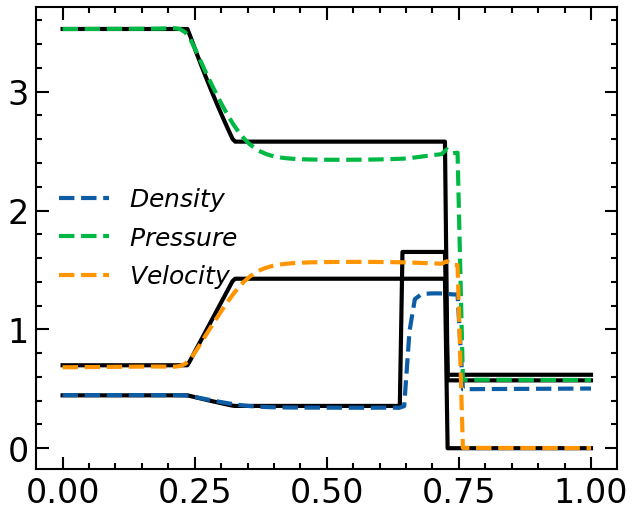

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0008,  0.5835],
        [ 0.0009, -0.3200]], device='cuda:0', dtype=torch.float64) and tensor([[1.0023e+00, 7.5288e-04],
        [1.7522e-02, 1.0028e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0724e-02, 9.5596e-04, 9.9263e-01, 1.1930e-03]], device='cuda:0',
       dtype=torch.float64),tensor([[ 0.0100, -0.0095,  0.9972,  0.0068]], device='cuda:0',
       dtype=torch.float64),tensor([[ 0.0086, -0.0081,  0.9933,  0.0071]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 19000 | Loss: 0.020201


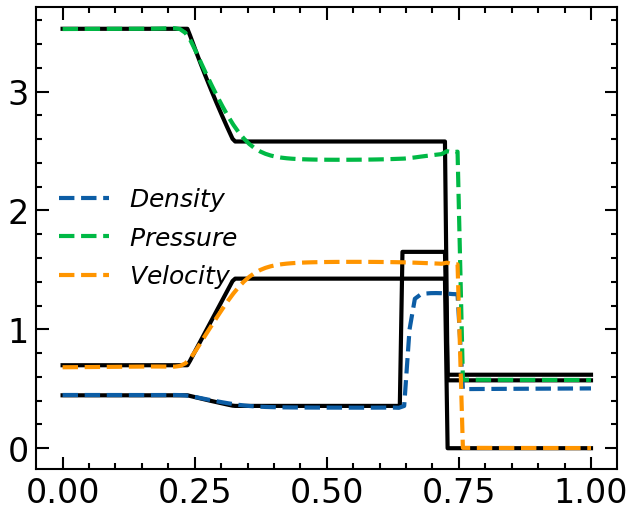

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0013e+00, 4.4273e-04],
        [1.7093e-02, 1.0031e+00]], device='cuda:0', dtype=torch.float64) and tensor([[5.1377e-03, 6.8735e-04, 1.0005e+00, 2.3452e-04]], device='cuda:0',
       dtype=torch.float64),tensor([[ 8.6142e-03,  9.6301e-04,  1.0020e+00, -6.3232e-03]], device='cuda:0',
       dtype=torch.float64),tensor([[ 0.0075,  0.0020,  0.9977, -0.0067]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 20000 | Loss: 0.021480 (TGPT_PINN2 Step Criteria Met)



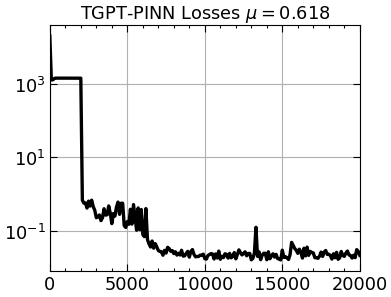

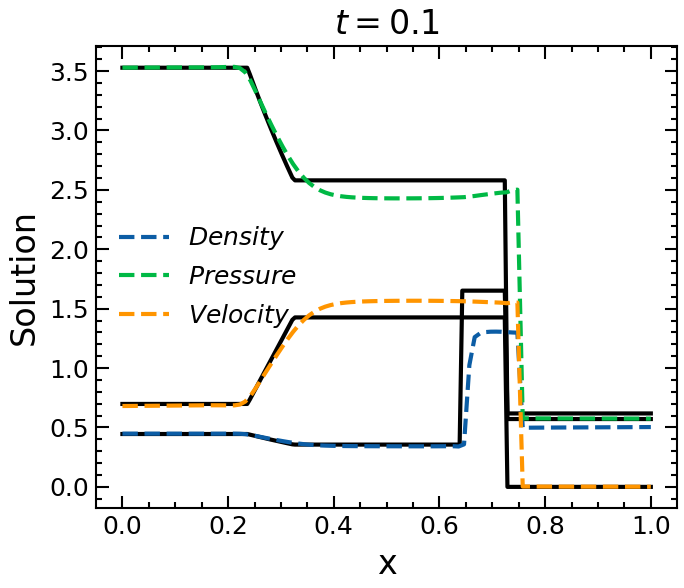

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]: tensor([[1., 0.],
        [0., 1.]], device='cuda:0', dtype=torch.float64) and tensor([[0.2000, 0.2000, 0.2000, 0.2000, 0.2000]], device='cuda:0',
       dtype=torch.float64),tensor([[0.2000, 0.2000, 0.2000, 0.2000, 0.2000]], device='cuda:0',
       dtype=torch.float64),tensor([[0.2000, 0.2000, 0.2000, 0.2000, 0.2000]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]: Loss: 34569.215527
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]: Epoch: 0 | Loss: 34569.2155270382
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 500 | Loss: 52.987434
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 1000 | Loss: 74.417014
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 1500 | Loss: 73.836974
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 2000 | Loss: 73.375894
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 9.9987e-01, -1.6528e-04],
        [ 1.3656e-04,  1.0002e+00]], device='cuda:0', dtype=torch.float64) and tensor([[0.2000

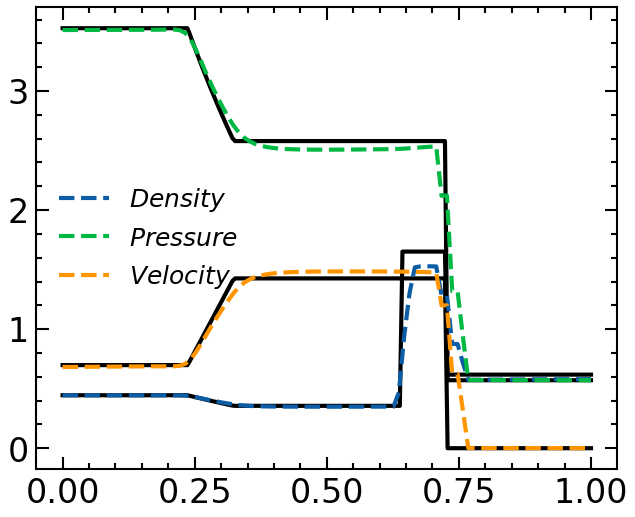

Step 2 Training Begin...
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 2.8522, 25.7812],
        [-1.0486, -7.4181]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9958e-01, -5.5832e-04],
        [ 1.2946e-03,  9.9992e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0228,  0.0206,  0.3925,  0.5460,  0.0327]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1491, 0.0430, 0.2083, 0.3321, 0.2595]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1511, 0.0339, 0.2328, 0.3174, 0.2625]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 3000 | Loss: 0.170001


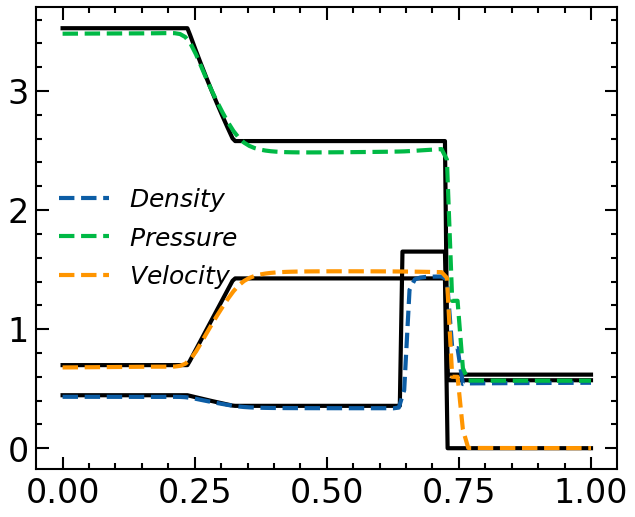

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 1.0344, 10.5625],
        [-0.4557, -5.1920]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9880e-01, -8.0167e-04],
        [ 4.1831e-04,  1.0004e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0114,  0.0132,  0.3910,  0.5371,  0.0512]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1161, 0.0379, 0.2336, 0.4303, 0.1770]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1046, 0.0069, 0.2661, 0.4388, 0.1760]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 4000 | Loss: 0.173081


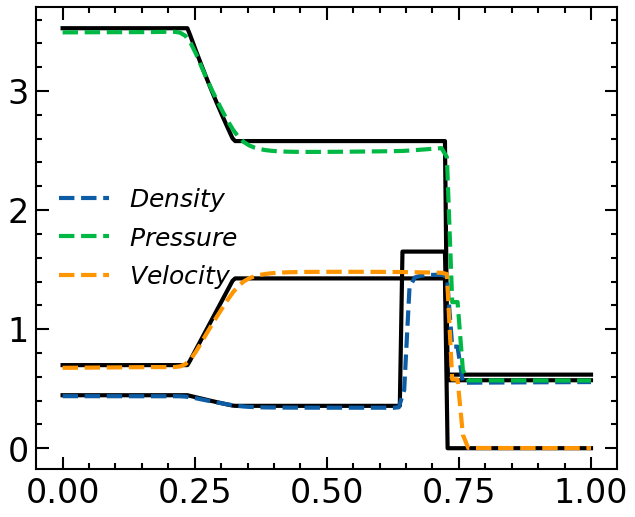

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.1028,  0.0820],
        [-0.0640, -2.0242]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9962e-01, -1.1377e-03],
        [-4.8457e-04,  9.9990e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0098,  0.0143,  0.2978,  0.6342,  0.0524]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0514, 0.0199, 0.2128, 0.5324, 0.1803]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0588, 0.0006, 0.2363, 0.5147, 0.1835]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 5000 | Loss: 0.101415


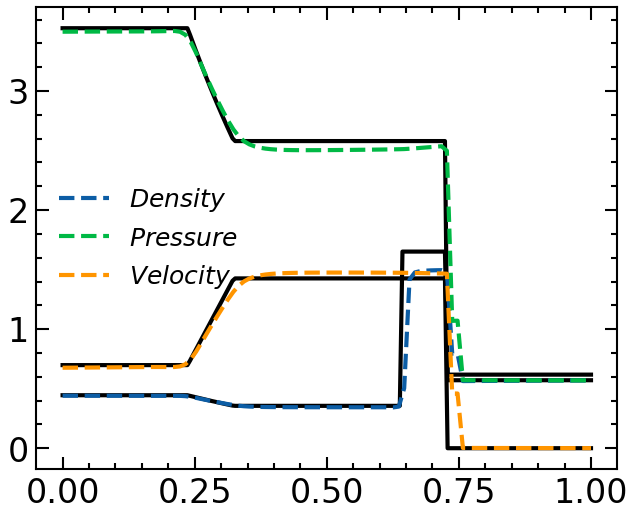

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.7379,  6.8470],
        [-0.7277, -4.9105]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9966e-01, -1.0870e-03],
        [-4.1442e-04,  9.9995e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[0.0154, 0.0232, 0.0628, 0.8105, 0.0662]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0783, 0.0370, 0.0135, 0.6808, 0.1849]], device='cuda:0',
       dtype=torch.float64),tensor([[7.7879e-02, 5.2317e-04, 6.1052e-02, 6.5838e-01, 1.9916e-01]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 6000 | Loss: 0.086318


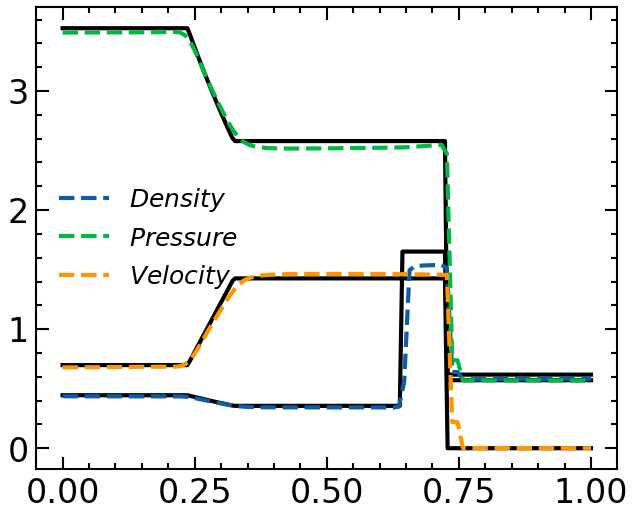

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.0418,  1.1866],
        [-0.0448, -0.0590]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9968e-01, -1.0718e-03],
        [-3.3123e-04,  9.9988e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[0.0060, 0.0044, 0.0023, 0.9437, 0.0351]], device='cuda:0',
       dtype=torch.float64),tensor([[ 0.0147, -0.0034,  0.0013,  0.7966,  0.1928]], device='cuda:0',
       dtype=torch.float64),tensor([[ 0.0166, -0.0049,  0.0056,  0.7944,  0.1913]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 7000 | Loss: 0.022856


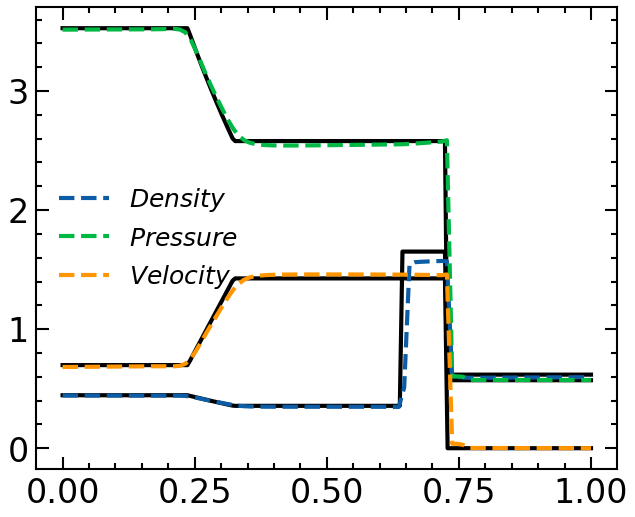

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.0054,  0.0143],
        [-0.0030, -0.0566]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9969e-01, -1.0761e-03],
        [-2.8466e-04,  9.9987e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 1.6719e-03, -4.7578e-04,  6.8092e-03,  9.6687e-01,  2.3154e-02]],
       device='cuda:0', dtype=torch.float64),tensor([[ 1.0022e-02, -5.1770e-03, -1.2004e-04,  8.5511e-01,  1.4281e-01]],
       device='cuda:0', dtype=torch.float64),tensor([[ 1.1408e-02, -4.0939e-03,  3.2748e-04,  8.5438e-01,  1.4085e-01]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 8000 | Loss: 0.013602


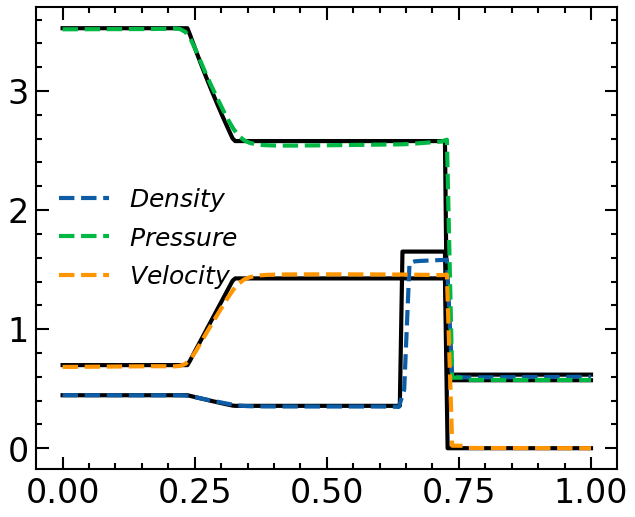

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0003, -0.0936],
        [ 0.0012, -0.0289]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9972e-01, -1.0740e-03],
        [-2.4367e-04,  9.9988e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 1.8962e-04, -1.2550e-03,  7.6597e-03,  9.7627e-01,  1.6378e-02]],
       device='cuda:0', dtype=torch.float64),tensor([[ 8.6200e-03, -3.9954e-03,  2.0395e-04,  8.8752e-01,  1.1134e-01]],
       device='cuda:0', dtype=torch.float64),tensor([[ 9.4742e-03, -3.0481e-03,  1.2170e-04,  8.8590e-01,  1.0969e-01]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 9000 | Loss: 0.019335


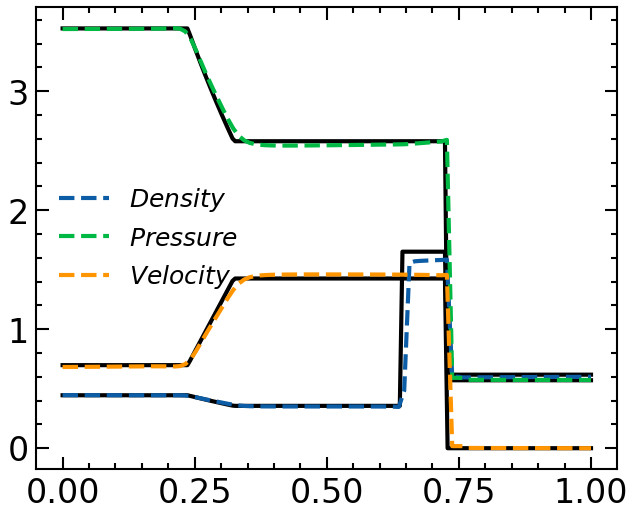

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.3846, -5.4498],
        [-0.1857, -2.3119]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0000e+00, -8.5132e-04],
        [-4.0828e-04,  9.9970e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0027,  0.0027,  0.0277,  0.9384,  0.0313]], device='cuda:0',
       dtype=torch.float64),tensor([[-0.0181,  0.0052,  0.0304,  0.9089,  0.0728]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0030, 0.0134, 0.0313, 0.8790, 0.0734]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 10000 | Loss: 0.029579


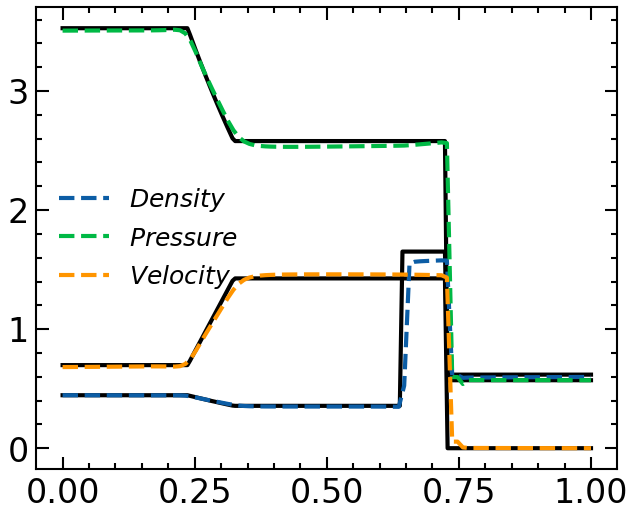

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.2040, -1.6971],
        [ 0.0757,  0.6338]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0000e+00, -8.5087e-04],
        [-4.0862e-04,  9.9970e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-1.6116e-03,  6.1161e-04,  6.9409e-03,  9.8182e-01,  1.3782e-02]],
       device='cuda:0', dtype=torch.float64),tensor([[-0.0148, -0.0016,  0.0199,  0.9116,  0.0883]], device='cuda:0',
       dtype=torch.float64),tensor([[-1.2400e-02, -1.4580e-04,  1.9048e-02,  9.0836e-01,  8.7003e-02]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 11000 | Loss: 0.005508


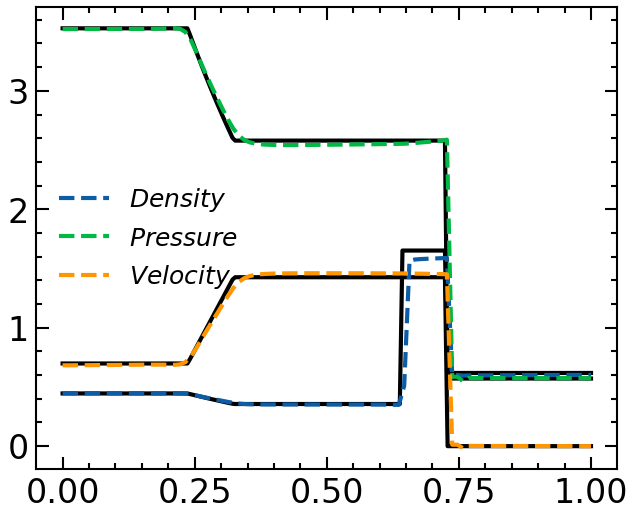

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0223, -0.0779],
        [ 0.0099,  0.1320]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0000e+00, -8.5065e-04],
        [-4.0899e-04,  9.9970e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-4.7597e-04, -1.5604e-03, -1.6173e-03,  9.9719e-01,  1.0056e-02]],
       device='cuda:0', dtype=torch.float64),tensor([[-0.0091, -0.0045,  0.0070,  0.9229,  0.0872]], device='cuda:0',
       dtype=torch.float64),tensor([[-0.0081, -0.0031,  0.0055,  0.9220,  0.0856]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 12000 | Loss: 0.022382


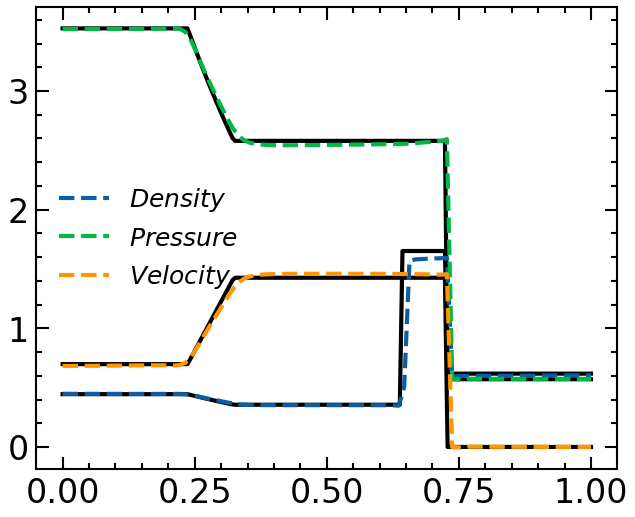

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0006,  0.0883],
        [-0.0005,  0.0311]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0000e+00, -8.4996e-04],
        [-4.0886e-04,  9.9970e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-1.9889e-04, -9.6594e-04,  5.9146e-03,  9.8634e-01,  1.0288e-02]],
       device='cuda:0', dtype=torch.float64),tensor([[-1.7890e-04, -1.9699e-03,  6.1807e-03,  9.2490e-01,  7.4854e-02]],
       device='cuda:0', dtype=torch.float64),tensor([[ 9.2738e-04, -7.7996e-04,  5.6743e-03,  9.2241e-01,  7.3720e-02]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 13000 | Loss: 0.005541


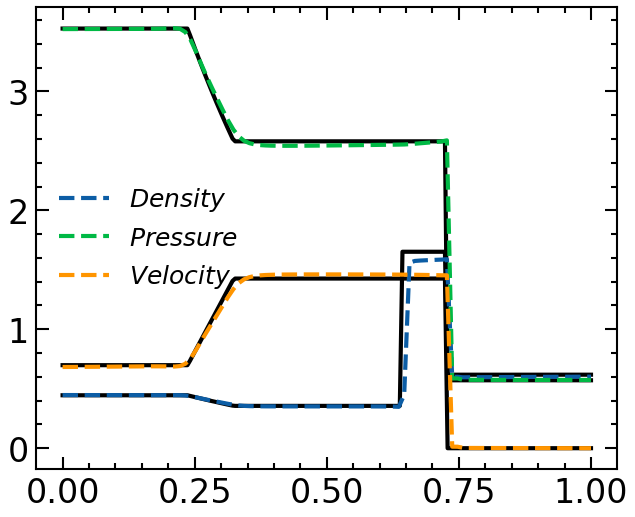

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-5.1410e-04,  1.9779e-01],
        [-1.4261e-04,  8.6477e-02]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0000e+00, -8.5052e-04],
        [-4.0824e-04,  9.9970e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-5.7645e-05, -1.3019e-03,  2.8491e-03,  9.9137e-01,  8.7567e-03]],
       device='cuda:0', dtype=torch.float64),tensor([[ 0.0014, -0.0020,  0.0021,  0.9392,  0.0636]], device='cuda:0',
       dtype=torch.float64),tensor([[ 2.1647e-03, -5.7913e-04,  1.6514e-03,  9.3579e-01,  6.2575e-02]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 14000 | Loss: 0.004256


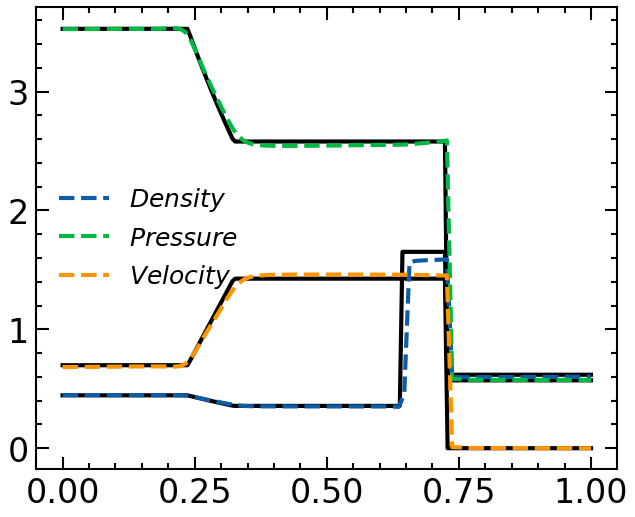

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0004, -0.0616],
        [-0.0004, -0.0342]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0000e+00, -8.5247e-04],
        [-4.0693e-04,  9.9970e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 2.9199e-04, -9.8134e-04,  3.7203e-03,  9.9012e-01,  9.4873e-03]],
       device='cuda:0', dtype=torch.float64),tensor([[ 0.0016, -0.0024,  0.0026,  0.9451,  0.0569]], device='cuda:0',
       dtype=torch.float64),tensor([[ 2.6690e-03, -6.0046e-04,  1.8262e-03,  9.4159e-01,  5.6654e-02]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 15000 | Loss: 0.007170


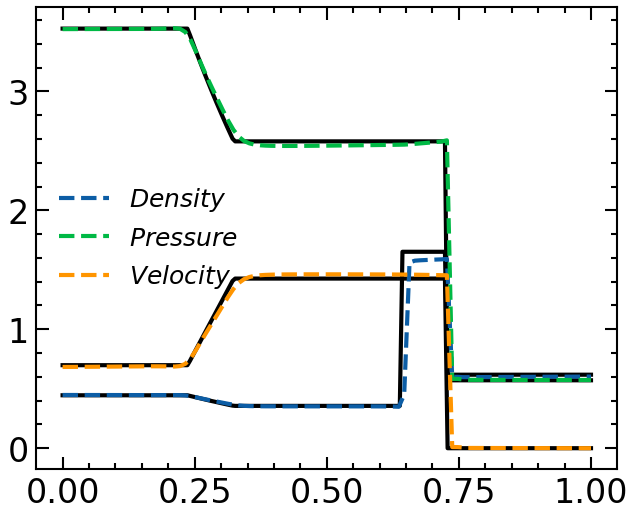

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0016, -0.0224],
        [-0.0005, -0.0073]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0000e+00, -8.5626e-04],
        [-4.0391e-04,  9.9969e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 3.2448e-05, -1.0265e-03,  2.7392e-03,  9.9202e-01,  8.8324e-03]],
       device='cuda:0', dtype=torch.float64),tensor([[ 0.0014, -0.0018,  0.0018,  0.9508,  0.0519]], device='cuda:0',
       dtype=torch.float64),tensor([[ 2.1203e-03, -6.8318e-04,  1.3449e-03,  9.4742e-01,  5.1333e-02]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 16000 | Loss: 0.004099


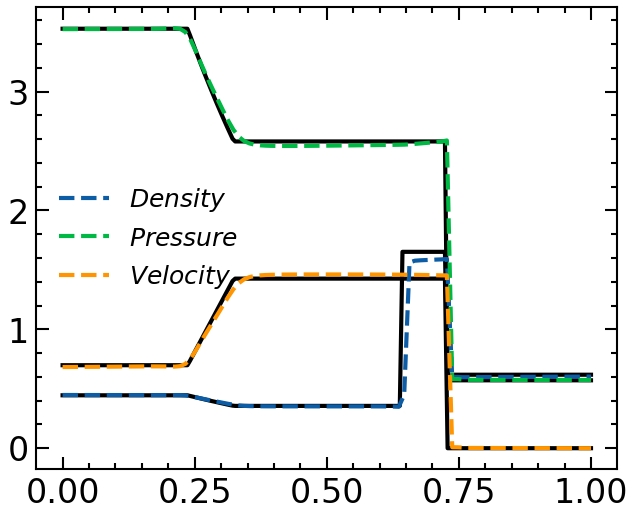

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-1.7897e-03,  6.5660e-02],
        [ 7.3186e-05,  3.2011e-02]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0000e+00, -8.7632e-04],
        [-4.0392e-04,  9.9963e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 5.8213e-05, -9.7974e-04,  1.5981e-03,  9.9341e-01,  8.5990e-03]],
       device='cuda:0', dtype=torch.float64),tensor([[ 7.7049e-04, -1.5853e-03,  1.2304e-03,  9.5433e-01,  4.8751e-02]],
       device='cuda:0', dtype=torch.float64),tensor([[ 1.3477e-03, -6.7798e-04,  1.2426e-03,  9.5126e-01,  4.8419e-02]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 17000 | Loss: 0.004454


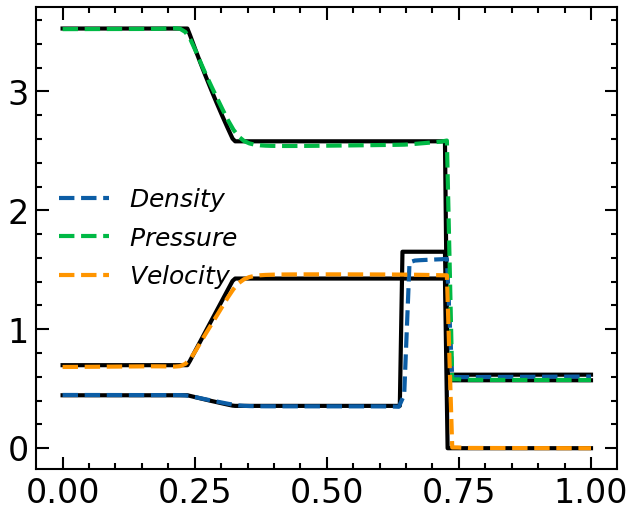

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0001, -0.0055],
        [-0.0003, -0.0064]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0001e+00, -9.2972e-04],
        [-3.9533e-04,  9.9949e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-1.2316e-04, -1.0537e-03,  1.2726e-03,  9.9419e-01,  8.6194e-03]],
       device='cuda:0', dtype=torch.float64),tensor([[ 1.2920e-04, -1.4219e-03,  1.7544e-03,  9.5642e-01,  4.7313e-02]],
       device='cuda:0', dtype=torch.float64),tensor([[ 5.9231e-04, -6.8980e-04,  1.2433e-03,  9.5331e-01,  4.6777e-02]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 18000 | Loss: 0.002431


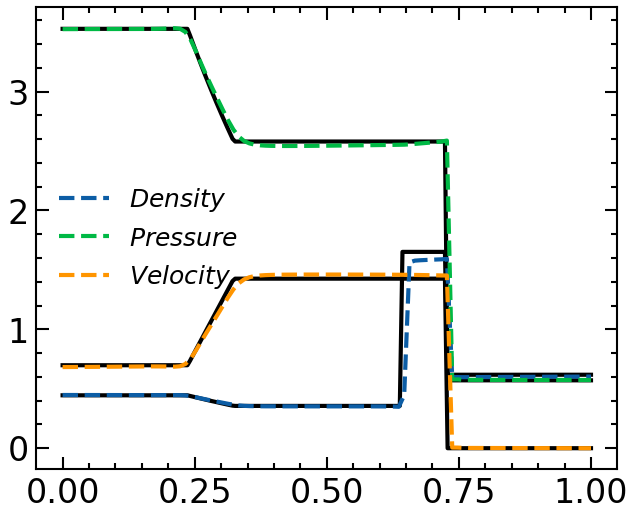

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.0040, -0.1642],
        [ 0.0027, -0.0511]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0002e+00, -1.0973e-03],
        [-1.4753e-04,  9.9942e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 3.9005e-05, -3.4297e-03,  2.4387e-02,  9.6664e-01,  8.7833e-03]],
       device='cuda:0', dtype=torch.float64),tensor([[0.0152, 0.0109, 0.0040, 0.9560, 0.0103]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0131, 0.0017, 0.0116, 0.9625, 0.0097]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 19000 | Loss: 0.049646


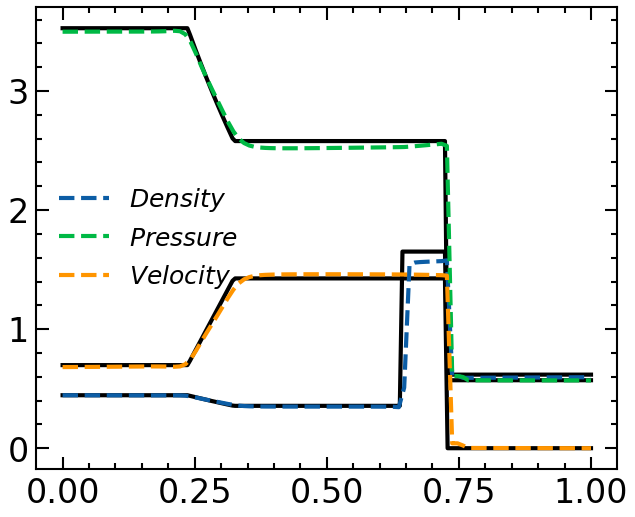

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 1.0002e+00, -1.0966e-03],
        [-1.4785e-04,  9.9942e-01]], device='cuda:0', dtype=torch.float64) and tensor([[-6.4923e-05, -8.6964e-04,  3.4277e-03,  9.9771e-01,  2.1390e-03]],
       device='cuda:0', dtype=torch.float64),tensor([[ 3.9737e-04, -3.3402e-03,  4.4881e-03,  9.5511e-01,  4.5588e-02]],
       device='cuda:0', dtype=torch.float64),tensor([[ 4.1246e-04, -4.8548e-03,  5.4517e-03,  9.5542e-01,  4.4004e-02]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 20000 | Loss: 0.057283 (TGPT_PINN2 Step Criteria Met)



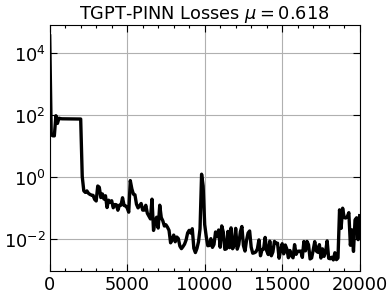

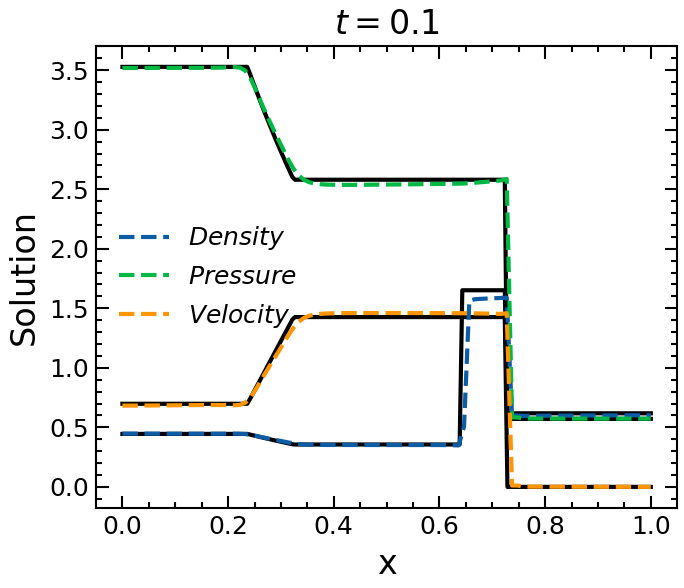

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]: tensor([[1., 0.],
        [0., 1.]], device='cuda:0', dtype=torch.float64) and tensor([[0.1667, 0.1667, 0.1667, 0.1667, 0.1667, 0.1667]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1667, 0.1667, 0.1667, 0.1667, 0.1667, 0.1667]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1667, 0.1667, 0.1667, 0.1667, 0.1667, 0.1667]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]: Loss: 29317.575098
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]: Epoch: 0 | Loss: 29317.57509768029
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 500 | Loss: 823.284788
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 1000 | Loss: 718.189813
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 1500 | Loss: 716.534891
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 2000 | Loss: 76.879114
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 9.9983e-01, -2.0937e-04],
        [ 1.7514e-04,  1.0002e+00]], device='cuda:0', dtype=torch.

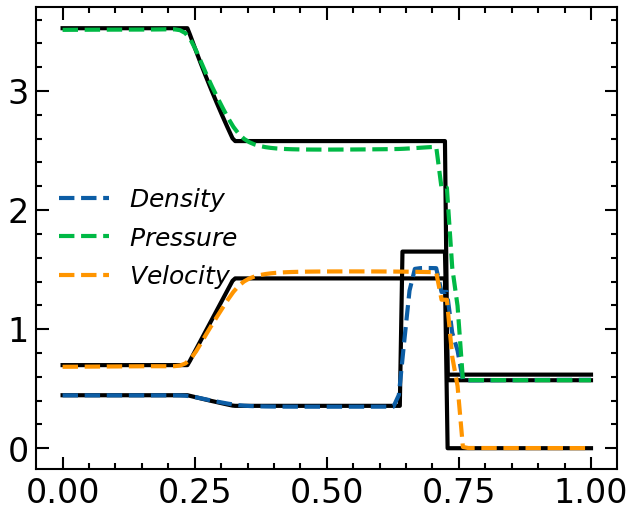

Step 2 Training Begin...
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.2679,  1.6272],
        [-0.0667,  2.0318]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0003e+00, -1.3068e-04],
        [ 9.6359e-04,  1.0005e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0205,  0.0315,  0.1469,  0.2684,  0.0317,  0.5355]],
       device='cuda:0', dtype=torch.float64),tensor([[0.1770, 0.1423, 0.1308, 0.1648, 0.1712, 0.1982]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1573, 0.1312, 0.1524, 0.1828, 0.1745, 0.1996]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 3000 | Loss: 0.182934


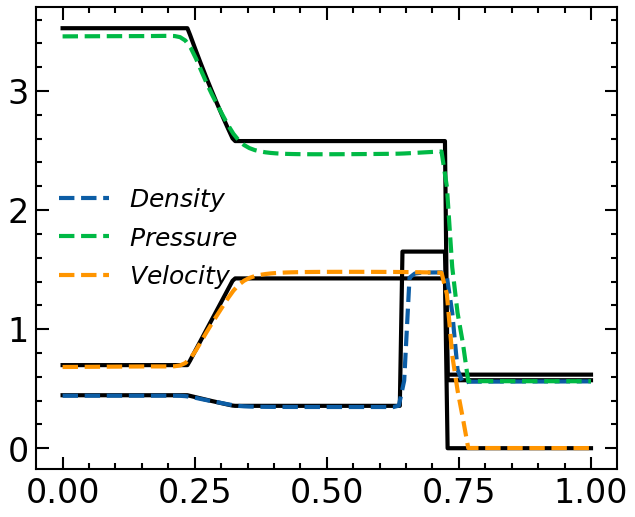

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.4981, -0.0801],
        [ 0.1122, -0.0468]], device='cuda:0', dtype=torch.float64) and tensor([[ 9.9901e-01, -7.9458e-05],
        [-3.0536e-05,  1.0005e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0063,  0.0123,  0.1379,  0.2584,  0.0371,  0.5622]],
       device='cuda:0', dtype=torch.float64),tensor([[0.1631, 0.0722, 0.1223, 0.2382, 0.1344, 0.2605]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1524, 0.0570, 0.1357, 0.2568, 0.1357, 0.2549]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 4000 | Loss: 0.136130


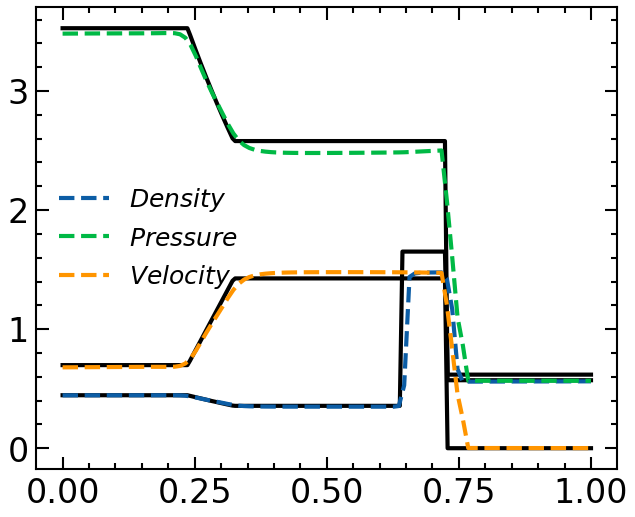

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.1892, -5.4197],
        [ 0.0571, -2.3909]], device='cuda:0', dtype=torch.float64) and tensor([[9.9742e-01, 2.8338e-05],
        [2.2434e-04, 1.0007e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[0.0007, 0.0051, 0.1180, 0.3251, 0.0295, 0.5229]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1256, 0.0400, 0.0918, 0.3139, 0.1286, 0.2956]], device='cuda:0',
       dtype=torch.float64),tensor([[0.1222, 0.0323, 0.0955, 0.3278, 0.1271, 0.2888]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 5000 | Loss: 0.224036


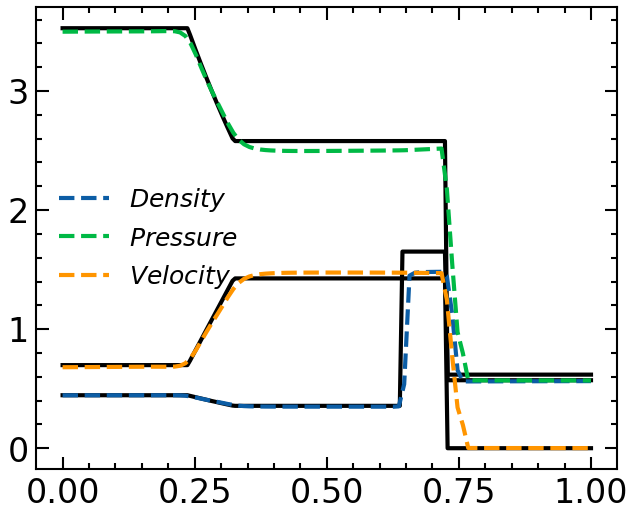

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.3015,  2.7518],
        [-0.1533, -1.4426]], device='cuda:0', dtype=torch.float64) and tensor([[1.0016e+00, 2.7658e-04],
        [2.8439e-03, 1.0007e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.0066, -0.0010,  0.0827,  0.3737,  0.0327,  0.5034]],
       device='cuda:0', dtype=torch.float64),tensor([[0.0944, 0.0297, 0.0488, 0.3687, 0.1261, 0.3316]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0930, 0.0260, 0.0512, 0.3785, 0.1226, 0.3240]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 6000 | Loss: 0.095377


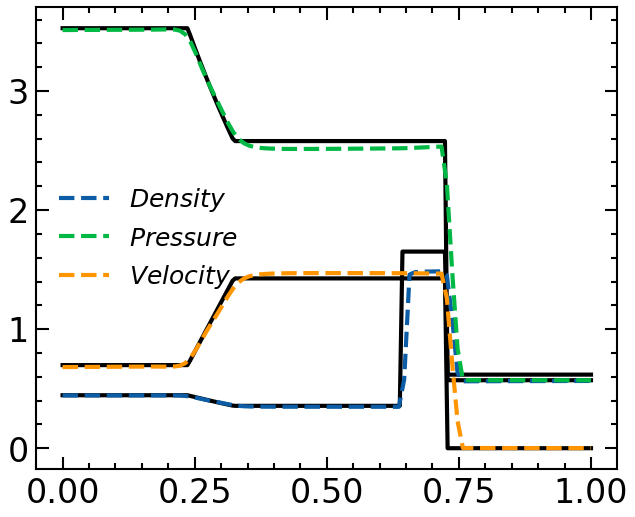

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.0233,  0.9455],
        [-0.0954, -0.5621]], device='cuda:0', dtype=torch.float64) and tensor([[1.0050e+00, 1.9651e-04],
        [7.7400e-03, 1.0003e+00]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.0067, -0.0008,  0.0526,  0.4151,  0.0288,  0.5021]],
       device='cuda:0', dtype=torch.float64),tensor([[0.0709, 0.0225, 0.0188, 0.4074, 0.1225, 0.3558]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0745, 0.0234, 0.0204, 0.4095, 0.1196, 0.3496]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 7000 | Loss: 0.085869


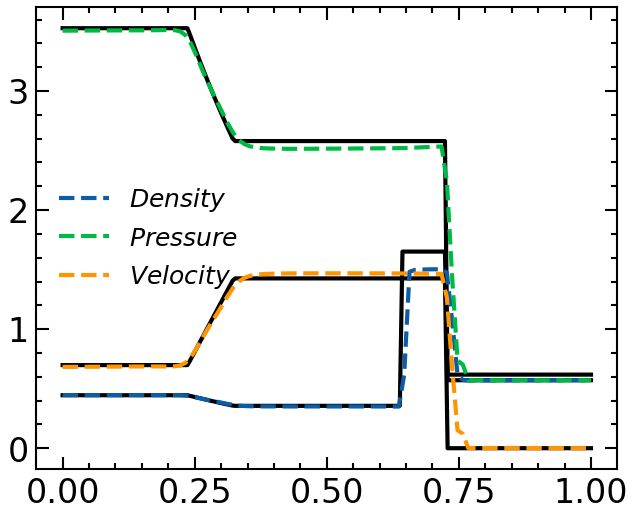

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.1284,  0.1532],
        [-0.0396,  0.2300]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0099e+00, -2.4874e-04],
        [ 1.7209e-02,  9.9991e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.0058, -0.0030,  0.0358,  0.4421,  0.0288,  0.4942]],
       device='cuda:0', dtype=torch.float64),tensor([[0.0530, 0.0184, 0.0033, 0.4346, 0.1212, 0.3681]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0592, 0.0224, 0.0052, 0.4309, 0.1179, 0.3622]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 8000 | Loss: 0.027747


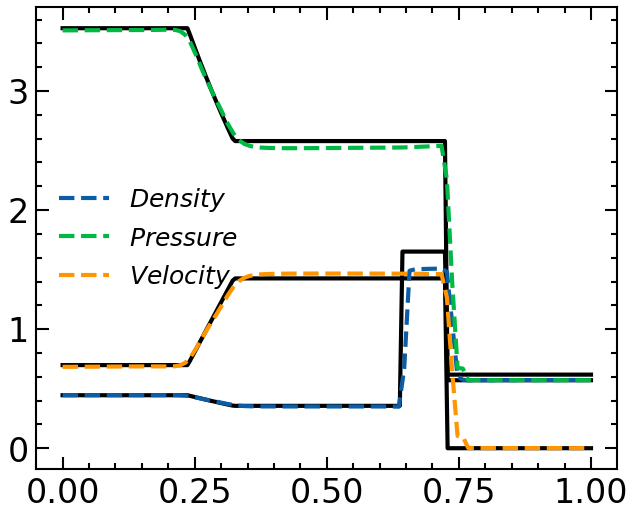

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.0527, -4.1891],
        [ 0.0150, -2.1106]], device='cuda:0', dtype=torch.float64) and tensor([[ 1.0118e+00, -3.8397e-04],
        [ 2.8550e-02,  9.9971e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.0029, -0.0027,  0.0282,  0.4655,  0.0286,  0.4869]],
       device='cuda:0', dtype=torch.float64),tensor([[0.0354, 0.0162, 0.0010, 0.4545, 0.1221, 0.3712]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0441, 0.0208, 0.0024, 0.4459, 0.1182, 0.3650]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 9000 | Loss: 0.092730


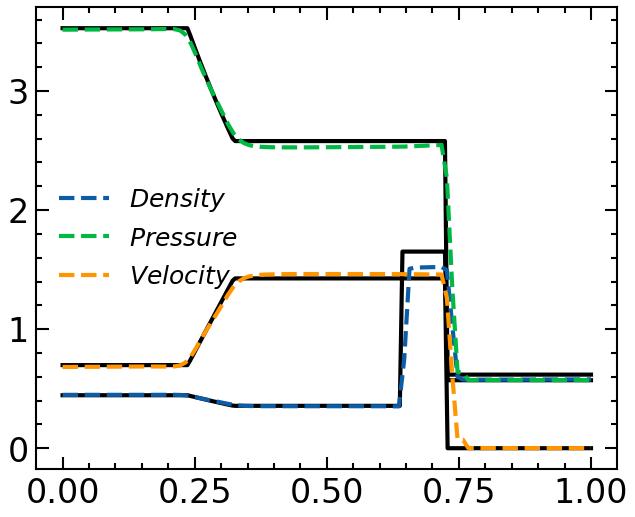

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0011,  0.0491],
        [-0.0045,  0.0476]], device='cuda:0', dtype=torch.float64) and tensor([[1.0152e+00, 1.3539e-05],
        [3.5117e-02, 9.9950e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0033,  0.0128,  0.0284,  0.5400,  0.0268,  0.4070]],
       device='cuda:0', dtype=torch.float64),tensor([[0.0011, 0.0513, 0.0060, 0.4705, 0.1065, 0.3620]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0156, 0.0701, 0.0041, 0.4446, 0.1050, 0.3578]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 10000 | Loss: 0.147084


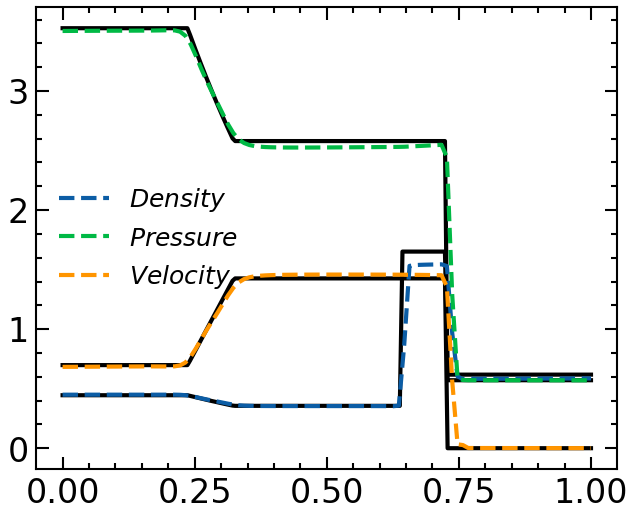

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.0360, -0.7214],
        [-0.0069, -0.9848]], device='cuda:0', dtype=torch.float64) and tensor([[1.0156e+00, 6.2393e-05],
        [3.4858e-02, 9.9949e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0043,  0.0162,  0.0260,  0.5403,  0.0213,  0.4144]],
       device='cuda:0', dtype=torch.float64),tensor([[ 0.0144,  0.0711, -0.0024,  0.4675,  0.0933,  0.3529]],
       device='cuda:0', dtype=torch.float64),tensor([[ 0.0211,  0.0860, -0.0022,  0.4523,  0.0924,  0.3479]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 11000 | Loss: 0.041350


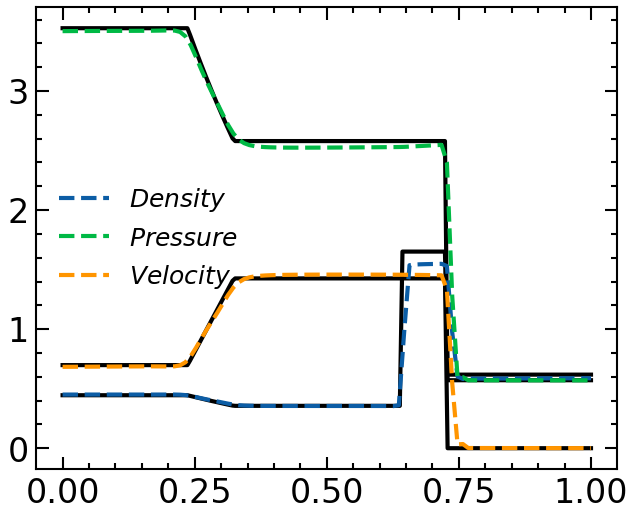

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0190, -0.0178],
        [-0.0071,  0.2454]], device='cuda:0', dtype=torch.float64) and tensor([[1.0158e+00, 4.3865e-05],
        [3.4778e-02, 9.9935e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0050,  0.0199,  0.0224,  0.5321,  0.0200,  0.4230]],
       device='cuda:0', dtype=torch.float64),tensor([[0.0225, 0.0866, 0.0100, 0.4645, 0.0778, 0.3340]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0272, 0.0819, 0.0181, 0.4585, 0.0819, 0.3264]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 12000 | Loss: 0.158325


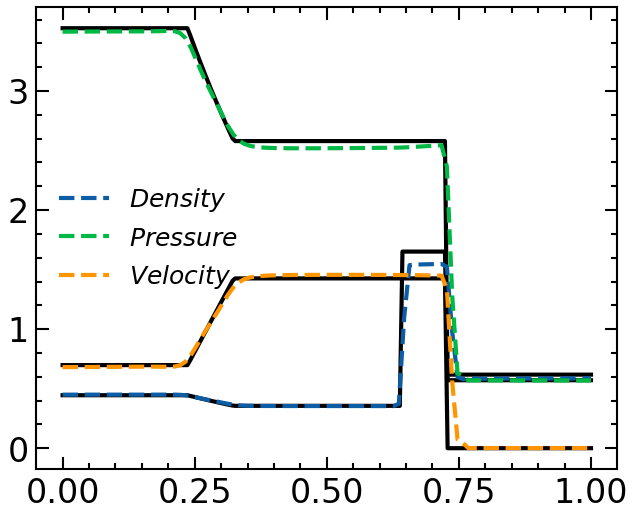

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0315,  0.2910],
        [-0.0236,  0.1942]], device='cuda:0', dtype=torch.float64) and tensor([[1.0160e+00, 5.1263e-05],
        [3.4748e-02, 9.9932e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0026,  0.0209,  0.0030,  0.5629,  0.0237,  0.4088]],
       device='cuda:0', dtype=torch.float64),tensor([[2.0431e-02, 9.0622e-02, 4.2617e-05, 4.8318e-01, 8.7372e-02, 3.1711e-01]],
       device='cuda:0', dtype=torch.float64),tensor([[2.3457e-02, 1.0235e-01, 1.3940e-04, 4.7145e-01, 8.7746e-02, 3.1185e-01]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 13000 | Loss: 0.041680


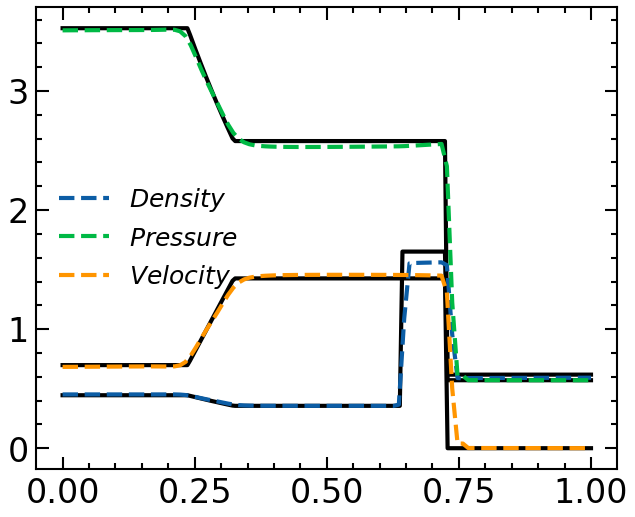

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[0.0752, 1.9136],
        [0.0126, 0.0123]], device='cuda:0', dtype=torch.float64) and tensor([[1.0167e+00, 5.1543e-04],
        [3.4669e-02, 9.9898e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0024,  0.0273,  0.0041,  0.5945,  0.0238,  0.3693]],
       device='cuda:0', dtype=torch.float64),tensor([[0.0087, 0.0928, 0.0013, 0.5095, 0.0877, 0.2976]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0184, 0.1135, 0.0020, 0.4764, 0.0894, 0.2981]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 14000 | Loss: 0.056261


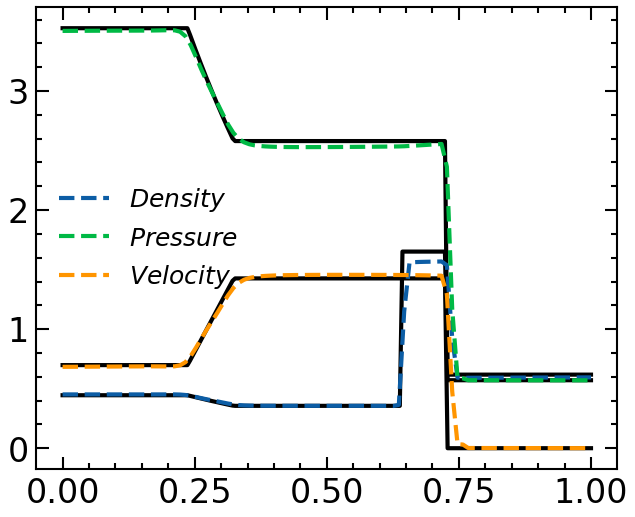

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0508, -0.4995],
        [-0.0231, -0.2798]], device='cuda:0', dtype=torch.float64) and tensor([[1.0167e+00, 5.1807e-04],
        [3.4727e-02, 9.9898e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0021,  0.0352,  0.0040,  0.6139,  0.0251,  0.3402]],
       device='cuda:0', dtype=torch.float64),tensor([[0.0146, 0.1090, 0.0014, 0.5100, 0.0999, 0.2630]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0229, 0.1302, 0.0019, 0.4755, 0.1017, 0.2657]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 15000 | Loss: 0.046118


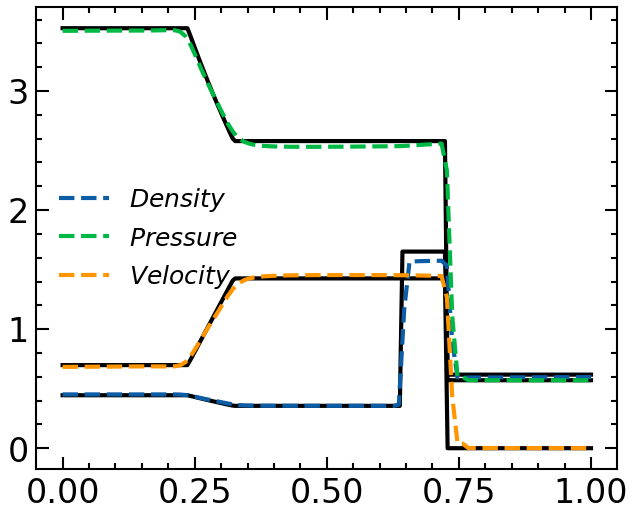

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.1073, -0.0214],
        [-0.0452,  0.4476]], device='cuda:0', dtype=torch.float64) and tensor([[1.0170e+00, 5.2751e-04],
        [3.5203e-02, 9.9902e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0010,  0.0374,  0.0053,  0.5650,  0.0655,  0.3476]],
       device='cuda:0', dtype=torch.float64),tensor([[0.0276, 0.1195, 0.0021, 0.5163, 0.0837, 0.2478]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0367, 0.1381, 0.0031, 0.4844, 0.0871, 0.2482]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 16000 | Loss: 0.167127


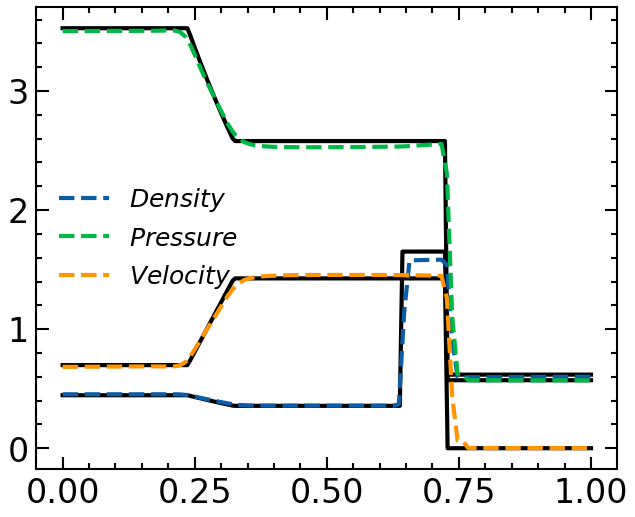

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0057, -0.5004],
        [-0.0135, -0.0685]], device='cuda:0', dtype=torch.float64) and tensor([[1.0174e+00, 6.6200e-04],
        [3.6591e-02, 9.9940e-01]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0009,  0.0323,  0.0029,  0.5738,  0.0849,  0.3272]],
       device='cuda:0', dtype=torch.float64),tensor([[2.4155e-02, 1.0444e-01, 5.1503e-04, 5.4678e-01, 8.4041e-02, 2.3872e-01]],
       device='cuda:0', dtype=torch.float64),tensor([[0.0339, 0.1227, 0.0007, 0.5128, 0.0862, 0.2407]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 17000 | Loss: 0.047371


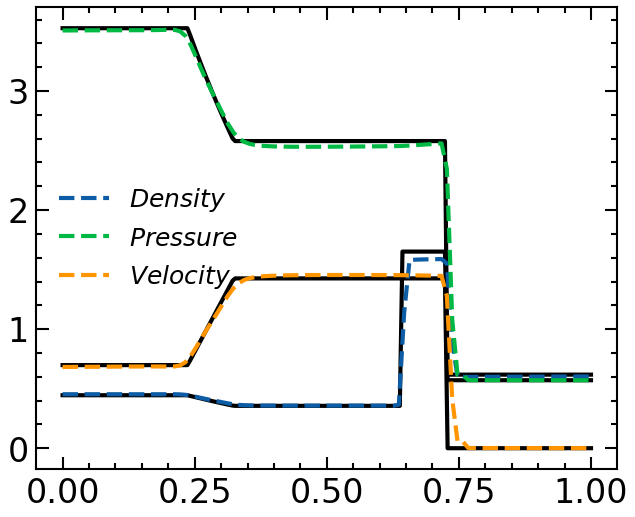

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ 0.0661, -0.6264],
        [-0.0125, -0.5499]], device='cuda:0', dtype=torch.float64) and tensor([[1.0176, 0.0010],
        [0.0372, 0.9993]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0011,  0.0424,  0.0060,  0.6423,  0.0472,  0.2810]],
       device='cuda:0', dtype=torch.float64),tensor([[0.0148, 0.1179, 0.0025, 0.5957, 0.0570, 0.2093]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0363, 0.1394, 0.0037, 0.5292, 0.0655, 0.2207]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 18000 | Loss: 0.059737


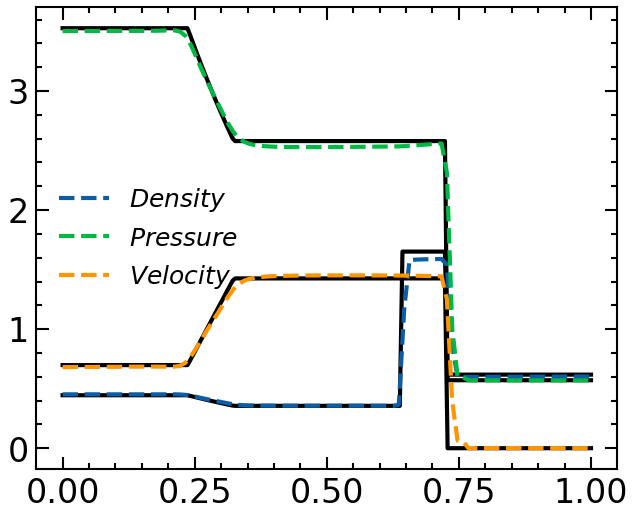

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[ -0.3206, -24.5829],
        [ -0.1347,  -9.5669]], device='cuda:0', dtype=torch.float64) and tensor([[1.0180, 0.0013],
        [0.0394, 0.9994]], device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[-0.0026,  0.0400,  0.0211,  0.6951,  0.0075,  0.2585]],
       device='cuda:0', dtype=torch.float64),tensor([[0.0110, 0.1102, 0.0037, 0.6278, 0.0400, 0.2034]], device='cuda:0',
       dtype=torch.float64),tensor([[0.0369, 0.1317, 0.0031, 0.5610, 0.0499, 0.2148]], device='cuda:0',
       dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 19000 | Loss: 0.069422


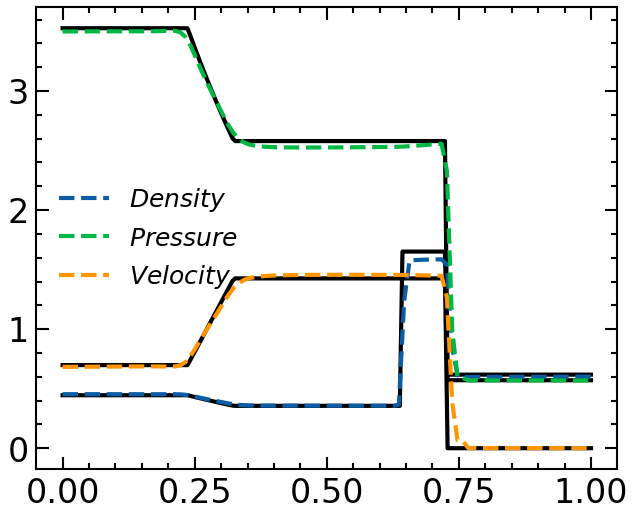

[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:tensor([[1.0182, 0.0012],
        [0.0462, 0.9999]], device='cuda:0', dtype=torch.float64) and tensor([[-0.0053,  0.0377,  0.0198,  0.7380, -0.0130,  0.2414]],
       device='cuda:0', dtype=torch.float64),tensor([[ 0.0097,  0.1105, -0.0068,  0.6613,  0.0233,  0.2022]],
       device='cuda:0', dtype=torch.float64),tensor([[ 0.0349,  0.1334, -0.0100,  0.5912,  0.0358,  0.2092]],
       device='cuda:0', dtype=torch.float64)
[0.445, 3.528, 0.698, 0.618, 0.571, 0.0]:Epoch: 20000 | Loss: 0.114014 (TGPT_PINN2 Step Criteria Met)



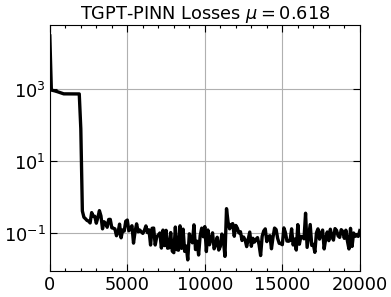

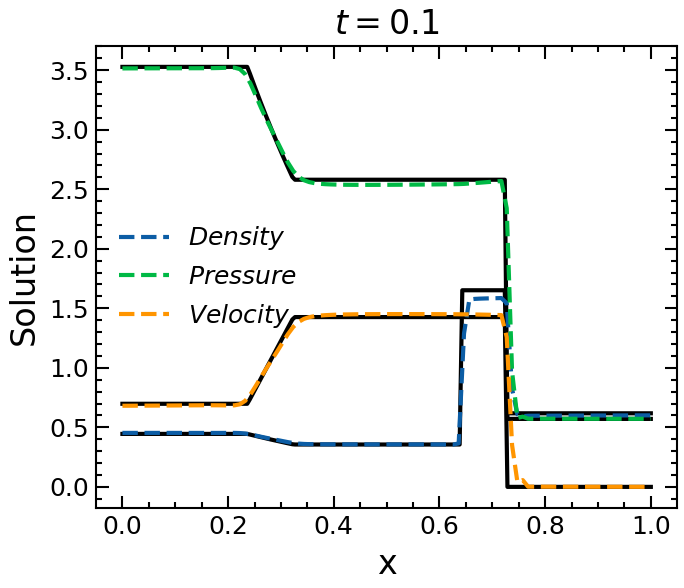

In [10]:
ini[3] = 0.618
weno_u = exact_solver([ini[0],ini[2],ini[1]],[ini[3],ini[5],ini[4]],gamma,Tf,N=200)
for i in range(0,number_of_neurons):
    layers_gpt = np.array([2, i+1, 3])
    c_initial  = torch.full((1,i+1), 1/(i+1))
    IC_data = create_IC_data(ini,Xi, Xf, Ti, Tf, IC_pts)
    IC_xt     = IC_data[0].to(device)
    IC_u      = IC_data[1]

    BC_data = create_BC_data(ini,Xi, Xf, Ti, Tf, IC_pts)
    BC_xt     = BC_data[0].to(device)
    BC_u      = BC_data[1]

    xt_en = Move_Time_1D(IC_xt, Tf).to(device)
    #weno_u = Euler_WENO(Xi,Xf,Ti,Tf,ini,gamma,delta_t=0.0001,delta_x=0.005)
    #weno_u = exact_solver([ini[0],ini[2],ini[1]],[ini[3],ini[5],ini[4]],gamma,Tf,N=200)
    TGPT_PINN = GPT(ini, layers_gpt, P_list[0:i+1], c_initial, Nc, Tc, gamma,Tf).to(device).double()
    
    tgpt_losses = gpt_train(TGPT_PINN, ini, xt_resid,  IC_xt, IC_u,BC_xt, BC_u, f_hat,xt_test,xt_en, xt_RH, xt_RHL,weno_u,  epochs_tgpt, lr_tgpt, 1e-3)

    loss_plot(tgpt_losses[1], tgpt_losses[2], dpi=80, figsize=(5,4),title=fr"TGPT-PINN Losses $\mu={round(ini[3],3)}$")
    
    Nx_test=N_test
    Nt_test=T_test
    plt.figure(dpi=150, figsize=(5,4))
    
    ind = 100
    plt.plot(weno_u[3],weno_u[0],'k')#,label="$Density$"
    plt.plot(weno_u[3],weno_u[1],'k')#,label="$Pressure$"
    plt.plot(weno_u[3],weno_u[2],'k')#,label="$velocity$"
    
    #plt.plot(xt_test[0::Nt_test,1].detach().cpu(),P_list[0](xt_test)[:,0:1][ind-1::Nx_test].detach().cpu(),'k',label=fr"$Density$")
    #plt.plot(xt_test[0::Nt_test,1].detach().cpu(),P_list[0](xt_test)[:,1:2][ind-1::Nx_test].detach().cpu(),'k',label=fr"$Pressure$")
    #plt.plot(xt_test[0::Nt_test,1].detach().cpu(),P_list[0](xt_test)[:,2:][ind-1::Nx_test].detach().cpu(),'k',label=fr"$Velocity$")
    
    plt.plot(xt_test[0::Nt_test,1].detach().cpu(),TGPT_PINN(xt_test)[0][ind-1::Nx_test].detach().cpu(),'--',label=fr"$Density$")
    plt.plot(xt_test[0::Nt_test,1].detach().cpu(),TGPT_PINN(xt_test)[1][ind-1::Nx_test].detach().cpu(),'--',label=fr"$Pressure$")
    plt.plot(xt_test[0::Nt_test,1].detach().cpu(),TGPT_PINN(xt_test)[2][ind-1::Nx_test].detach().cpu(),'--',label=fr"$Velocity$")
    plt.xlabel("x",     fontsize=16)
    plt.ylabel("Solution", fontsize=16)
    plt.title(fr"$t={round((ind-1)*(Tf-Ti)/(Nt_test-1),3)}$")
    plt.tick_params(axis='both', which='major', labelsize=12)
    plt.tick_params(axis='both', which='minor', labelsize=12)
    
    plt.legend(fontsize = 12)#
    plt.show()